<a href="https://colab.research.google.com/github/JoDeMiro/Micado-Research/blob/main/ML_Auto_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ToDo
letölteni a pythont és ott futtatni a kódot

huzzon egy nyomot a becslésre is, hogy lássam, hogy hova a faszomba becsüli az első modell
a mit is? ja igen a középtől való eltérést.

csinálni egy második modelt illetve kettőt

az egyik legyen a régi, de hagyjuk a faszba a fel-le becslést, az egész before aftert
és csak egyszerűen kössünk rá a becslésre valamilyen szabályt. Ha nagyobb mint x akkor +3

a másik verzió amit gyorsan ki kéne próbálni, hogy a linreg helyett beteszek egy mlp-t

**ToDo:**

Megnézni, hogy normalizálom-e az adatokat a neruális háló előtt, mert lehet hogy ez viszi félre a becslést.

# Micado Auto Scale Research

Ebben a felskálázási adatok elemzésével foglalkozom.

Ez az interkatív bemutató arra van, hogy a válotzók közötti összefüggéseket jobban átlásssam, elemezzem, az esetleges anomáliákat rögtön kiszúrjam.

A playground részben a rendszer alapját adó neuráli háló beállításaival lehet játszani és megfigyelni, hogy milyen hatással van a rendszer teljesítményére.

<a name="tartalom"></a>

## Tartalom

Bevezetés

> [Empty](#empty)<br>
> [Play Ground](#play_ground)<br>
> [SandBox](#sandbox)<br>
> [Before After](#beforeafter)<br>
> [Szintetikus adatok generálása](#szintetikus_adatok)<br>
> [Irodalom](#irodalom)<br>
> [ToDo](#todo)<br>


## Bevezető gondolat

Összességében az egésszel kapcsolatban van egy hatalmas kérdőjel.

Tulajdonképpen két paradigma van.

Az egyik - nem az enyém - így néz ki:

Egyszerűen becsüjük meg azt, hogy az adott szenzoros adatok alapján mi legyen a döntés kimenetele (fel, le, semmi). Akkor hoztunk jó döntést, ha valamilyen metrika alapján valamilyen költséget minimalizáltunk, vagy maximalizáltunk. Például, ha egy döntéssel sikerült közelebb kerülni a záróvonalhoz, vagyis az út közepére. Vagy az az autó a lehető legmeszebb jutott el anélkül, hogy érintette volna a falat és lehetőleg a leggyorsabban is.

A másik - amin én dolgozom - viszont egy plusz lépéssel egészül ki és ettől sokkal bonyolultabb. Hogy van-e létjogosultsága az ennek a kisérletnek a lényege.

Vannak szenzoros adataink, ami alapján hozunk egy döntést. Eddig olyan mint a máisik, de az érdemi különbség a módszerben és a tanulás folyamatában van.

A szenzoros adatokból megbecsüljük azt, hogy mennyire vagyunk jók és nem azt becsüljük, hogy mit kéne tenni!

Ha nem vagyunk jók akkor egy második modell segítségével csinálunk valamilyen lépést, amitől azt várjuk, hogy jók leszünk.

És itt jogosan merül fel a kérdés, hogy de miért nem az első módszert alkalmazzuk és erre most még én sem tudom a választ pontosan megadni. De röviden erről szól ez a kutatás.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.neural_network import MLPRegressor

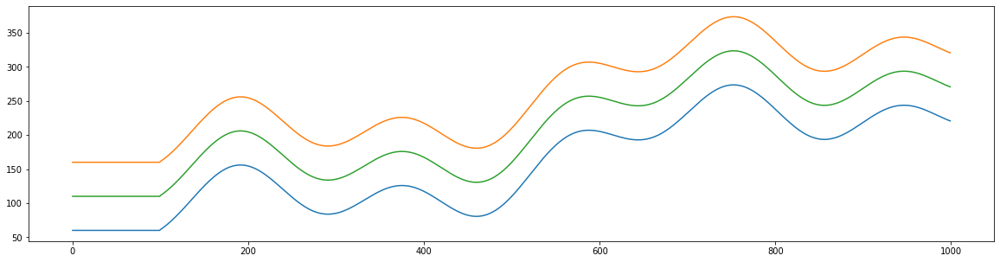

In [78]:
distance    = np.arange(0, 1000, 1)
road        = 100
wall_left   = 30*(np.sin(distance/180)) + distance * 0.3 + 30 * np.cos(distance/30) + 50 * np.sin(distance/90)
wall_left[0:100] = 60
wall_right  = wall_left + road
wall_center = ( wall_left + wall_right ) / 2


plt.figure(figsize=(20,5)); plt.plot(wall_left); plt.plot(wall_right); plt.plot(wall_center); plt.show()

In [79]:
class Road():
  def __init__(self, wide):
    self.distance    = np.arange(0, 1000, 1)
    self.wide        = wide
    self.wall_right  = 30*(np.sin(self.distance/180)) + self.distance * 0.3 + 30 * np.cos(self.distance/30) + 50 * np.sin(self.distance/90)
    self.wall_right[0:100] = 60
    self.wall_left   = self.wall_right + self.wide
    self.wall_center = ( self.wall_left + self.wall_right ) / 2

  def show(self):
    fig, ax = plt.subplots(figsize=(20,5)); ax.set_ylim(0, 400); ax.plot(self.wall_left); ax.plot(self.wall_right); ax.plot(self.wall_center);
    return fig, ax


In [80]:
class NeuralNetwork():
  def __init__(self):
    self.mlp = MLPRegressor(hidden_layer_sizes=(4,),
                           max_iter=50,
                           activation='relu', # tanh, relu, logistic
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           n_iter_no_change=50,
                           random_state=1234)
    
    self.scaler_X = MinMaxScaler()
    self.scaler_y = MinMaxScaler()

In [81]:
class Car():
  def __init__(self, road, mlp):
    self.road = road
    self.x = 0
    self.y = self.road.wall_center[0]
    self.sight = 300           # ennyit lát előre

    self.y_history  = []
    self.x_history  = []
    self.y_center   = []; self.y_center = self.road.wall_center
    self.y_distance = []
    self.y_distance_real = []
    self.y_distance_predicted = []
    self.mlp        = mlp
    self.regression = LinearRegression()
    self.sensor_center = []
    self.sensor_left   = []
    self.sensor_right  = []
    self.before  = []
    self.after   = []


  def calculate_distances(self):
    # ha bármikor kevesebb a faltól mért távolsága bármelyik szenzoron akkor a szenzorokon mért távolság is ennyi lesz
    
    k = self.x; d = 0
    while(k < self.x + self.sight):
      k += 1; d += 1
      self.distance_center_from_wall = d
      if(int(self.road.wall_left[k]) < self.y):
        print('Sensor center = ', self.distance_center_from_wall)
        break
      if(int(self.road.wall_right[k]) > self.y):
        print('Sensor center = ', self.distance_center_from_wall)
        break

    k = self.x; d = 0
    while(k < self.x + self.sight):
      k += 1;  d += 1
      self.distance_left_from_wall = d
      if(int(self.road.wall_left[k]) < self.y + d):
        print('Sensor from left wall = ', self.distance_left_from_wall)
        break

    k = self.x; d = 0
    while(k < self.x + self.sight):
      k += 1; d += 1
      self.distance_right_from_wall = d
      if(int(self.road.wall_right[k]) > self.y - d):
        print('Sensor from right wall = ', self.distance_right_from_wall)
        break

    #ki kell kalkulálni a tényleges távolságot a ball és a jobb faltól
    # mert ezekre fogom tanítani a neurális hálót, ahol ezeket becsüljük
    # és a bemeneti változó a 3 szenzorból érkező adat lesz.
    # valójában azt mérjük, hogy milyen távolságra van az út közepétől

    self.distance_from_top     = abs(self.road.wall_left[self.x] - self.y)
    self.distance_from_bottom  = abs(self.road.wall_right[self.x] - self.y)
    print('most távolsagra van a felső faltól = ', self.distance_from_top)
    print('most távolsagra van az alsó faltól = ', self.distance_from_bottom)


    print('cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc')
    print('self.x                       = ', self.x)
    print('cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc')

    # mi lenne, ha mégis inkább a kettő hányadosát becsülném (1 ha egyenlő távolságra van)
    # vertical_distance_from_middle = self.road.wall_center[self.x] - self.y
    self.vertical_distance_from_middle = self.distance_from_top / self.distance_from_bottom

    print('ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa = ', self.vertical_distance_from_middle)


    # de elötte szeretnék még valamit leellenőrizni
    # ezeknek a hossza nem fog megeggyezni a tényleges futások számával, hanem több lesz (milyen jó lett volna erre egy teszt esetet írni és akkor test driven development lenne)

    print('\t\t\t ---------------- Teszt ----------------')
    print('\t\t\t len(self.y_distance)    = ', len(self.y_distance))
    print('\t\t\t len(self.sensor_left)   = ', len(self.sensor_left))
    print('\t\t\t len(self.sensor_center) = ', len(self.sensor_center))
    print('\t\t\t len(self.sensor_right)  = ', len(self.sensor_right))
    print('\t\t\t self.x                  = ', self.x)
    print('\t\t\t -------------- Teszt End --------------')


  def append(self):
    self.y_distance.append(self.vertical_distance_from_middle)

    self.sensor_left.append(self.distance_left_from_wall)
    self.sensor_center.append(self.distance_center_from_wall)
    self.sensor_right.append(self.distance_right_from_wall)

    print('\t\t\t ---------------- Append ----------------')
    print('\t\t\t len(self.y_distance)    = ', len(self.y_distance))
    print('\t\t\t len(self.sensor_left)   = ', len(self.sensor_left))
    print('\t\t\t len(self.sensor_center) = ', len(self.sensor_center))
    print('\t\t\t len(self.sensor_right)  = ', len(self.sensor_right))
    print('\t\t\t self.x                  = ', self.x)
    print('\t\t\t -------------- Append End --------------')


  def run(self):
    for i in range(0, 400, 1):
      self.x = i
      self.calculate_distances()
      # !!!
      self.append()
      # !!!
      if( i % 1 == 0):
        self.plot()
      if( i >= 0 ):
        if( i % 3 == 0 and i >= 12 ):
          print('------------------------------ IF i % 3 == 0 ------------------------------')
          print('# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)')
          X = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
          y = np.array([self.y_distance]).T
          print('X.shape = ', X.shape)
          print('y.shape = ', y.shape)
          print('X       = ', X)
          print('y       = ', y)
          print('i       = ', i)
          self.regression.fit(X, y)
          print('\t\t ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------')
          self.mlp.scaler_X.fit(X)
          X = self.mlp.scaler_X.transform(X)
          # self.mlp.scaler_y.fit(y)
          # y = self.mlp.scaler_y.transform(y)
          print('-------------- after scaler fit transform assagine --------------------')
          print('X       = ', X)
          print('y       = ', y)

          self.mlp.mlp.fit(X, y)
        if( i % 3 == 1 and i >= 12 ):
          print('------------------------------ IF i % 3 == 1 ------------------------------')
          print('# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja')
          X = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
          _X = np.array([X[-1,:].reshape(-1,1)])
          _X = np.array([X[-1,:]])
          print('actual _X = ', _X)
          predicted = self.regression.predict(_X)
          print('\t\t ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------')
          _X = self.mlp.scaler_X.transform(_X)
          print('actual _X = ', _X)
          predicted = self.mlp.mlp.predict(_X)
#most
          self.y_distance_real.append(self.y_distance[-1])
          self.y_distance_predicted.append(predicted)
          print('actual predicted = ', predicted)
          # print('actual predicted = {:.5f}'.format(predicted[0,0]))
          print('actual self.y_distance[-1] = ', self.y_distance[-1])
          print('actual self.y_distance     = ', self.y_distance)

          print(len(self.y_distance_real))
          print(len(self.y_distance_predicted))

          # olyan szar a becslés, hogy az hihetetlen
          plt.figure(figsize=(12, 5)); plt.scatter(self.y_distance_real, self.y_distance_predicted); plt.show()


        # most jön az, hogy véletlenszerűen kell egyet ugrania fel, vagy le
        # ez felel meg a before after dologonak
        # az így létrejött adatokat is el kell tárolni úgy mint
        # mi volt a szezoros adat before
        # mi lett a szenzoros adat after
        # mi volt az y before, mi lett az y after
        # mivel mindíg egyet fogunk csak lépni, ezért a dif mindíg egy lesz
        # de ezt számítani kell, mivel a későbbiek folyamán lehet, hogy többet is fog lépni

        if( i % 3 == 2 ):                   # 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
          
          if( i % 2 == 0 ):                           # Minden második lépésben fel (valójában minden 6-ik lépésben)
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y + 1
            print('up')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
          if( i % 2 == 1 ):                           # Minden második lépésben le (valójában minden 6-ik lépésben)
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y - 1
            print('down')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))

          print('self.y = ', self.y)

        if( len(self.before) > 9 ):           # ha már van néhány before after adatunk, akkor
          print('Van elég before after adatunk')
          # minden egyes szezor adatára el kell készítenünk azt a lineráis regressziós modelt ami megmondja, hogy mi lenne a szenzor értéke, ha 1, 2, 3, ... n lépéssel elvinnénk a kocsit

          # oké megvan a before és megvan az after (self.y, left, center, right)
          before_array = np.array(self.before)
          after_array  = np.array(self.after)
          y_delta = after_array[:,0] - before_array[:,0]
          delta_array = after_array - before_array
          print('--------------------------------------')
          print(y_delta)
          print(before_array.shape)
          print(after_array.shape)
          print(self.before)
          print(self.after)
          print(delta_array)
          print('--------------------------------------')

          # képlet szerint senzor' = w0 + w1 * senzor + w2 * delta_y
          # valójában ez a képlet nem jó és nem így kéne számolni, mert ez figyelembe veszi a szenzor aktuális értékét is, de most így hagyom

          _X_left = np.array([before_array[:,1], delta_array[:,0]]).T # left és delta_y
          _y_left = delta_array[:,1].reshape(-1, 1)
          regression_left = LinearRegression()
          regression_left.fit(_X_left, _y_left)
          print(regression_left.coef_)

          _X_center = np.array([before_array[:,2], delta_array[:,0]]).T # center és delta_y
          _y_center = delta_array[:,2].reshape(-1, 1)
          regression_center = LinearRegression()
          regression_center.fit(_X_center, _y_center)
          print(regression_center.coef_)

          _X_right = np.array([before_array[:,3], delta_array[:,0]]).T # right és delta_y
          _y_right = delta_array[:,3].reshape(-1, 1)
          regression_right = LinearRegression()
          regression_right.fit(_X_right, _y_right)
          print(regression_right.coef_)

          # most ki kell számolni, hogy mennyi lenne a szenzorok értéke, ha fel le lépkednénk

          # mondjuk maximalizáljuk a fel le lépkedés mértékét 5-ben

          move = np.array([-5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5])

          move = np.array([-2, -1, 0, 1, 2])

          move = np.array([-3, -2, -1, 0, 1, 2, 3])

# most

          action = 0; tmp = 999999990

          for j in move:
            # ide be kell helyettesítenem az éppen aktuális értéket, olyan mintha egy új X változót csinálnék amiben csak egy sor van és arra kérnék egy becslést a korábbi modell alapján
            # a bement az éppen aktuális szenzoros érték és az új lépés
            _X_left   = np.array([[self.distance_left_from_wall, j]])
            _X_center = np.array([[self.distance_center_from_wall, j]])
            _X_right  = np.array([[self.distance_right_from_wall, j]])

            # valószínűleg a fenti értékek nem jók, még nem tudom, hogy miért nem jönnek ki jól, de teljesen rendszeridegen értékeket adnak

            # ezért most csak a próba kedvéért kicserélem őket egy statikus, de reális értékre

            predicted_left   = regression_left.predict(_X_left)
            predicted_center = regression_center.predict(_X_center)
            predicted_right  = regression_right.predict(_X_right)

            # nem is lenne baj, ha frissen gyorsan be is tennénk ezek az értékek a másik - az autóút közepét becslő - modellbe ezeket az értékeket

            # nem elfelejteni, hogy amit itt becsülünk az az út közepétől való eltérés mértéke (tehát 10.2189 az azt jelenti, hogy ennyivel van eltérve a középtől)

            # nekünk majd azt az értéket kell választanunk amelyik segítségével a legközelebb jutunk a 0 értékhez

            _X = np.array([predicted_left.ravel(), predicted_center.ravel(), predicted_right.ravel()]).T    # figyelni kell rá, hogy eredetileg is ez volt-e a változók sorrendje

            print('-------------------------X-------------------------')
            print(_X)
            print('---------------Brutálisan hülye dolgot jelez előre ezért ellenőrizni kell, hogy mi a gond. Esetleg a bemeneti adatok?-----------------')
            
            predicted_position = self.regression.predict(_X)

            predicted_position = self.mlp.mlp.predict(_X)

            print(predicted_position)
            print('---------------------------------------------------------------------------------------------------------------------------------------')


# vigyázat a kocsi pozicióját csak akkor lehet módosítani amikor nincs se becslés, se before after mérés

            # legyünk bátrak és módosítsuk az autó self.y pozicióját

            # azzal az értékkel amely abszolút értékben a legkissebb, helyett
            # mivel a célváltozónk akkor jó ha 1. mivel a felső/alsótól mért távolság hányadosa
            # ezért itt azt az értéket kell kiválasztani ami a legközelebb van +1-hez (és nem azt amelyik 0-hoz)

            # természetesen ezen változtatni kell ha ismét az középvonaltól való eltérés mértékét akarjuk becsülni
            # de ahhoz fenti is át kell állítani az adatokat


# most
            if( abs(1 - predicted_position) < tmp):       # rossz - javítva - tesztelés alatt
              action = j
              tmp = abs(1 - predicted_position)
              print('\t---------------------')
              print('\t action = ', action)
              print('\t predicted_position = ', predicted_position)
              print('\t tmp = ', tmp)
              print('\t---------------------')


            print('\t j = ', j)
          print('-------------- hello -------------')

          # természetes itt meg az a gond, hogy közben az i ciklusszámlálót többször is felülirtam
          print('\t\t az i ciklusszámláló értéke = ', i)
          if( i % 3 == 0 ):                                                       # ugyan ez a feltétel amikor tanítom az út közepének a becslésére
            print('-------- ennyivel módosítom self.y értékét --------')
            print('self.y régi értéke = ', self.y)
            self.y = self.y + action
            print('self.y új értéke   = ', self.y)
            print('action             = ', action)
            print('----------------- módosítás vége -----------------')

          # újra kell gondolni az egészet, ugyanis akkor is ki kell számolni a before after értéket amikor modosítom a pozicióját,
          # vagyis végig kell gondolni ezt az egészet.
          # az első elképzelésem az volt, hogy a poziciót csak bizonyos esetben modosíthatom, csak akkor amikor nincs tanítás, és nincs szimulált emelés, vagy csökkentés sem
          # utóbbit az if( i % 3 == 2) feltétellel szűrtem


      # adjuk hozzá az értéket a self.y_history-hoz
      print('# A run ciklus vége ---------------------------------------------')
      print('#   itt adom hozzás a self.y a self.y_history-hoz')
      self.y_history.append(self.y)
      print('#    self.y :')
      print(self.y)
      print('#   self.y_history after append :')
      print(self.y_history)
      print('óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó')
          



  def plot(self):
    fig, ax = self.road.show()
    circle = plt.Circle((self.x, self.y), 5, color='black')
    ax.add_patch(circle)
    ax.plot(range(int(self.x), int(self.x+self.distance_center_from_wall)), np.repeat(self.y, self.distance_center_from_wall))
    ax.plot(range(int(self.x), int(self.x+self.distance_left_from_wall)), range(int(self.y), int(self.y+self.distance_left_from_wall)))
    ax.plot(range(int(self.x), int(self.x+self.distance_right_from_wall)), range(int(self.y), int(self.y-self.distance_right_from_wall), -1))
    if( len(self.y_history) > 0 ):
      ax.plot(self.y_history)
    plt.show()

Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------


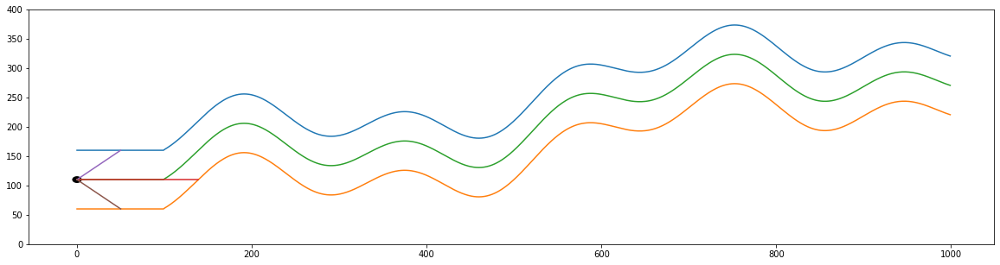

In [82]:
mlp = NeuralNetwork()
road = Road(wide = 100)
auto = Car(road, mlp)

auto.calculate_distances()
auto.plot()

In [83]:
auto.calculate_distances()

Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------


Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------
			 ---------------- Append ----------------
			 len(self.y_distance)    =  1
			 len(self.sensor_left)   =  1
			 len(self.sensor_center) =  1
			 len(self.sensor_right)  =  1
			 self.x                  =  0
			 -------------- Append End --------------


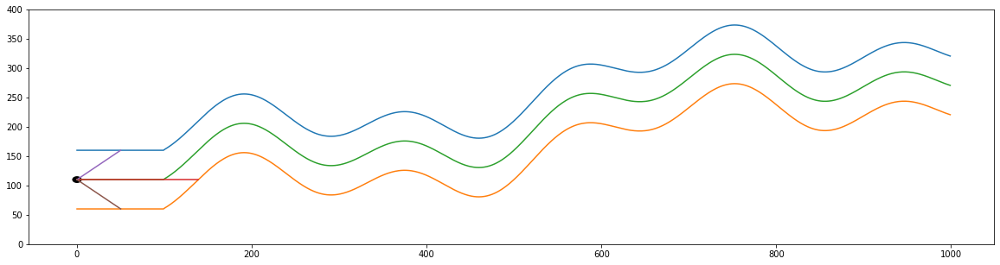

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  139
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  1
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  1
			 len(self.sensor_left)   =  1
			 len(self.sensor_center) =  1
			 len(self.sensor_right)  =  1
			 self.x                  =  1
			 -------------- Teszt End --------------
			 ---------------- Append ----------------
			 len(self.y_distance)    =  2
			 len(self.

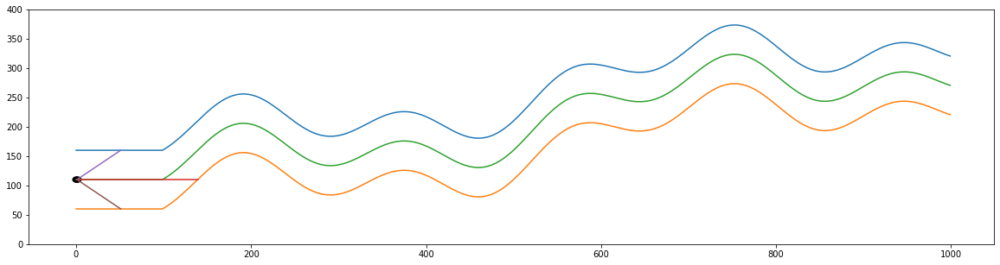

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  138
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  2
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  2
			 len(self.sensor_left)   =  2
			 len(self.sensor_center) =  2
			 len(self.sensor_right)  =  2
			 self.x                  =  2
			 -------------- Teszt End --------------
			 ---------------- Append ----------------
			 len(self.y_distance)    =  3
			 le

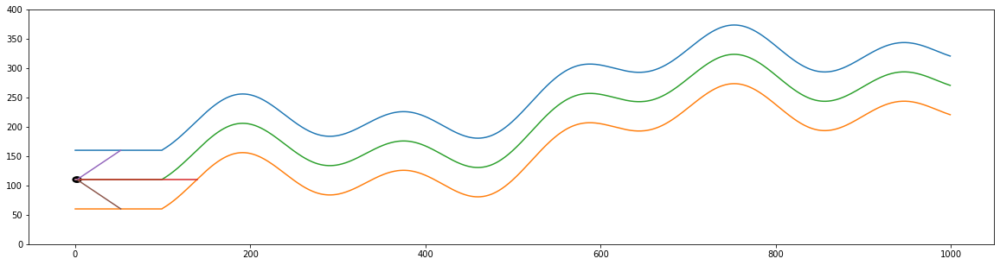

up
Sensor center =  139
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  2
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  3
			 len(self.sensor_left)   =  3
			 len(self.sensor_center) =  3
			 len(self.sensor_right)  =  3
			 self.x                  =  2
			 -------------- Teszt End --------------
self.y =  111.0
# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  138
Sensor from left wall 

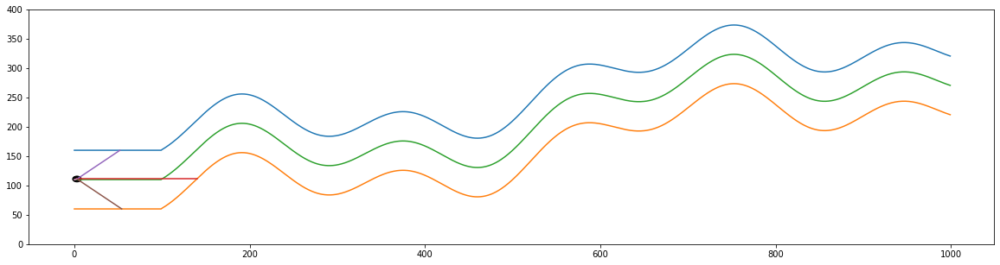

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  137
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  4
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  4
			 len(self.sensor_left)   =  4
			 len(self.sensor_center) =  4
			 len(self.sensor_right)  =  4
			 self.x                  =  4
			 -------------- Teszt End --------------
			 ---------------- Append ----------------
			 len(se

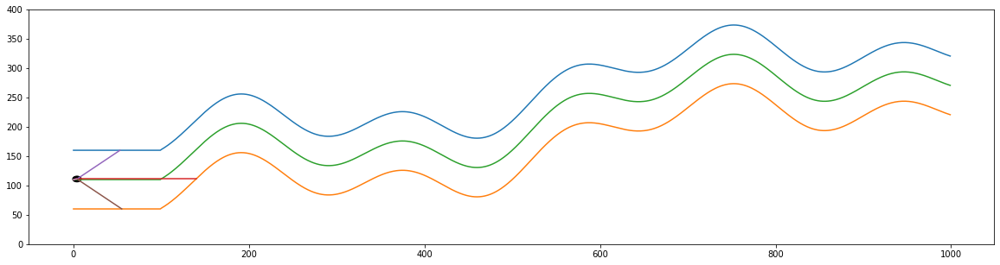

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  136
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  5
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  5
			 len(self.sensor_left)   =  5
			 len(self.sensor_center) =  5
			 len(self.sensor_right)  =  5
			 self.x                  =  5
			 -------------- Teszt End --------------
			 ---------------- Append ----------------
			

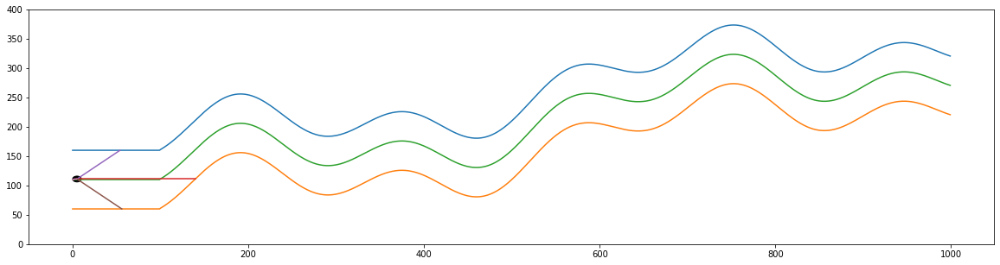

down
Sensor center =  135
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  5
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  6
			 len(self.sensor_left)   =  6
			 len(self.sensor_center) =  6
			 len(self.sensor_right)  =  6
			 self.x                  =  5
			 -------------- Teszt End --------------
self.y =  110.0
# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  134
Sensor from le

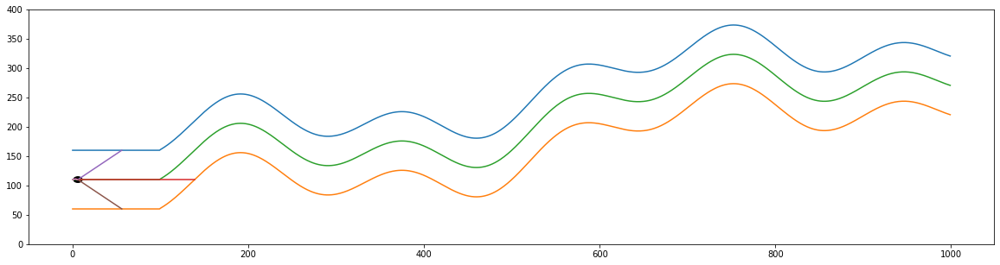

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  133
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  7
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  7
			 len(self.sensor_left)   =  7
			 len(self.sensor_center) =  7
			 len(self.sensor_right)  =  7
			 self.x                  =  7
			 -------------- Teszt End --------------
			 ---------------- Append ----------------
			 

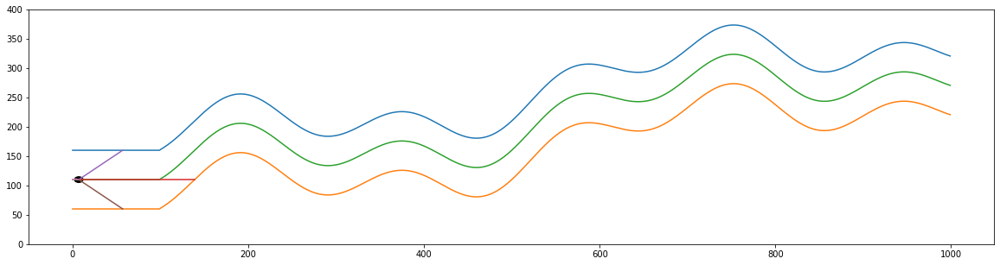

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  132
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  8
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  8
			 len(self.sensor_left)   =  8
			 len(self.sensor_center) =  8
			 len(self.sensor_right)  =  8
			 self.x                  =  8
			 -------------- Teszt End --------------
			 ---------------- Append --------------

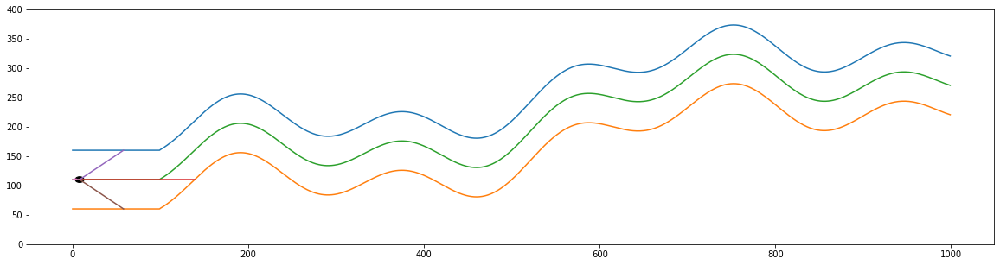

up
Sensor center =  133
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  8
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  9
			 len(self.sensor_left)   =  9
			 len(self.sensor_center) =  9
			 len(self.sensor_right)  =  9
			 self.x                  =  8
			 -------------- Teszt End --------------
self.y =  111.0
# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
S

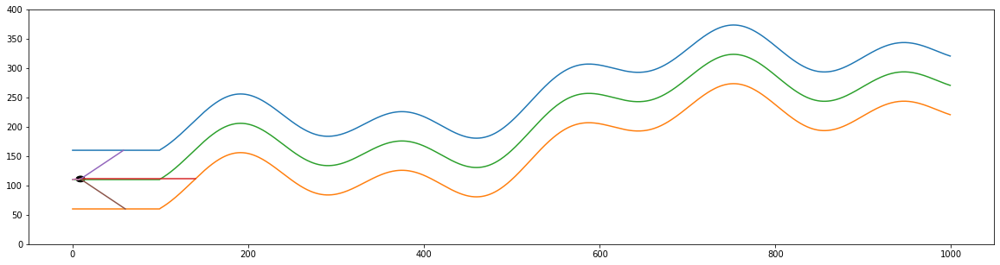

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  131
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  10
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  10
			 len(self.sensor_left)   =  10
			 len(self.sensor_center) =  10
			 len(self.sensor_right)  =  10
			 self.x                  =  10
			 -------------- Teszt End --------------
			 ---

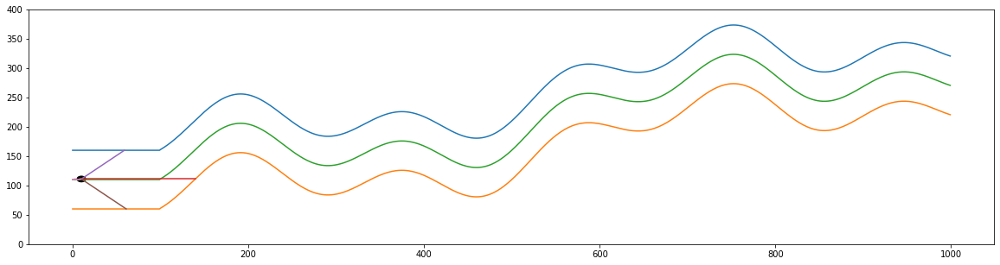

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  130
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  11
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  11
			 len(self.sensor_left)   =  11
			 len(self.sensor_center) =  11
			 len(self.sensor_right)  =  11
			 self.x                  =  11
			 -------------- Teszt End --------------


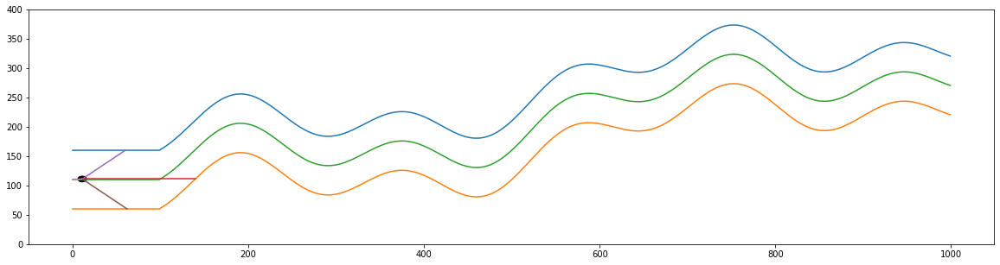

down
Sensor center =  129
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  11
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  12
			 len(self.sensor_left)   =  12
			 len(self.sensor_center) =  12
			 len(self.sensor_right)  =  12
			 self.x                  =  11
			 -------------- Teszt End --------------
self.y =  110.0
# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó

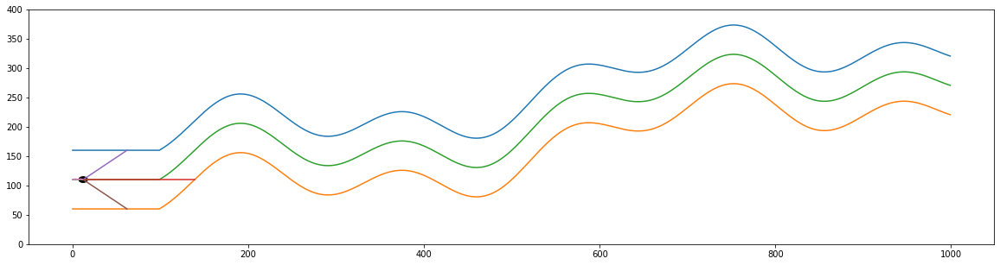

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (13, 3)
y.shape =  (13, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]]
i       =  12
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
-------------- after scaler fit transform assagine --------------------
X       =  [[1.         1.         0.        ]
 [1.         0.91666667 0.        ]
 [1.         0.83333333 0.        ]
 [0.         0.83333333 1.        ]
 [0.         0.75       1.       

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


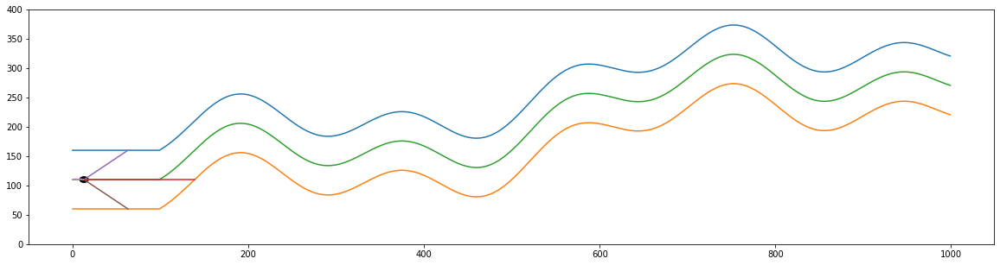

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 51 127  51]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 1.         -0.08333333  0.        ]]
actual predicted =  [0.99930173]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0]
1
1


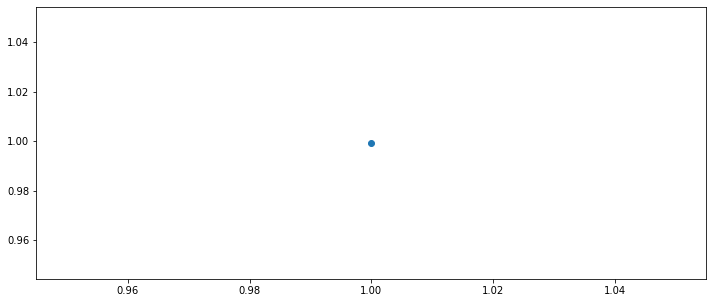

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  126
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  14
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  14
			 len(self.sensor_left)   =  14
			 len(self.sensor_center) =  14
			 len(self.sensor_right)  =  14
			 self.x                  =  14
			 -------------- Teszt End ---------

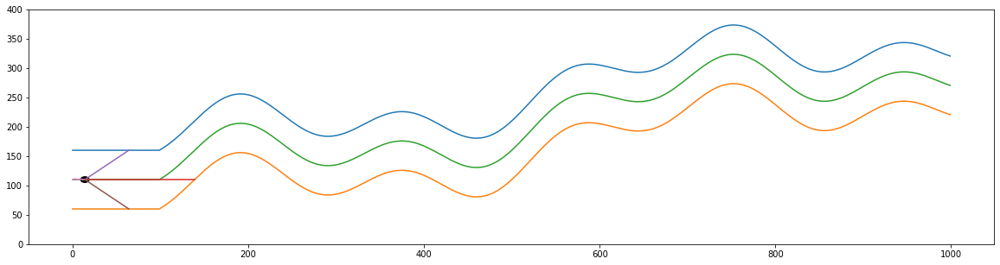

up
Sensor center =  127
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  14
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  15
			 len(self.sensor_left)   =  15
			 len(self.sensor_center) =  15
			 len(self.sensor_right)  =  15
			 self.x                  =  14
			 -------------- Teszt End --------------
self.y =  111.0
# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóó

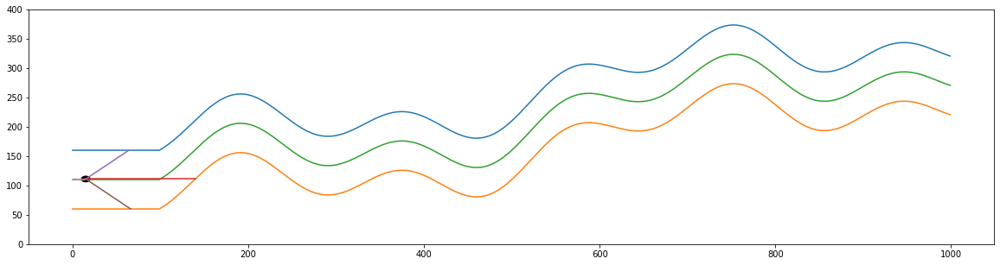

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (16, 3)
y.shape =  (16, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]]
i       =  15
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
-------------- after scaler fit transform assagine --------------------
X       =  [[1.         1.         0.        ]
 [1.         0.92857143 0.        ]
 [1.         0.857

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


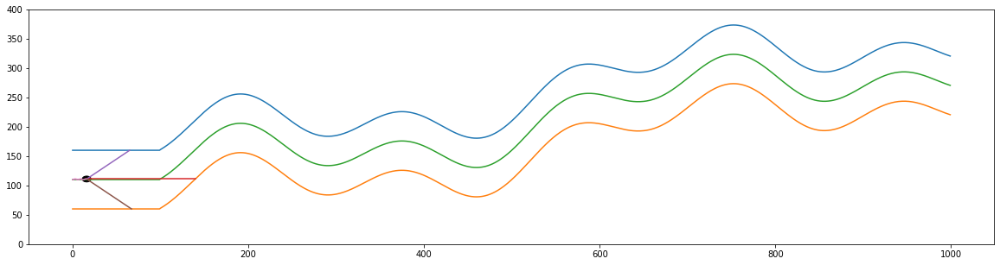

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 50 125  52]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.         -0.07142857  1.        ]]
actual predicted =  [0.96180032]
actual self.y_distance[-1] =  0.9607843137254902
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902]
2
2


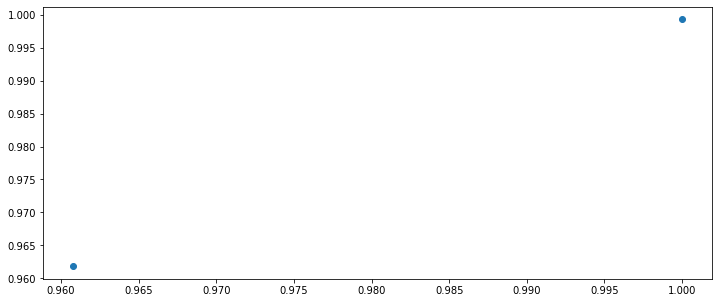

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  124
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  17
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  17
			 len(self.sensor_left)   =  17
			 len(self.sensor_center) =  17
			 len(self.sensor_right)  =  17
			 self.x                  =  17
		

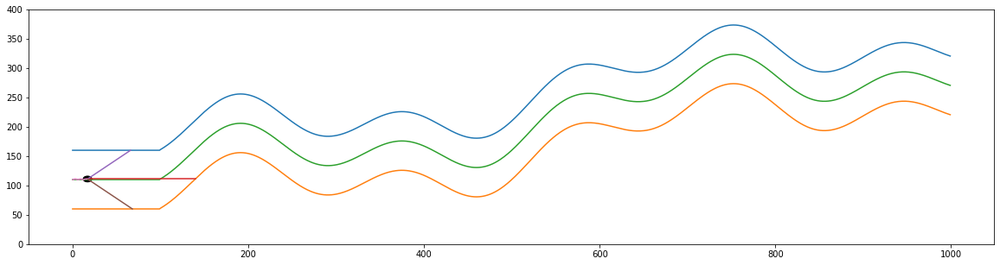

down
Sensor center =  123
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  17
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  18
			 len(self.sensor_left)   =  18
			 len(self.sensor_center) =  18
			 len(self.sensor_right)  =  18
			 self.x                  =  17
			 -------------- Teszt End --------------
self.y =  110.0
# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0]
óóóóóóóóóóóóóóóóóóóó

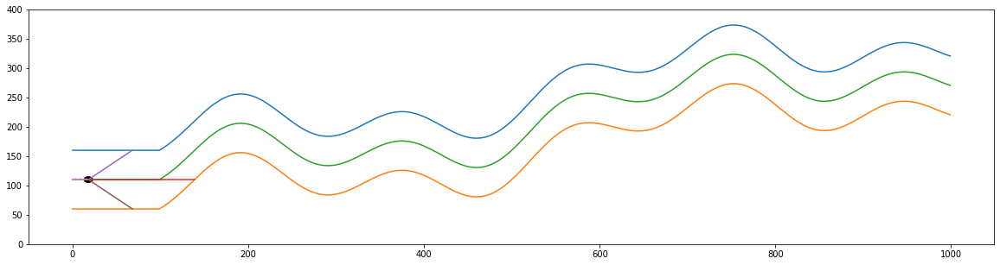

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (19, 3)
y.shape =  (19, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]]
i       =  18
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
-------------- after scaler fit transform assagine --------------------
X       =  [[1

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


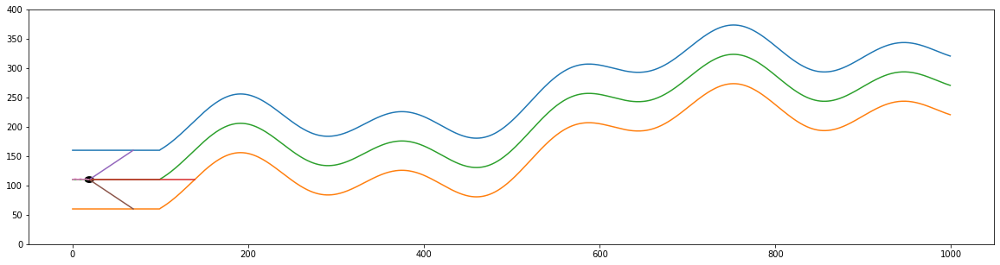

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 51 121  51]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 1.         -0.05555556  0.        ]]
actual predicted =  [1.0000114]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0]
3
3


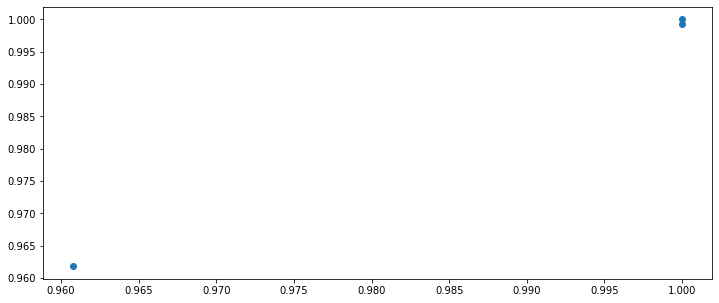

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  120
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  20
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  20
			 len(self.sensor_left)   =  20
			 len(self.sensor_center) =  20
			 len(self.sensor_right)  =  20
			 self.x                  = 

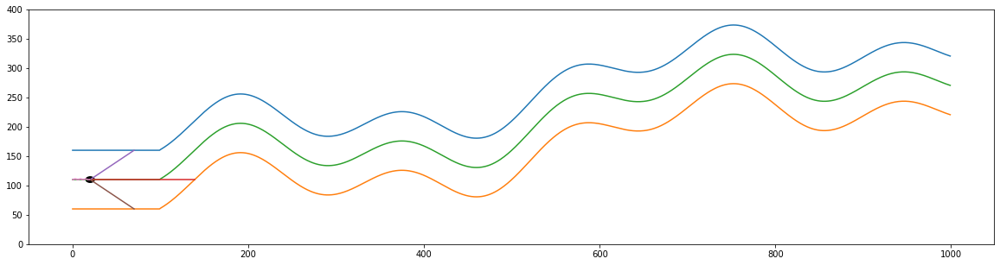

up
Sensor center =  121
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  20
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  21
			 len(self.sensor_left)   =  21
			 len(self.sensor_center) =  21
			 len(self.sensor_right)  =  21
			 self.x                  =  20
			 -------------- Teszt End --------------
self.y =  111.0
# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 

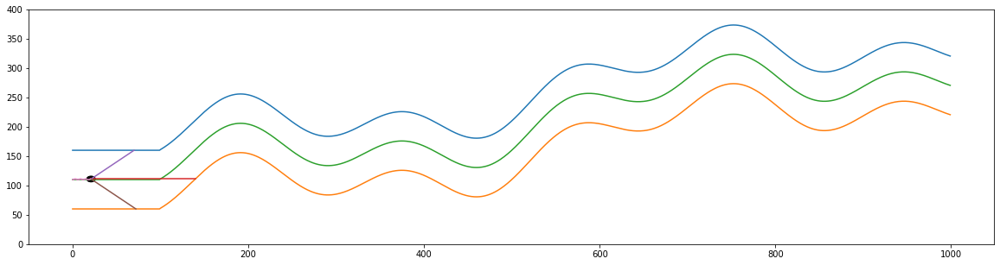

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (22, 3)
y.shape =  (22, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]]
i       =  21
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


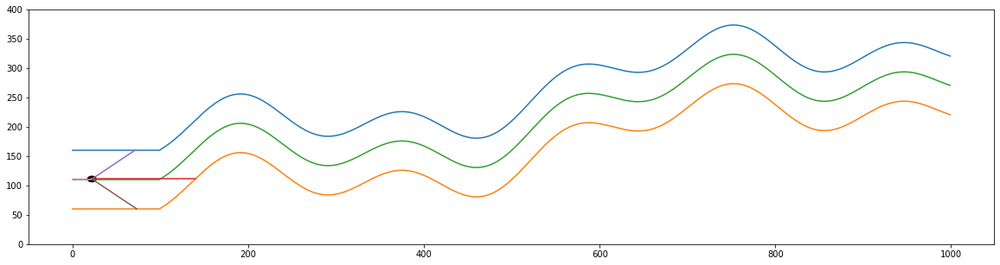

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 50 119  52]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.   -0.05  1.  ]]
actual predicted =  [0.96094059]
actual self.y_distance[-1] =  0.9607843137254902
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902]
4
4


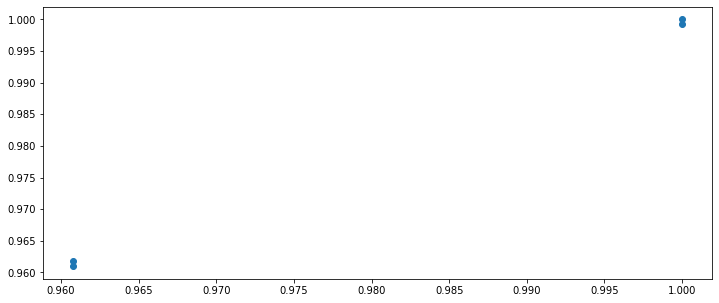

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  118
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  23
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  23
			 len(self.sensor_left)   =  23
			 len(self.sensor_center) =  23
			 len(self.sensor_right)  

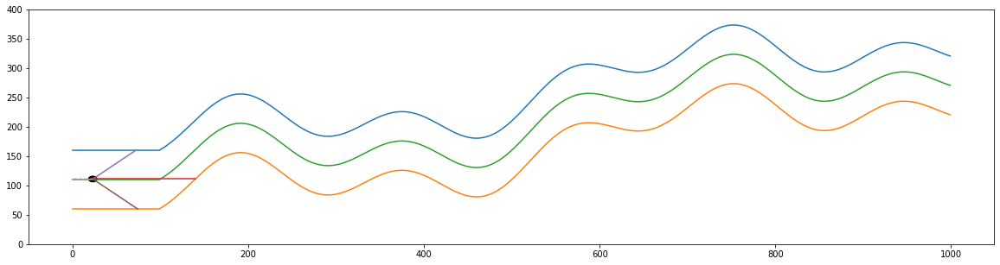

down
Sensor center =  117
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  23
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  24
			 len(self.sensor_left)   =  24
			 len(self.sensor_center) =  24
			 len(self.sensor_right)  =  24
			 self.x                  =  23
			 -------------- Teszt End --------------
self.y =  110.0
# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0,

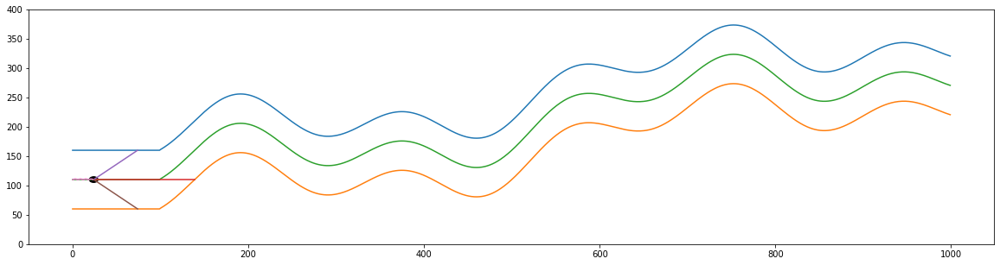

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (25, 3)
y.shape =  (25, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]]
i       =  24

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


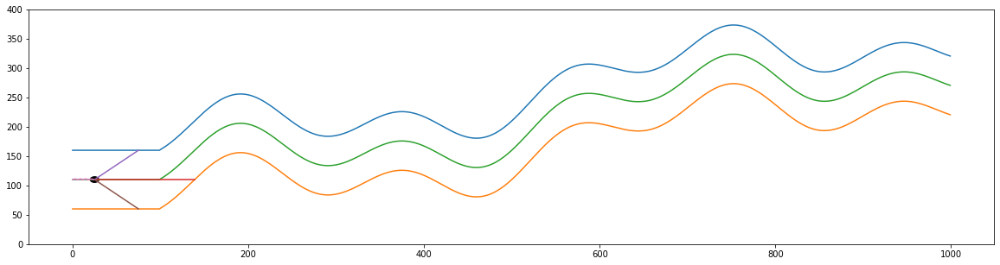

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 51 115  51]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 1.         -0.04166667  0.        ]]
actual predicted =  [0.99904085]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0]
5
5


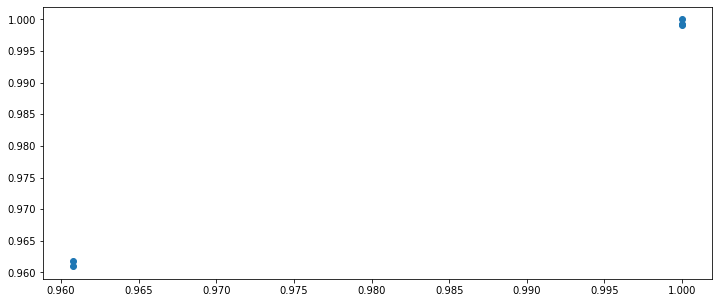

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  114
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  26
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  26
			 len(self.sensor_left)   =  26
			 len(self.sensor_center) =  26
			 len(self.sensor_ri

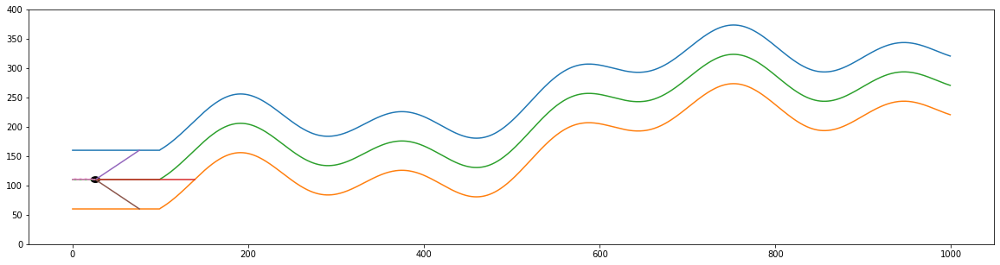

up
Sensor center =  115
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  26
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  27
			 len(self.sensor_left)   =  27
			 len(self.sensor_center) =  27
			 len(self.sensor_right)  =  27
			 self.x                  =  26
			 -------------- Teszt End --------------
self.y =  111.0
# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 

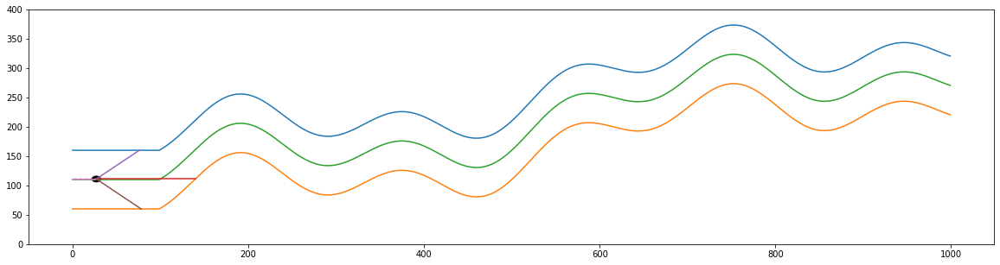

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (28, 3)
y.shape =  (28, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.9607843

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


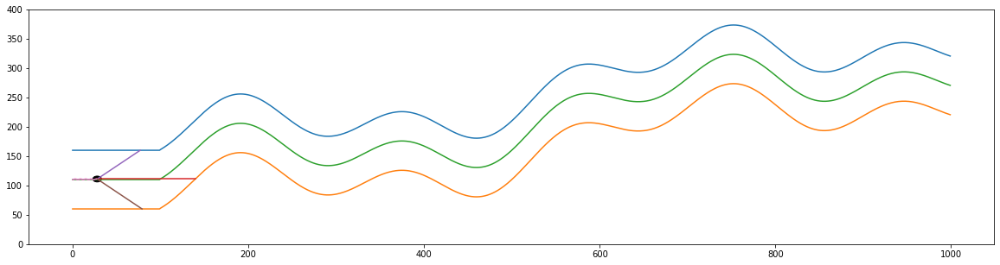

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 50 113  52]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.         -0.03846154  1.        ]]
actual predicted =  [0.96159206]
actual self.y_distance[-1] =  0.9607843137254902
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902]
6
6


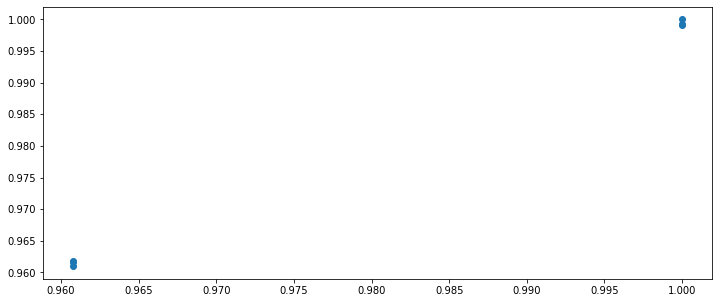

# A run ciklus vége ---------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0]
óóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóóó
Sensor center =  112
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  29
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  29
			 len(self.sensor_left)   =  29
			 len(self.sensor_

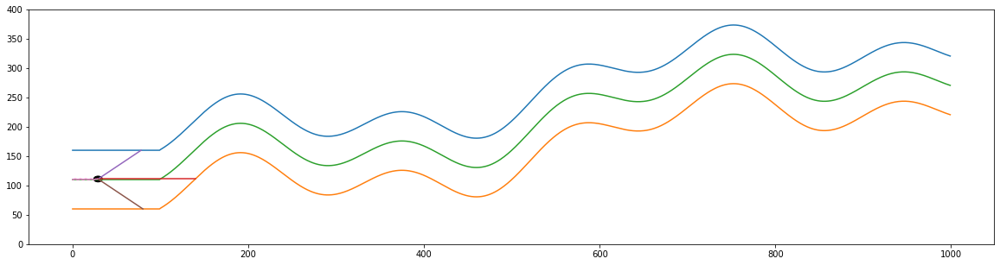

down
Sensor center =  111
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  29
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  30
			 len(self.sensor_left)   =  30
			 len(self.sensor_center) =  30
			 len(self.sensor_right)  =  30
			 self.x                  =  29
			 -------------- Teszt End --------------
self.y =  110.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(10, 4)
(10, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,

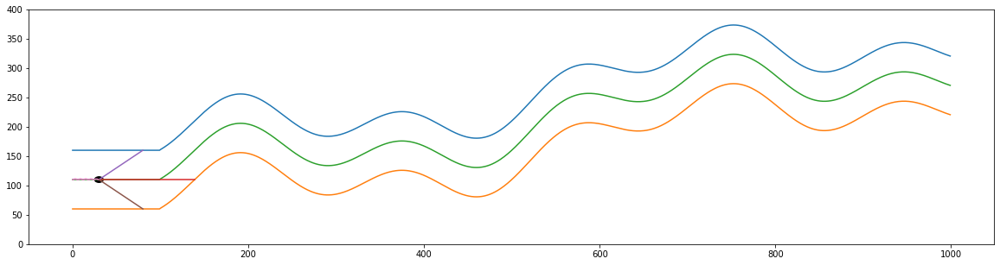

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (31, 3)
y.shape =  (31, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.    

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


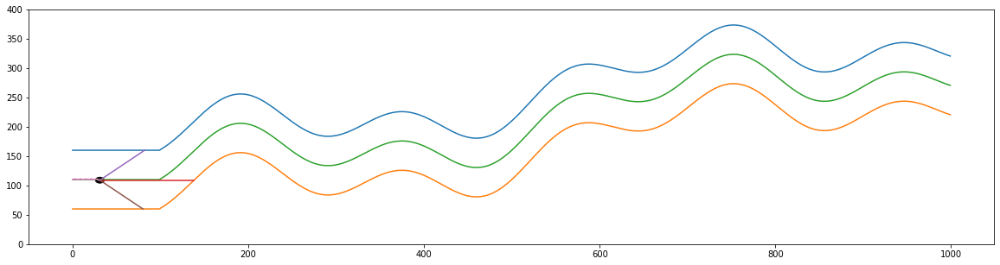

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 52 108  50]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 2.         -0.06666667 -1.        ]]
actual predicted =  [1.03815165]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123]
7
7


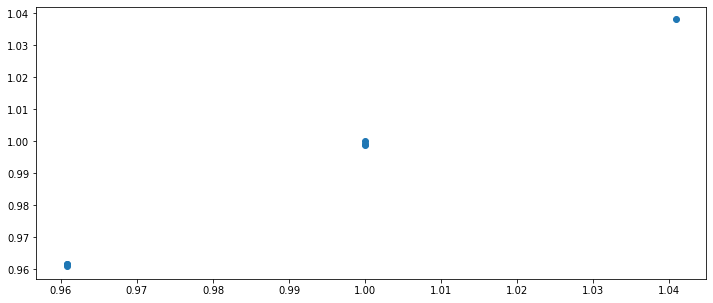

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(10, 4)
(10, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  51., 117.,  51.]), array([111.,  50., 115.,  52.]), array([110.,  51., 111.,  51.])]
[[ 1. -1.  1.  1.]
 [-1.  1. -1. -1.]
 [ 1. -1.  1.  1.]
 [-1.  1. -1. -1.]
 [ 1. -1.  1.  1.]
 [-1.  1. -1. -1.]
 [ 1. -1.  1.  1.]
 [-1.  1. -1. -1.]
 [ 1. -1.  1.  1.]
 [-1.  1. -1. -1.]]
--------------------

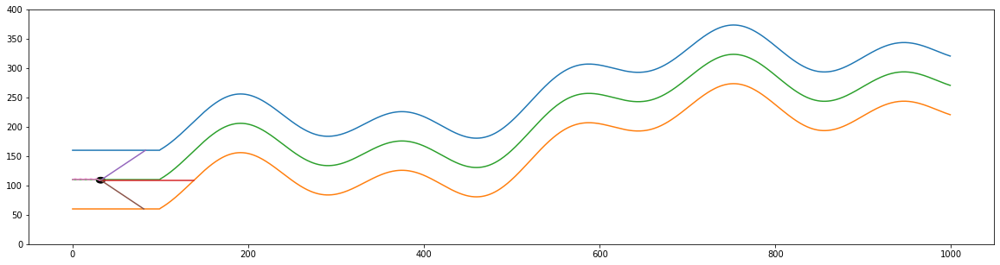

up
Sensor center =  108
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  32
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  33
			 len(self.sensor_left)   =  33
			 len(self.sensor_center) =  33
			 len(self.sensor_right)  =  33
			 self.x                  =  32
			 -------------- Teszt End --------------
self.y =  110.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(11, 4)
(11, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124

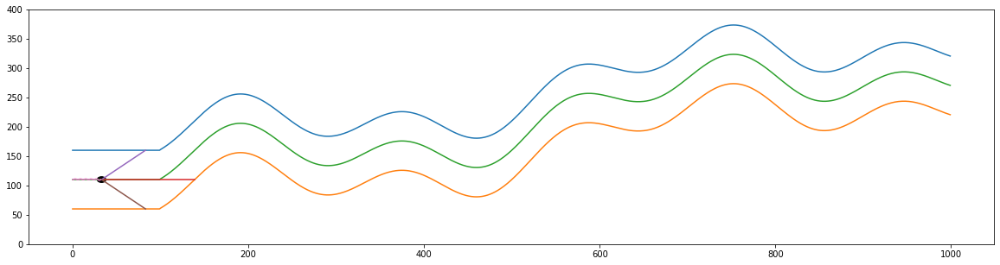

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (34, 3)
y.shape =  (34, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.9

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


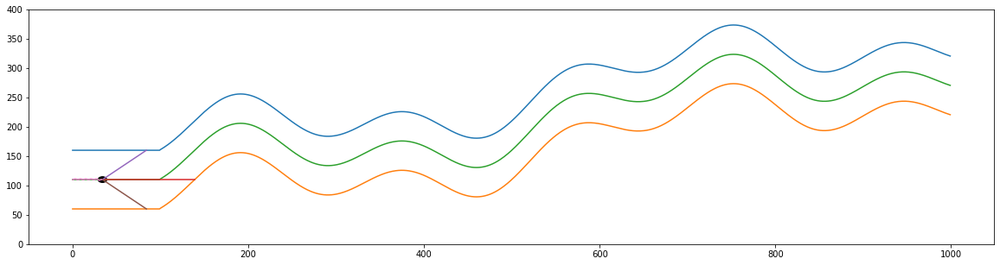

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 51 106  51]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.5        -0.03030303  0.5       ]]
actual predicted =  [1.00100042]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0]
8
8


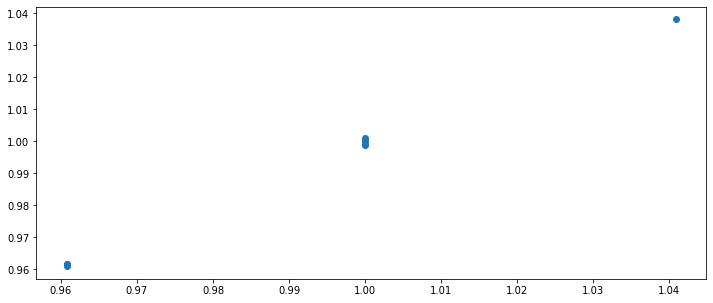

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(11, 4)
(11, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  51., 117.,  51.]), array([111.,  50., 115.,  52.]), array([110.,  51., 111.,  51.]), array([110.,  51., 108.,  51.])]
[[ 1. -1.  1.  1.]
 [-1.  1. -1. -1.]
 [ 1. -1.  1.  1.]
 [-1.  1. -1. -1.]
 [ 1. -1.  1.  1.]
 [-1.  1. -1. -1.]
 [ 1. -1.  1.  1.]
 [-1.  1

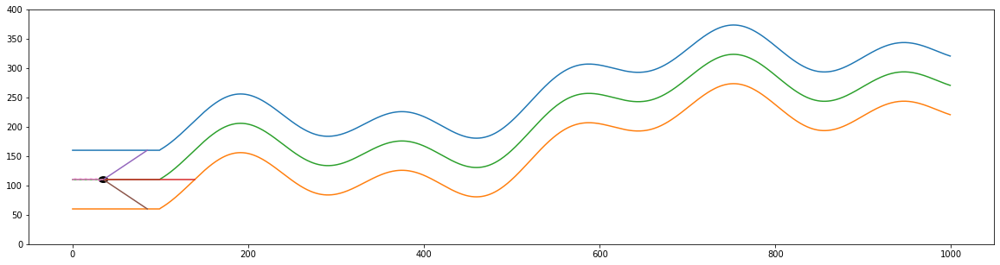

down
Sensor center =  104
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.0
most távolsagra van az alsó faltól =  49.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  35
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0408163265306123
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  36
			 len(self.sensor_left)   =  36
			 len(self.sensor_center) =  36
			 len(self.sensor_right)  =  36
			 self.x                  =  35
			 -------------- Teszt End --------------
self.y =  109.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(12, 4)
(12, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), a

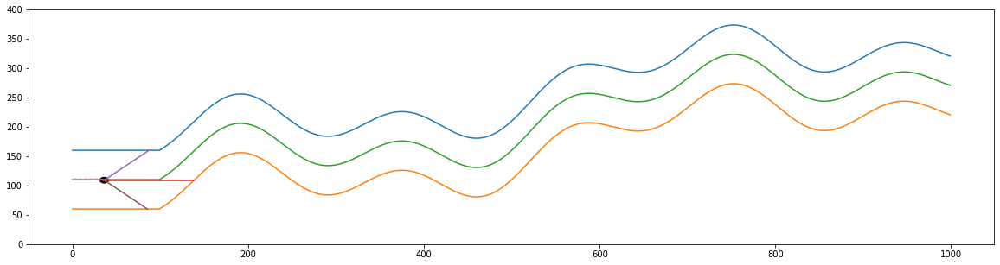

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (37, 3)
y.shape =  (37, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


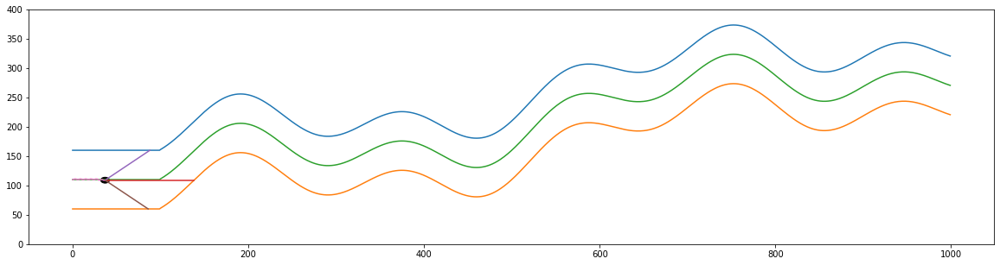

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 52 102  50]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 1.         -0.02702703  0.        ]]
actual predicted =  [1.04367399]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123]
9
9


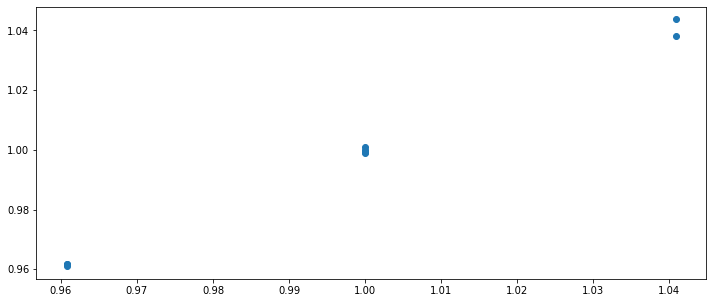

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(12, 4)
(12, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  51., 117.,  51.]), array([111.,  50., 115.,  52.]), array([110.,  51., 111.,  51.]), array([110.,  51., 108.,  51.]), array([109.,  52., 104.,  50.])]
[[ 1. -1.  1.  1.]
 [-1.  1. -1. -1.]
 [ 1. -1.  1.  1.]
 [-1.  1. -1. 

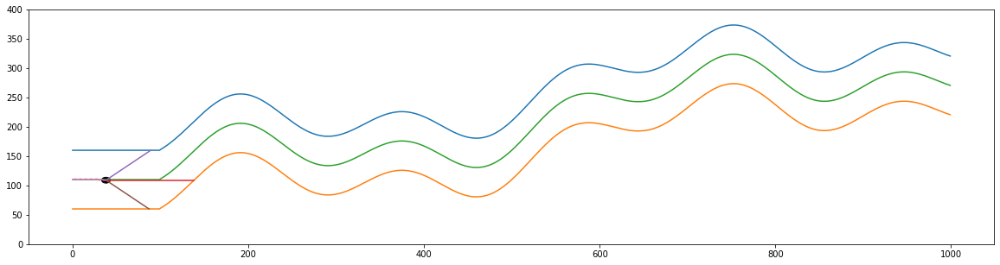

up
Sensor center =  102
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  38
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  39
			 len(self.sensor_left)   =  39
			 len(self.sensor_center) =  39
			 len(self.sensor_right)  =  39
			 self.x                  =  38
			 -------------- Teszt End --------------
self.y =  110.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(13, 4)
(13, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  

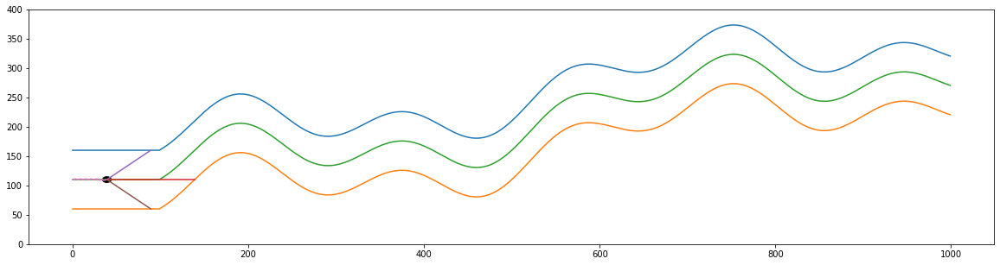

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (40, 3)
y.shape =  (40, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


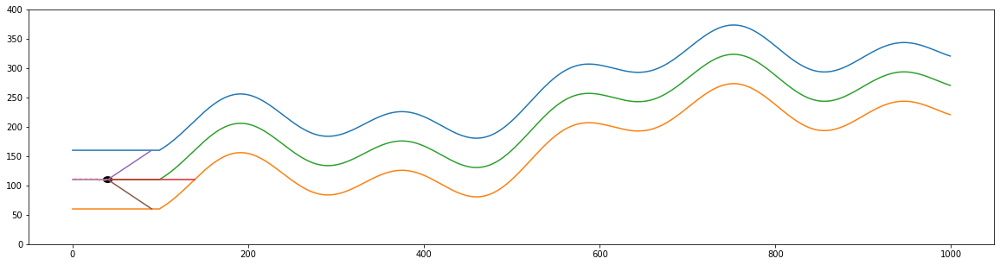

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[ 51 100  51]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.5        -0.02564103  0.5       ]]
actual predicted =  [1.00189842]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0]
10
10


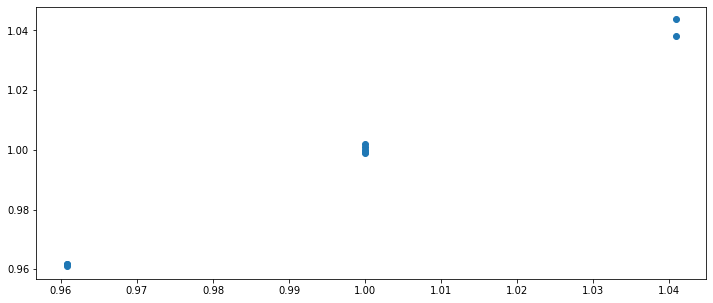

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(13, 4)
(13, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  51., 117.,  51.]), array([111.,  50., 115.,  52.]), array([110.,  51., 111.,  51.]), array([110.,  51., 108.,  51.]), array([109.,  52., 104.,  50.]), array([110.,  51., 102.,  51.])]
[

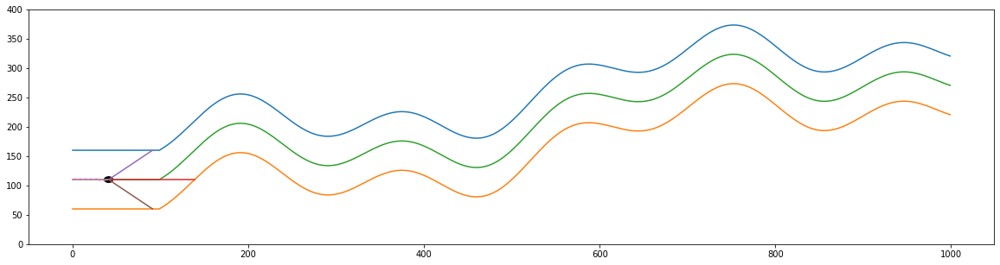

down
Sensor center =  98
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.0
most távolsagra van az alsó faltól =  49.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  41
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0408163265306123
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  42
			 len(self.sensor_left)   =  42
			 len(self.sensor_center) =  42
			 len(self.sensor_right)  =  42
			 self.x                  =  41
			 -------------- Teszt End --------------
self.y =  109.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(14, 4)
(14, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  5

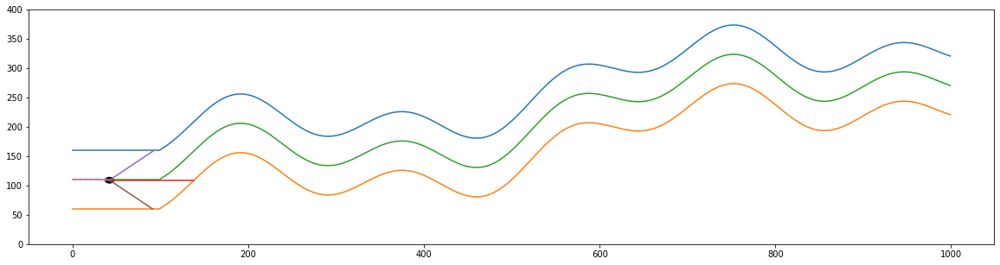

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (43, 3)
y.shape =  (43, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.96078431]
 [0.96078431]
 [0.96078431]
 [1.      

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


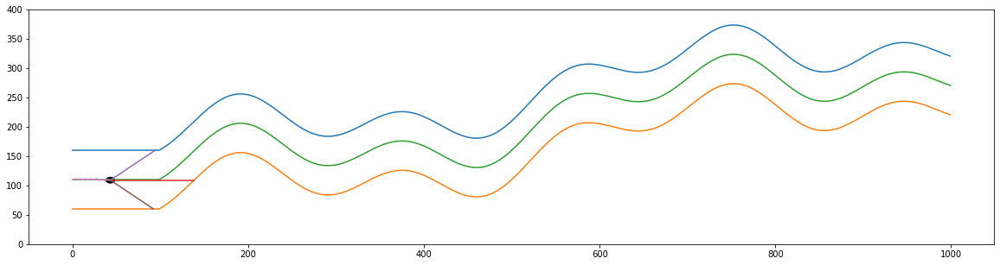

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[52 96 50]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 1.         -0.02325581  0.        ]]
actual predicted =  [1.03464032]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0,

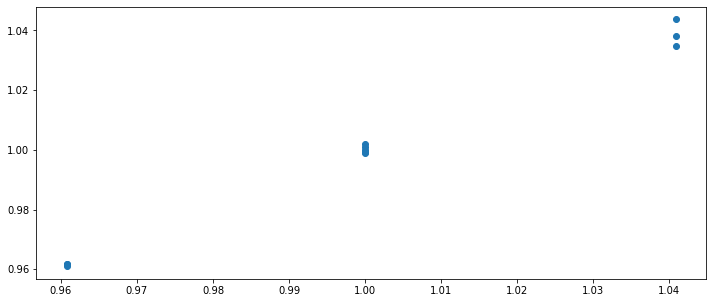

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(14, 4)
(14, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  51., 117.,  51.]), array([111.,  50., 115.,  52.]), array([110.,  51., 111.,  51.]), array([110.,  51., 108.,  51.]), array([109.,  52., 104.,  50.]

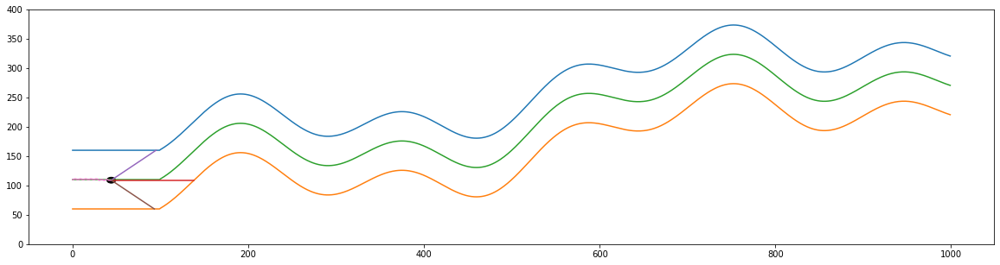

up
Sensor center =  96
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  44
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  45
			 len(self.sensor_left)   =  45
			 len(self.sensor_center) =  45
			 len(self.sensor_right)  =  45
			 self.x                  =  44
			 -------------- Teszt End --------------
self.y =  110.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(15, 4)
(15, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([

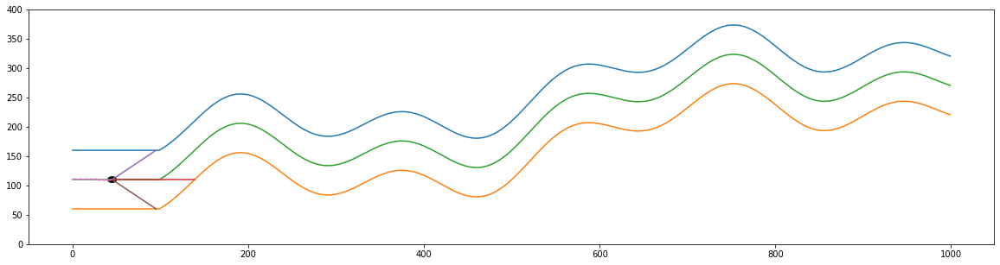

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (46, 3)
y.shape =  (46, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]]
y       =  [[1.        ]
 [1.        ]
 [1.        ]
 [0.960

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


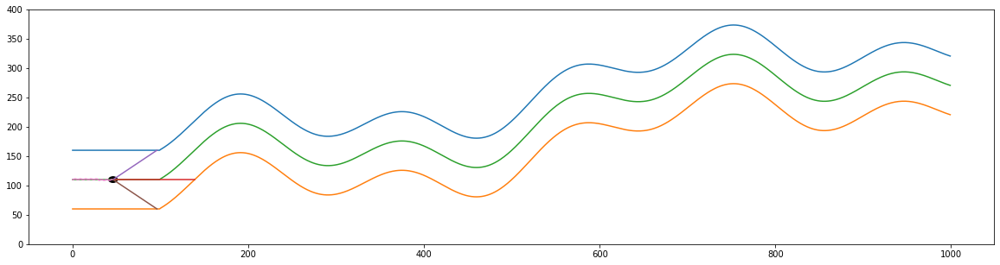

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[51 94 51]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.5        -0.02222222  0.5       ]]
actual predicted =  [0.9998594]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.04081632

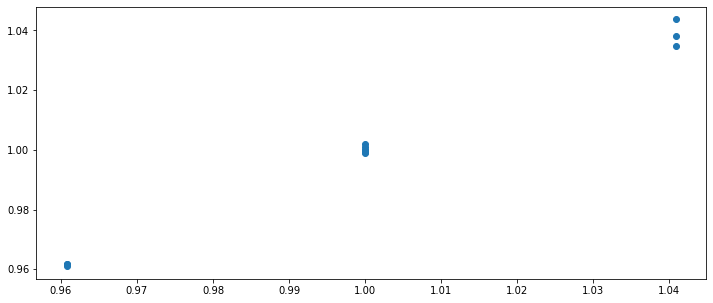

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(15, 4)
(15, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  51., 117.,  51.]), array([111.,  50., 115.,  52.]), array([110.,  51., 111.,  51.]), array([110.,  51., 108.,  

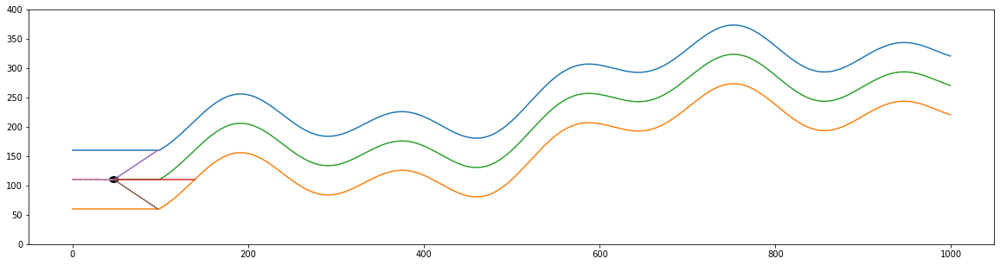

down
Sensor center =  92
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.0
most távolsagra van az alsó faltól =  49.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  47
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0408163265306123
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  48
			 len(self.sensor_left)   =  48
			 len(self.sensor_center) =  48
			 len(self.sensor_right)  =  48
			 self.x                  =  47
			 -------------- Teszt End --------------
self.y =  109.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(16, 4)
(16, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 

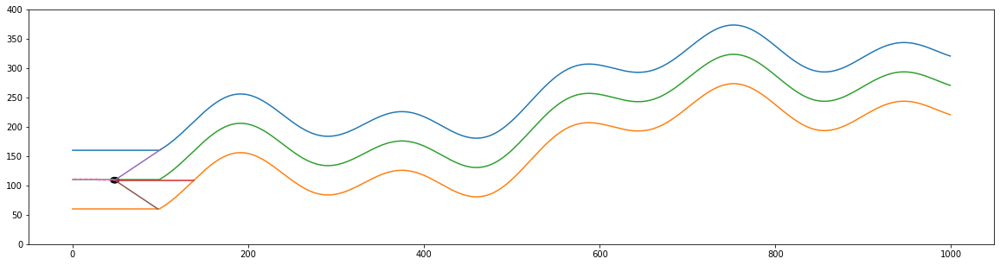

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (49, 3)
y.shape =  (49, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]]
y       =  [[1.

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


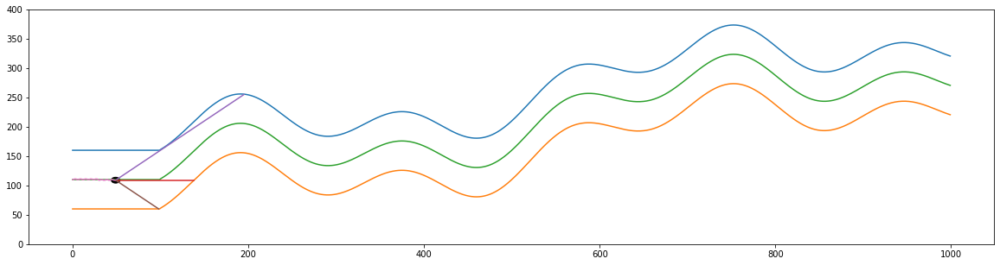

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[147  90  50]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 2.42500000e+01 -2.04081633e-02  0.00000000e+00]]
actual predicted =  [1.13855298]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.040816326530

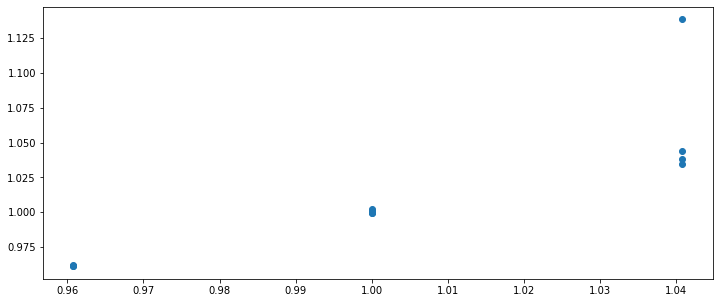

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(16, 4)
(16, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  51., 117.,  51.]), array([111.,  50., 115.,  52.]), array([110.,  51., 111

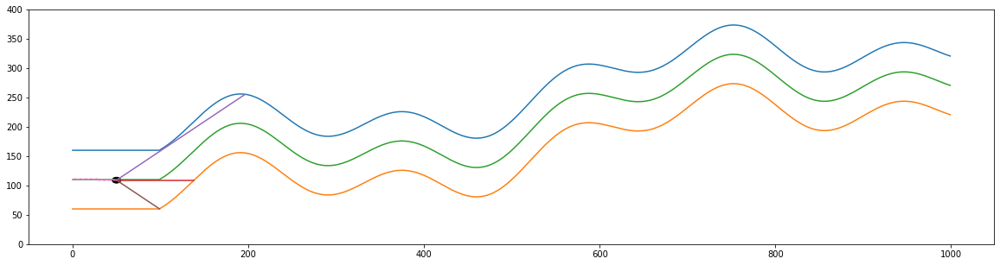

up
Sensor center =  90
Sensor from left wall =  146
Sensor from right wall =  50
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  50
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  51
			 len(self.sensor_left)   =  51
			 len(self.sensor_center) =  51
			 len(self.sensor_right)  =  51
			 self.x                  =  50
			 -------------- Teszt End --------------
self.y =  110.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(17, 4)
(17, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.])

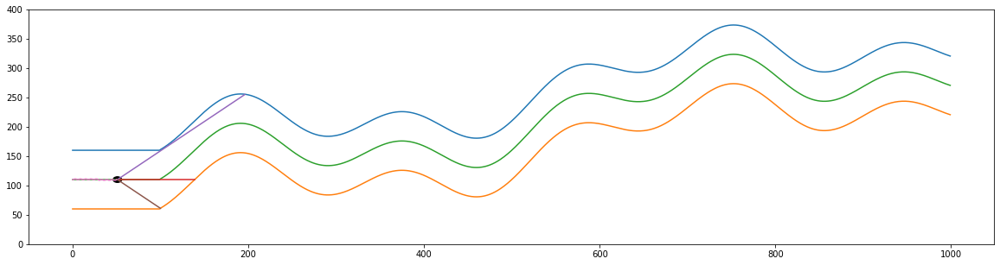

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (52, 3)
y.shape =  (52, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


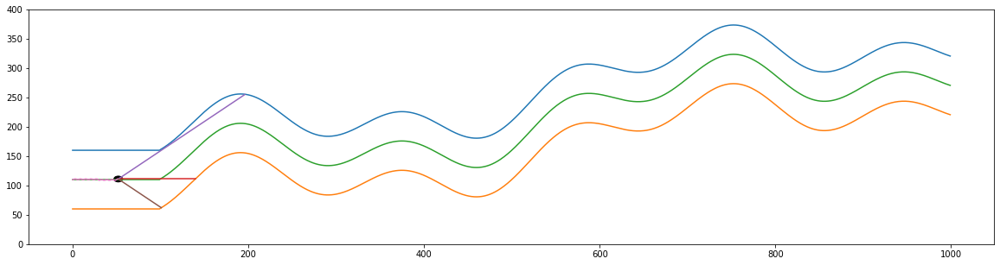

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[145  89  50]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.97938144 0.         0.        ]]
actual predicted =  [1.02659997]
actual self.y_distance[-1] =  0.9607843137254902
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0,

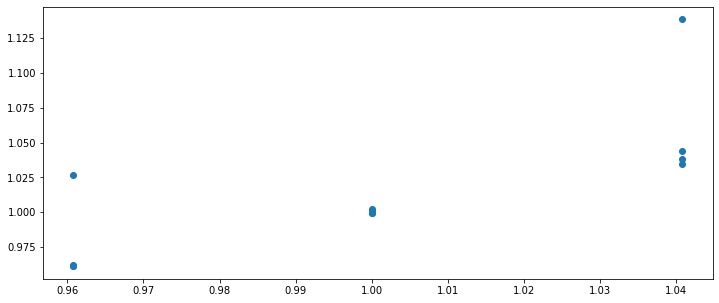

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(17, 4)
(17, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  51., 117.,  51.]), array([111.,  50.,

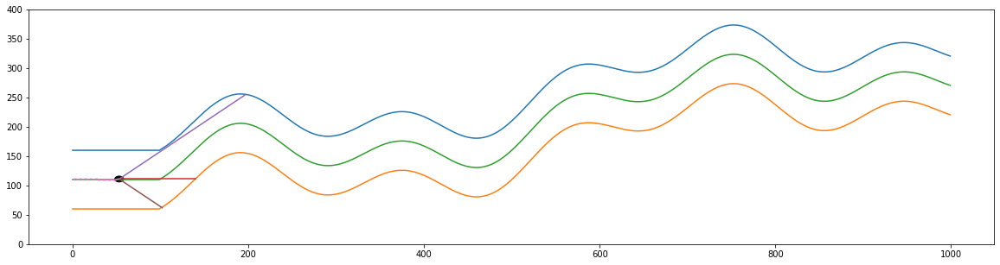

down
Sensor center =  87
Sensor from left wall =  146
Sensor from right wall =  49
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  53
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  54
			 len(self.sensor_left)   =  54
			 len(self.sensor_center) =  54
			 len(self.sensor_right)  =  54
			 self.x                  =  53
			 -------------- Teszt End --------------
self.y =  110.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(18, 4)
(18, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126., 

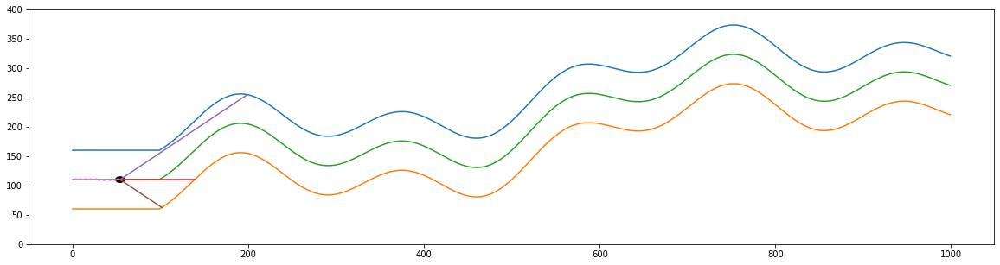

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (55, 3)
y.shape =  (55, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


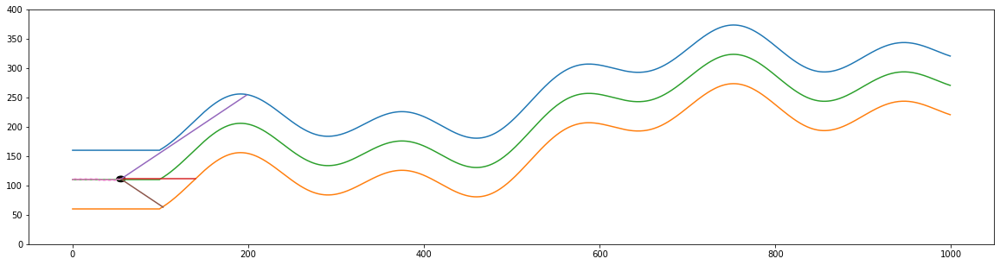

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[144  86  49]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.96907216 0.         0.        ]]
actual predicted =  [1.03372333]
actual self.y_distance[-1] =  0.9607843137254902
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0,

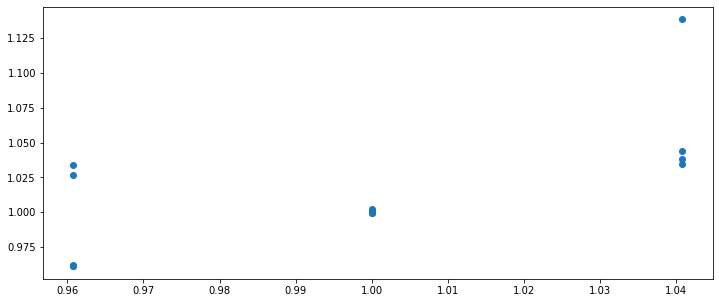

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(18, 4)
(18, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([111.,  50., 121.,  52.]), array([110.,  

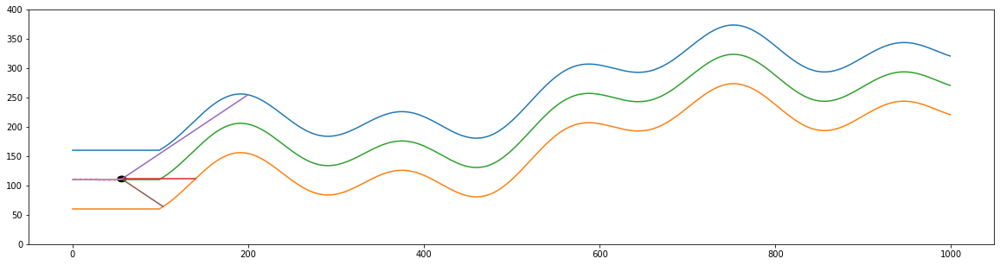

up
Sensor center =  85
Sensor from left wall =  143
Sensor from right wall =  49
most távolsagra van a felső faltól =  48.0
most távolsagra van az alsó faltól =  52.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  56
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9230769230769231
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  57
			 len(self.sensor_left)   =  57
			 len(self.sensor_center) =  57
			 len(self.sensor_right)  =  57
			 self.x                  =  56
			 -------------- Teszt End --------------
self.y =  112.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1.]
(19, 4)
(19, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([

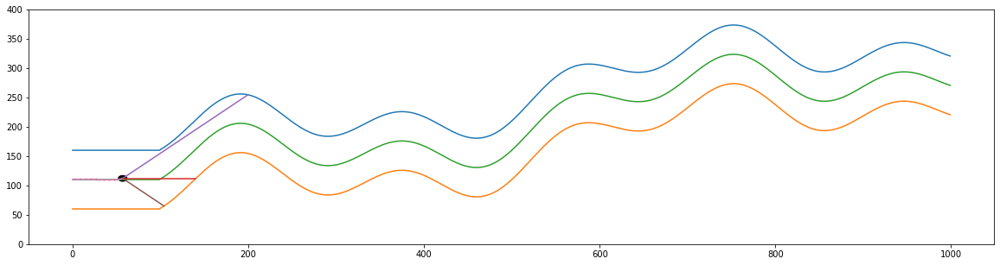

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (58, 3)
y.shape =  (58, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


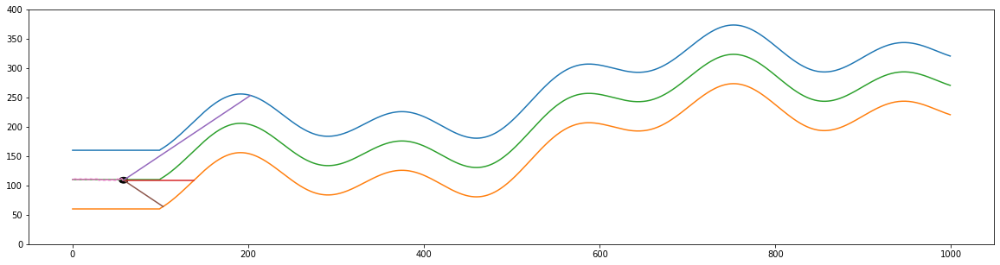

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[145  81  46]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.97938144 -0.05357143 -0.5       ]]
actual predicted =  [1.04956352]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1

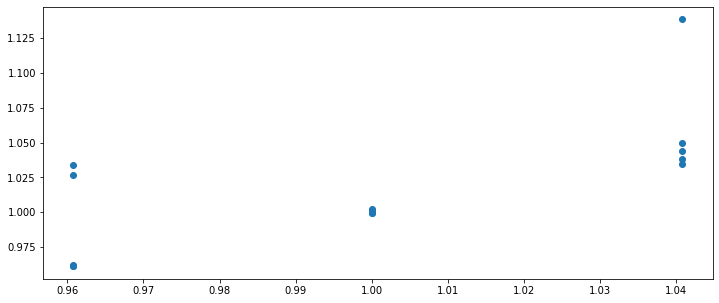

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1.]
(19, 4)
(19, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([11

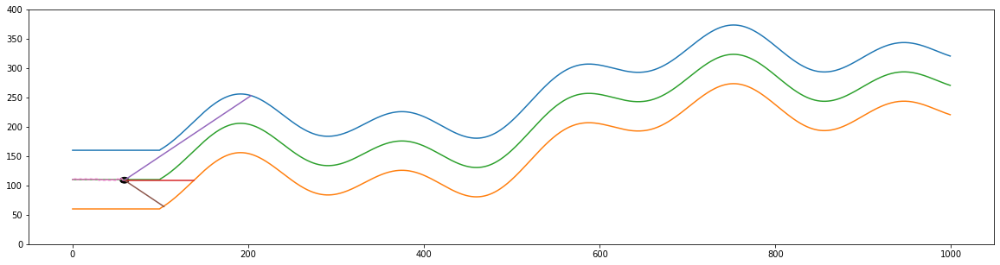

down
Sensor center =  80
Sensor from left wall =  145
Sensor from right wall =  45
most távolsagra van a felső faltól =  52.0
most távolsagra van az alsó faltól =  48.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  59
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0833333333333333
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  60
			 len(self.sensor_left)   =  60
			 len(self.sensor_center) =  60
			 len(self.sensor_right)  =  60
			 self.x                  =  59
			 -------------- Teszt End --------------
self.y =  108.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.]
(20, 4)
(20, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), a

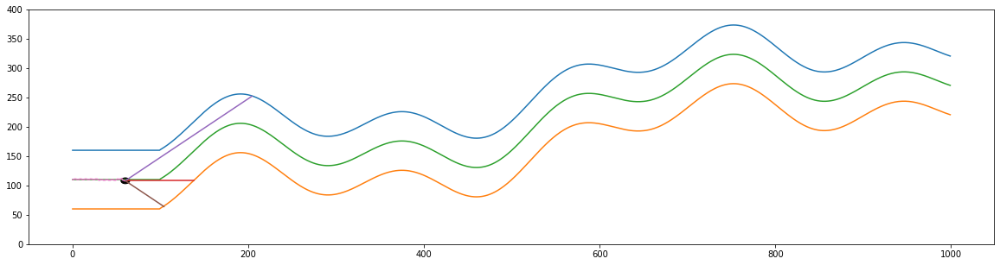

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (61, 3)
y.shape =  (61, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


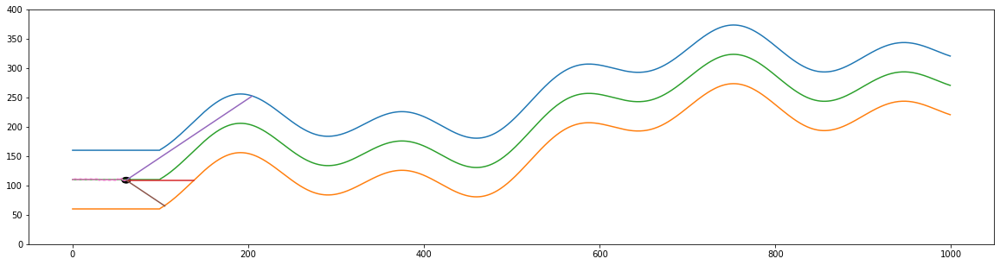

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[144  78  45]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.96907216 -0.01639344  0.        ]]
actual predicted =  [1.0557385]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.

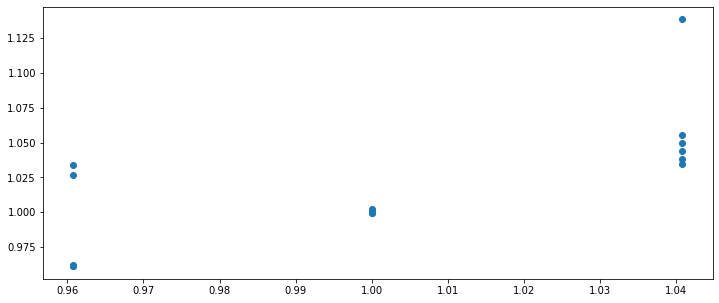

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.]
(20, 4)
(20, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array

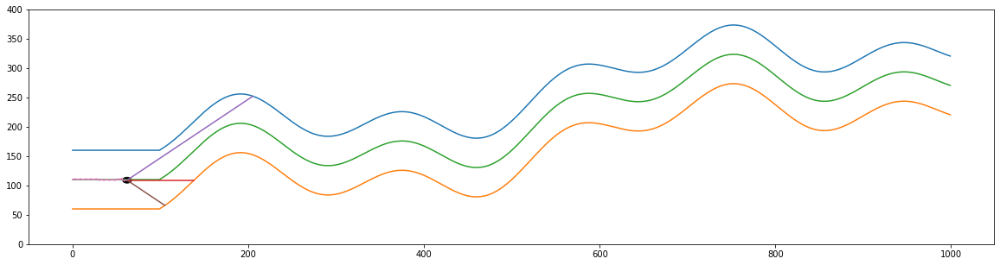

up
Sensor center =  78
Sensor from left wall =  143
Sensor from right wall =  45
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  62
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  63
			 len(self.sensor_left)   =  63
			 len(self.sensor_center) =  63
			 len(self.sensor_right)  =  63
			 self.x                  =  62
			 -------------- Teszt End --------------
self.y =  110.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1.]
(21, 4)
(21, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  

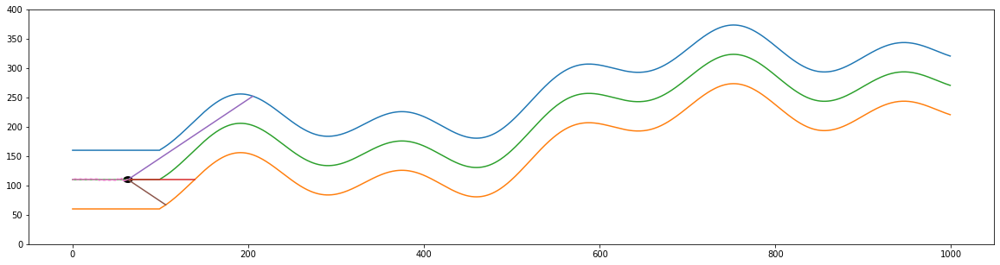

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (64, 3)
y.shape =  (64, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


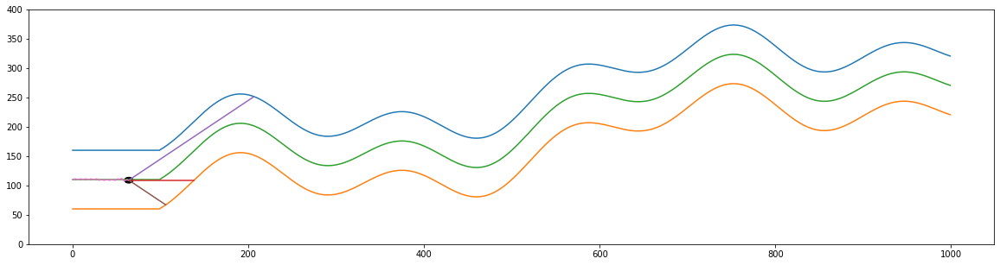

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[143  75  43]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.95876289 -0.03174603 -0.125     ]]
actual predicted =  [1.05696832]
actual self.y_distance[-1] =  1.0408163265306123
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1

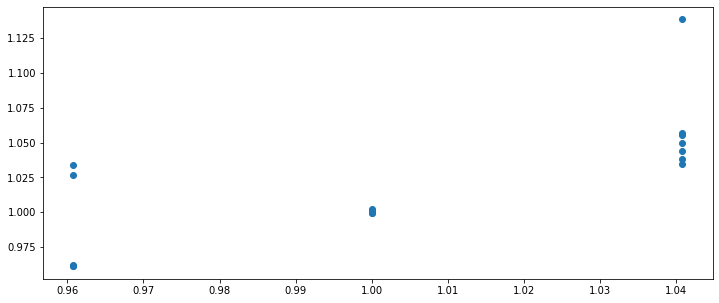

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1.]
(21, 4)
(21, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]), array([110.,  51., 129.,  51.]), a

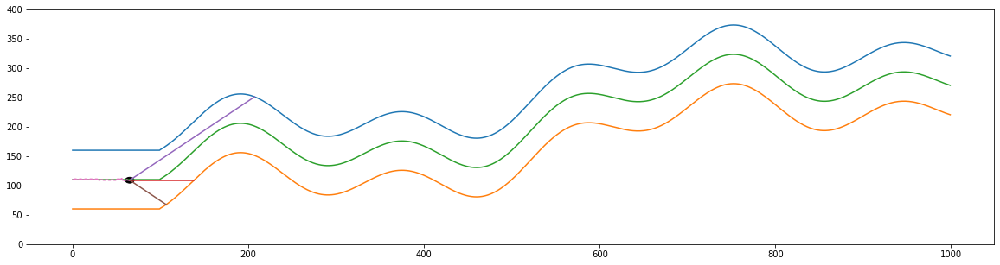

down
Sensor center =  74
Sensor from left wall =  143
Sensor from right wall =  42
most távolsagra van a felső faltól =  52.0
most távolsagra van az alsó faltól =  48.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  65
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0833333333333333
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  66
			 len(self.sensor_left)   =  66
			 len(self.sensor_center) =  66
			 len(self.sensor_right)  =  66
			 self.x                  =  65
			 -------------- Teszt End --------------
self.y =  108.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.]
(22, 4)
(22, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  

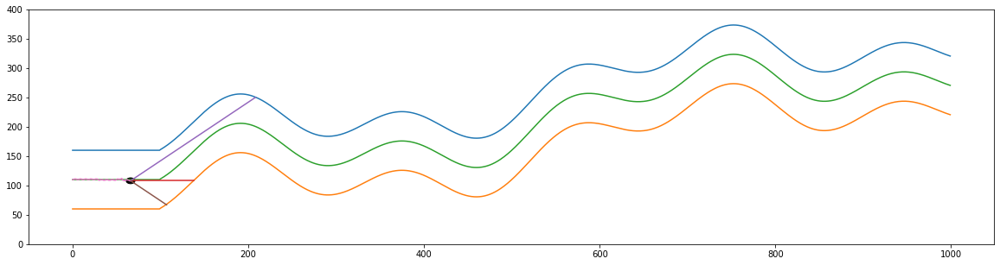

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (67, 3)
y.shape =  (67, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


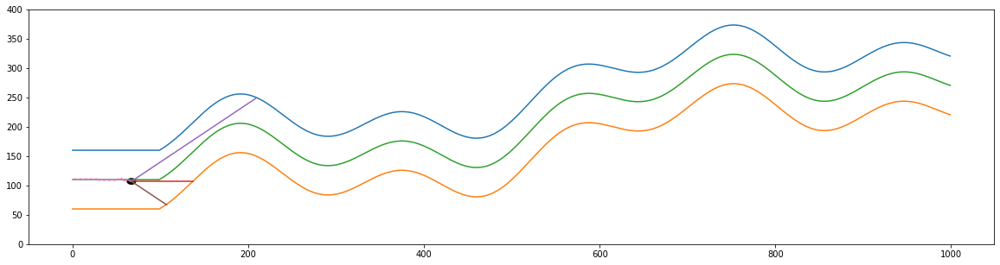

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[143  71  41]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.95876289 -0.02985075 -0.1       ]]
actual predicted =  [1.02704663]
actual self.y_distance[-1] =  1.127659574468085
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.

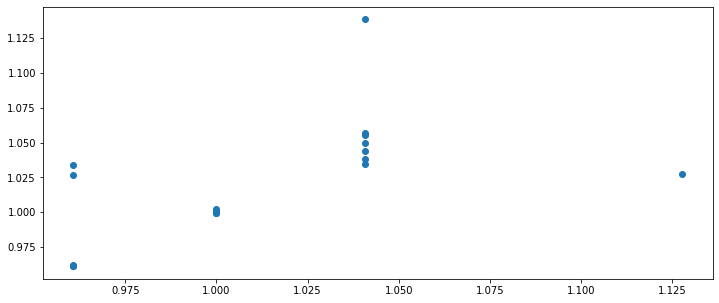

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.]
(22, 4)
(22, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([111.,  50., 133.,  52.]

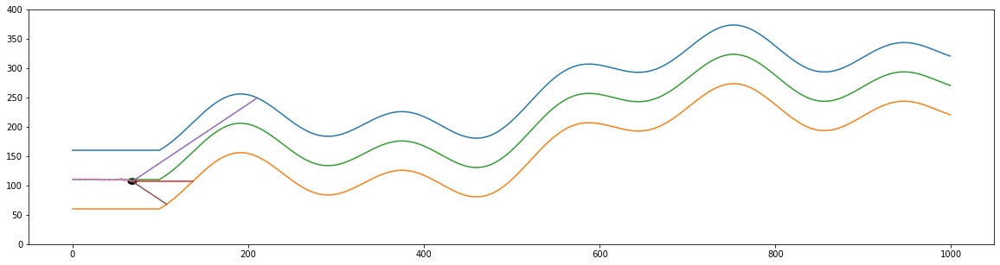

up
Sensor center =  71
Sensor from left wall =  142
Sensor from right wall =  40
most távolsagra van a felső faltól =  52.0
most távolsagra van az alsó faltól =  48.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  68
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0833333333333333
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  69
			 len(self.sensor_left)   =  69
			 len(self.sensor_center) =  69
			 len(self.sensor_right)  =  69
			 self.x                  =  68
			 -------------- Teszt End --------------
self.y =  108.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1.]
(23, 4)
(23, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,

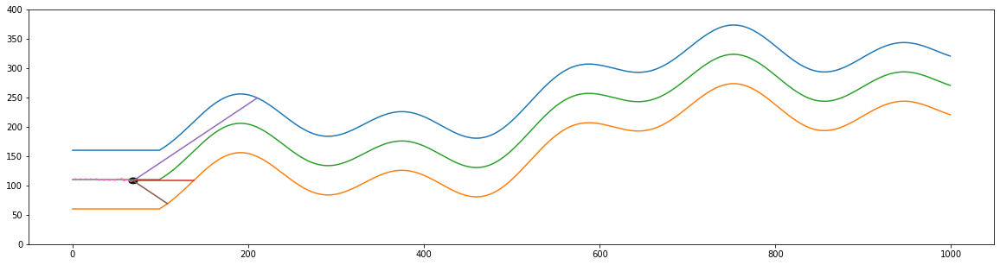

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (70, 3)
y.shape =  (70, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


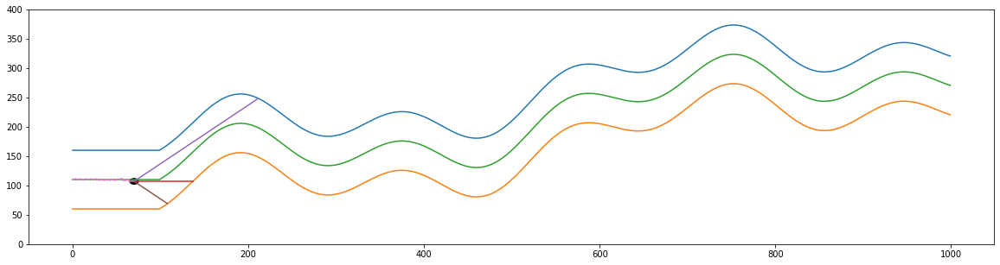

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[142  68  39]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.94845361 -0.02857143 -0.08333333]]
actual predicted =  [1.10783058]
actual self.y_distance[-1] =  1.127659574468085
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.

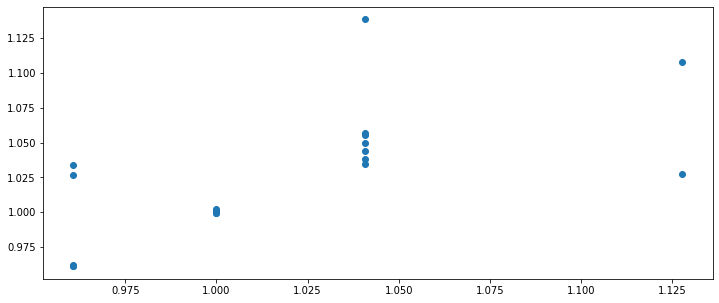

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1.]
(23, 4)
(23, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  

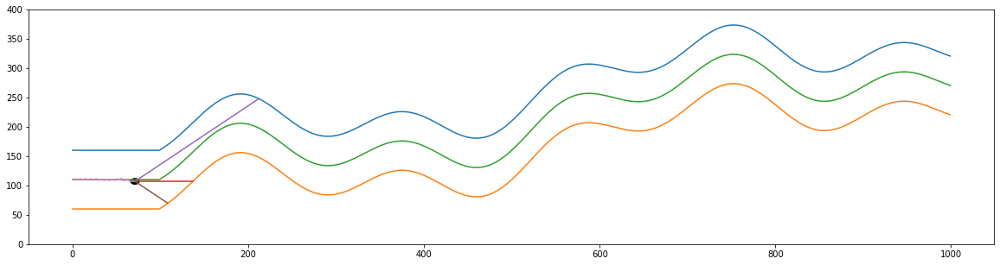

down
Sensor center =  66
Sensor from left wall =  142
Sensor from right wall =  38
most távolsagra van a felső faltól =  54.0
most távolsagra van az alsó faltól =  46.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  71
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.173913043478261
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  72
			 len(self.sensor_left)   =  72
			 len(self.sensor_center) =  72
			 len(self.sensor_right)  =  72
			 self.x                  =  71
			 -------------- Teszt End --------------
self.y =  106.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.]
(24, 4)
(24, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 

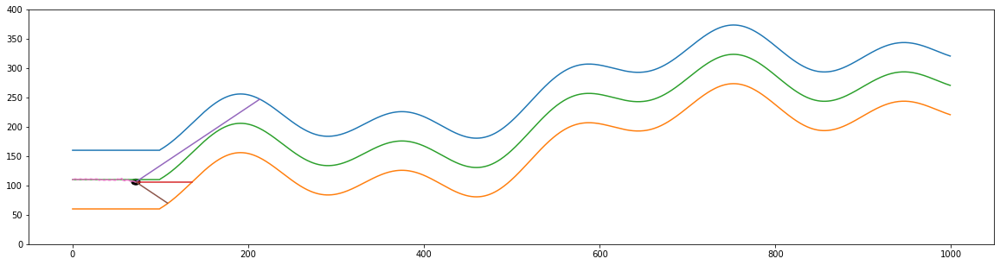

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (73, 3)
y.shape =  (73, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


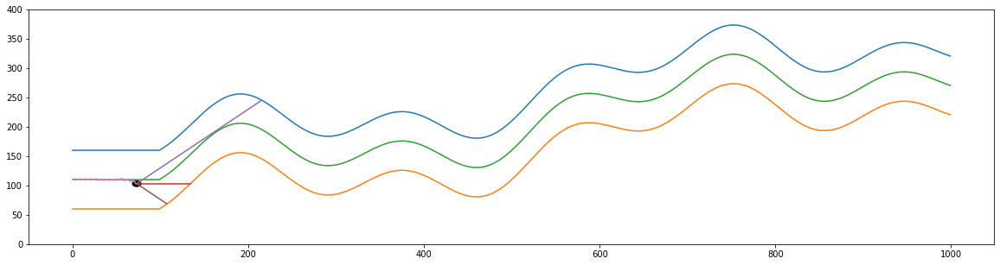

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[143  62  35]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.95876289 -0.04       -0.13333333]]
actual predicted =  [1.17294645]
actual self.y_distance[-1] =  1.3255813953488371
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1

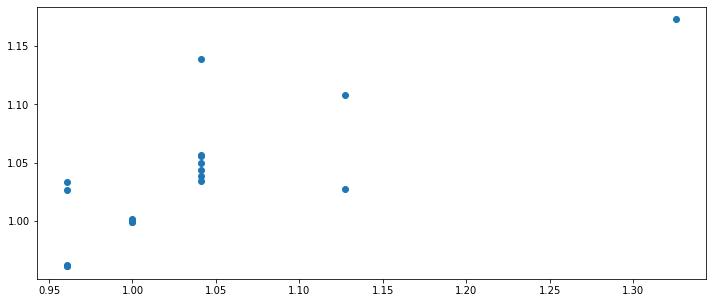

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.]
(24, 4)
(24, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107., 141.,  67.,  38.])]
[array([111.,  50., 139

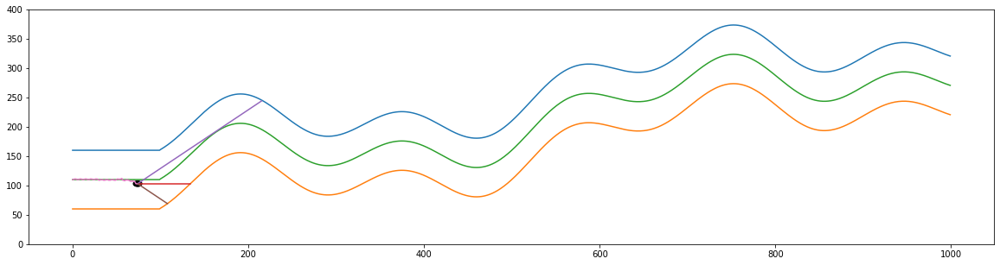

up
Sensor center =  62
Sensor from left wall =  142
Sensor from right wall =  35
most távolsagra van a felső faltól =  56.0
most távolsagra van az alsó faltól =  44.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  74
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.2727272727272727
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  75
			 len(self.sensor_left)   =  75
			 len(self.sensor_center) =  75
			 len(self.sensor_right)  =  75
			 self.x                  =  74
			 -------------- Teszt End --------------
self.y =  104.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1.]
(25, 4)
(25, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50

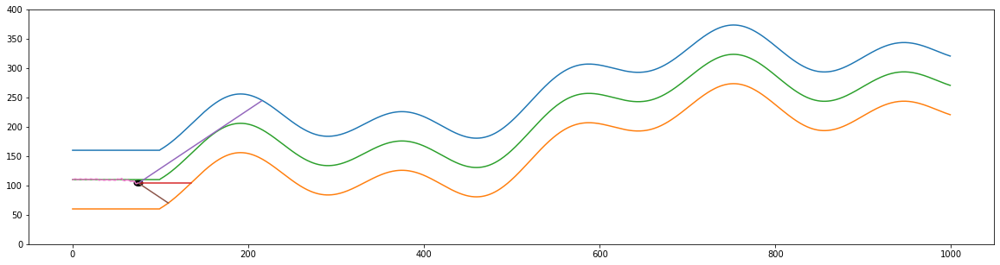

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (76, 3)
y.shape =  (76, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


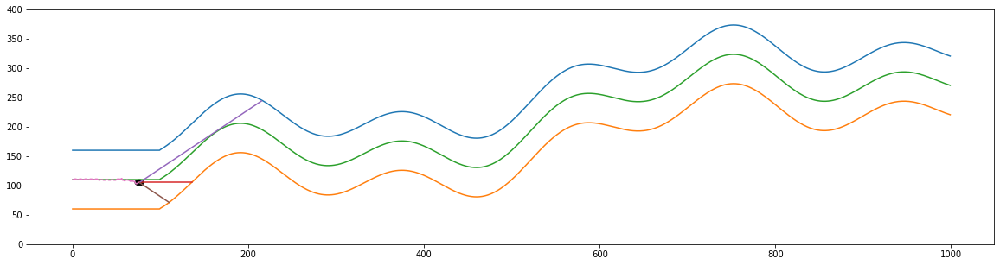

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[140  61  35]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.92783505 0.         0.        ]]
actual predicted =  [1.2637001]
actual self.y_distance[-1] =  1.2222222222222223
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 

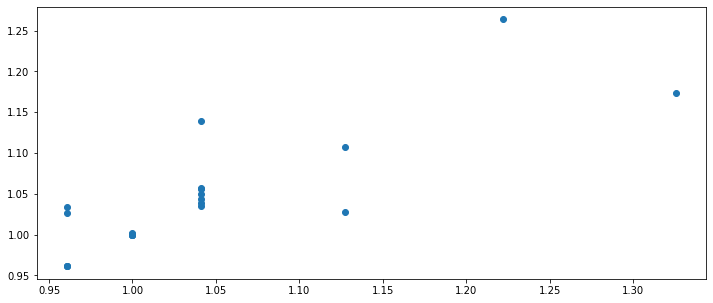

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1.]
(25, 4)
(25, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107., 141.,  67.,  38.]), array([103., 142., 

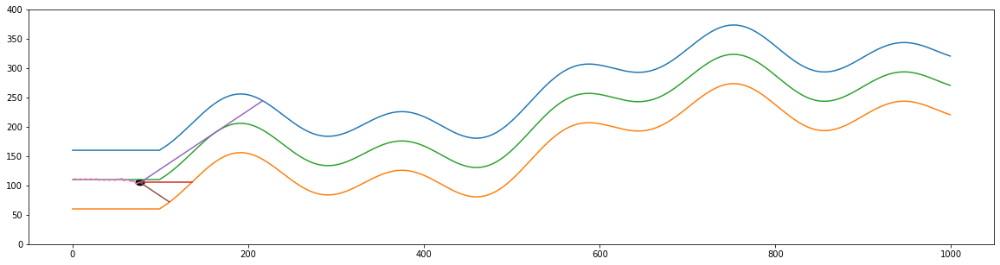

down
Sensor center =  59
Sensor from left wall =  140
Sensor from right wall =  34
most távolsagra van a felső faltól =  56.0
most távolsagra van az alsó faltól =  44.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  77
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.2727272727272727
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  78
			 len(self.sensor_left)   =  78
			 len(self.sensor_center) =  78
			 len(self.sensor_right)  =  78
			 self.x                  =  77
			 -------------- Teszt End --------------
self.y =  104.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.]
(26, 4)
(26, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111

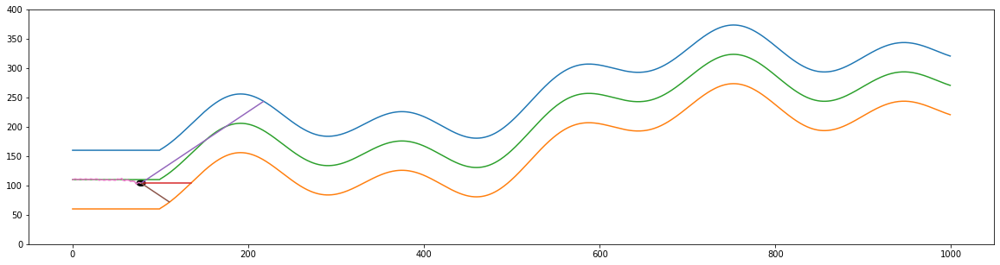

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (79, 3)
y.shape =  (79, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


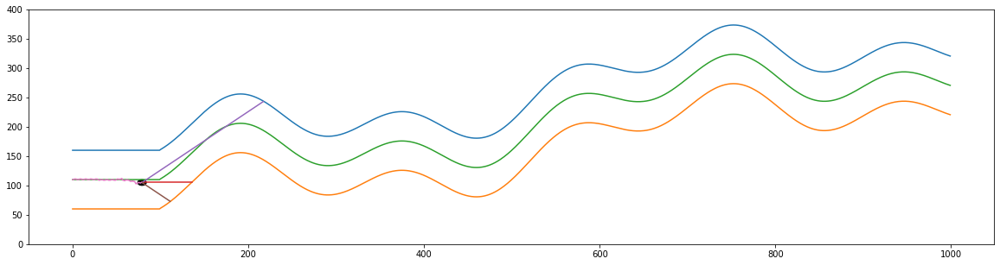

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[139  58  33]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.91752577 0.         0.        ]]
actual predicted =  [1.29040693]
actual self.y_distance[-1] =  1.2222222222222223
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0,

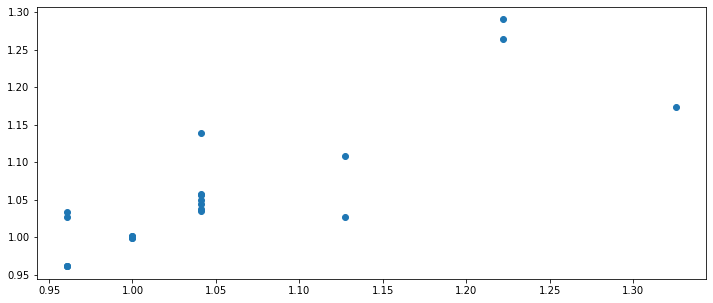

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.]
(26, 4)
(26, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107., 141.,  67.,  38.]), array([103., 14

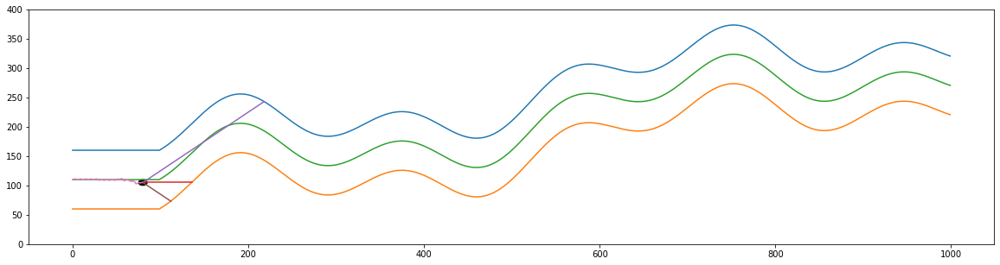

up
Sensor center =  57
Sensor from left wall =  138
Sensor from right wall =  33
most távolsagra van a felső faltól =  54.0
most távolsagra van az alsó faltól =  46.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  80
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.173913043478261
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  81
			 len(self.sensor_left)   =  81
			 len(self.sensor_center) =  81
			 len(self.sensor_right)  =  81
			 self.x                  =  80
			 -------------- Teszt End --------------
self.y =  106.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(27, 4)
(27, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([11

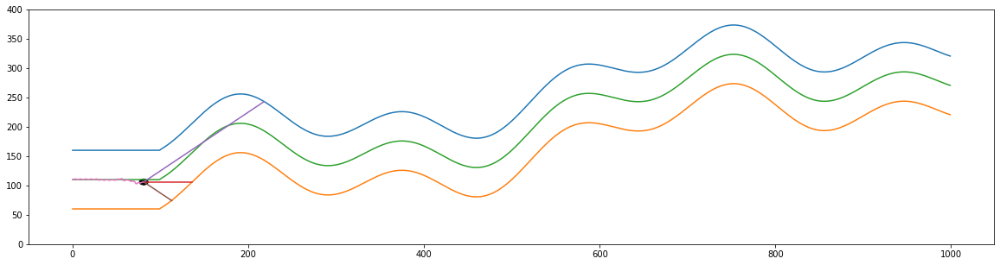

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (82, 3)
y.shape =  (82, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


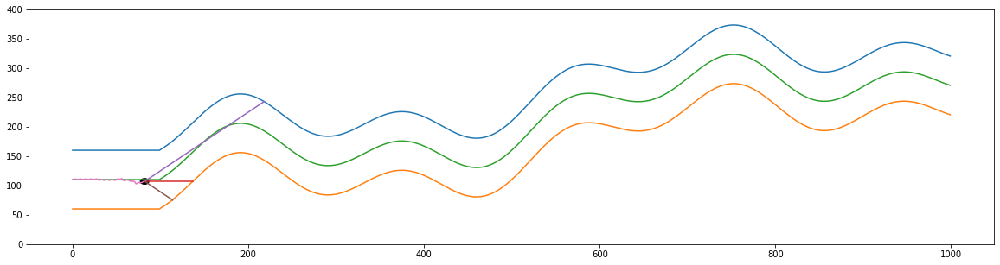

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[137  56  33]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.89690722 0.         0.        ]]
actual predicted =  [1.25799248]
actual self.y_distance[-1] =  1.127659574468085
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 

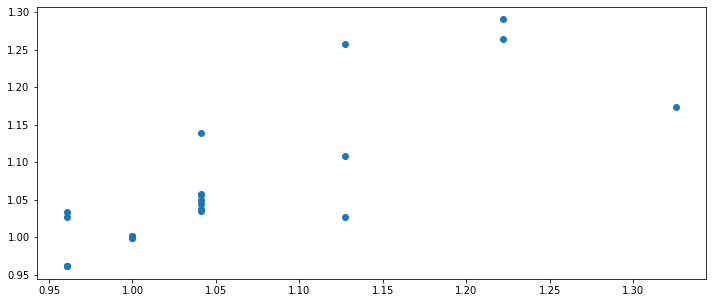

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(27, 4)
(27, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107., 141.,  67.,  38.]), array([103.

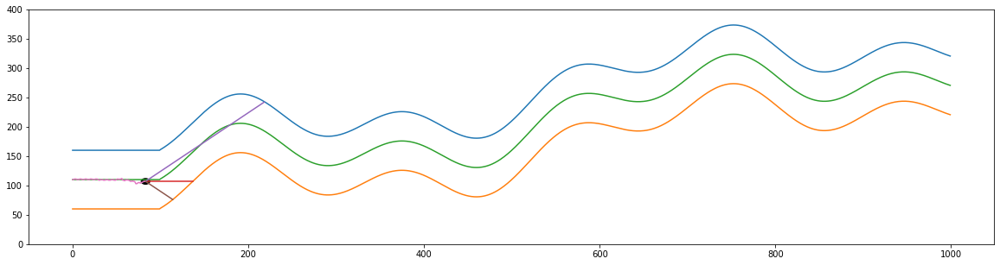

down
Sensor center =  54
Sensor from left wall =  137
Sensor from right wall =  32
most távolsagra van a felső faltól =  54.0
most távolsagra van az alsó faltól =  46.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  83
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.173913043478261
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  84
			 len(self.sensor_left)   =  84
			 len(self.sensor_center) =  84
			 len(self.sensor_right)  =  84
			 self.x                  =  83
			 -------------- Teszt End --------------
self.y =  106.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(28, 4)
(28, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), arr

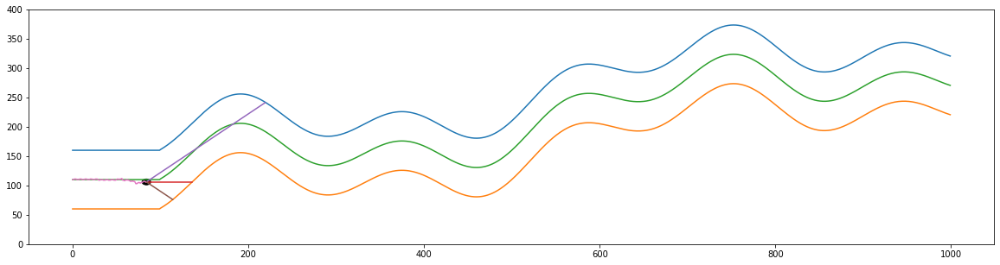

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (85, 3)
y.shape =  (85, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


86
			 len(self.sensor_center) =  86
			 len(self.sensor_right)  =  86
			 self.x                  =  85
			 -------------- Append End --------------


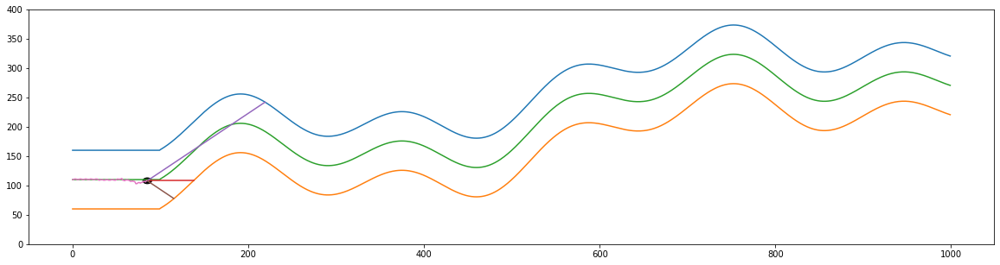

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[135  54  31]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.87628866 0.01149425 0.        ]]
actual predicted =  [1.24890201]
actual self.y_distance[-1] =  1.0833333333333333
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0,

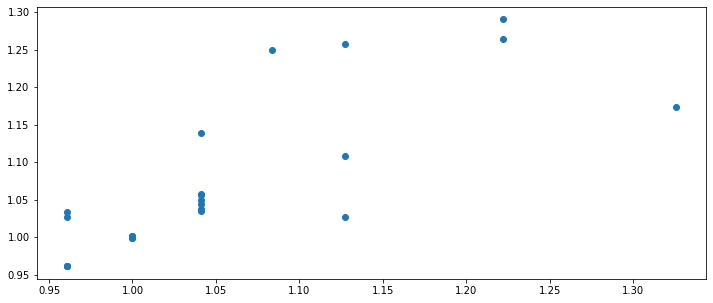

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(28, 4)
(28, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107., 141.,  67.,  38.]), array([

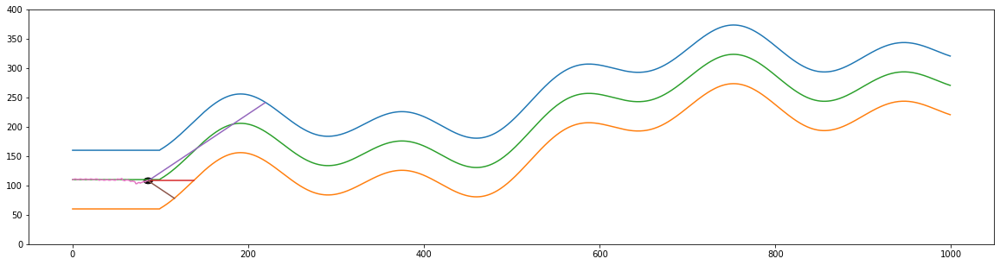

up
Sensor center =  53
Sensor from left wall =  134
Sensor from right wall =  31
most távolsagra van a felső faltól =  51.0
most távolsagra van az alsó faltól =  49.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  86
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0408163265306123
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  87
			 len(self.sensor_left)   =  87
			 len(self.sensor_center) =  87
			 len(self.sensor_right)  =  87
			 self.x                  =  86
			 -------------- Teszt End --------------
self.y =  109.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(29, 4)
(29, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), 

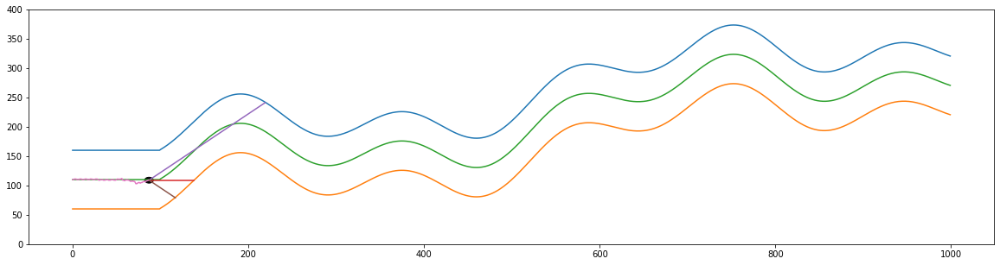

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (88, 3)
y.shape =  (88, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


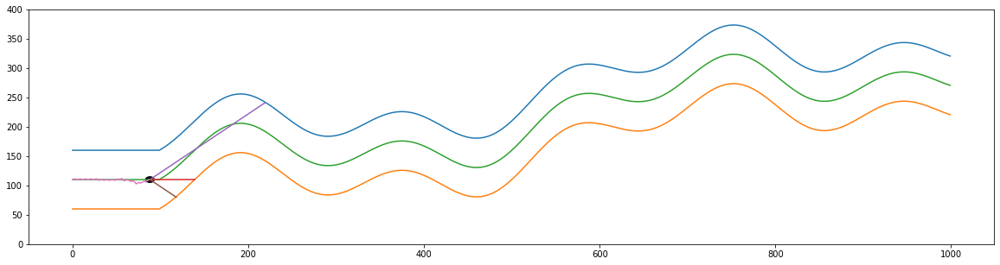

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[132  52  31]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.84536082 0.         0.        ]]
actual predicted =  [1.17260576]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163

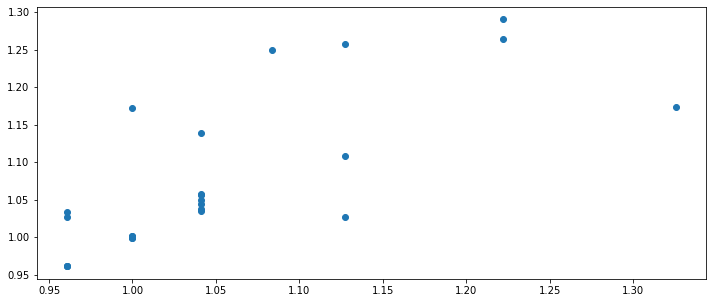

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(29, 4)
(29, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107., 141.,  67.,  38.]), arr

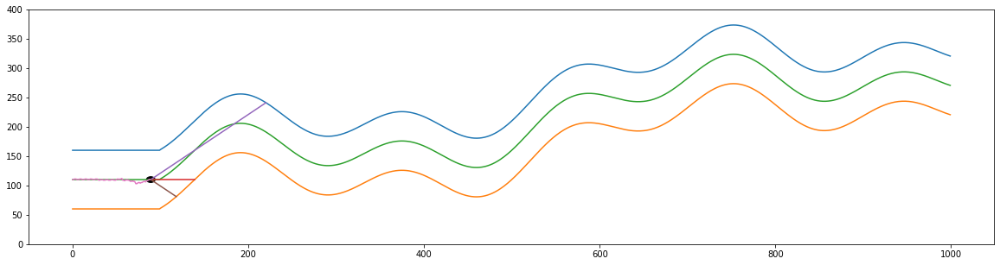

down
Sensor center =  50
Sensor from left wall =  132
Sensor from right wall =  30
most távolsagra van a felső faltól =  51.0
most távolsagra van az alsó faltól =  49.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  89
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0408163265306123
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  90
			 len(self.sensor_left)   =  90
			 len(self.sensor_center) =  90
			 len(self.sensor_right)  =  90
			 self.x                  =  89
			 -------------- Teszt End --------------
self.y =  109.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(30, 4)
(30, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  5

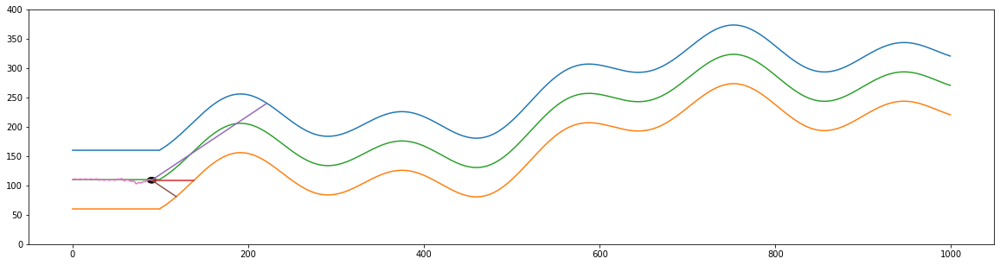

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (91, 3)
y.shape =  (91, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


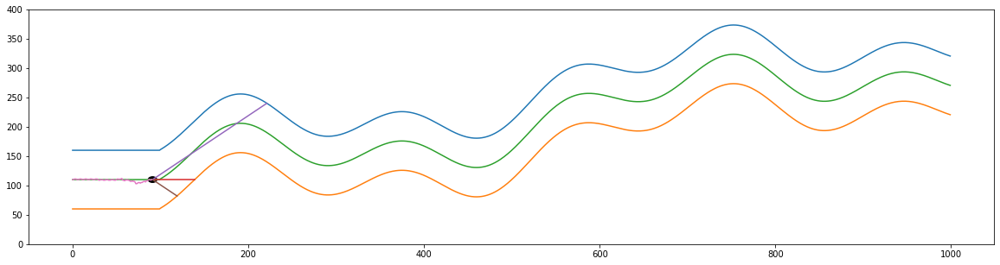

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[131  49  29]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.83505155 0.         0.        ]]
actual predicted =  [1.02898856]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163

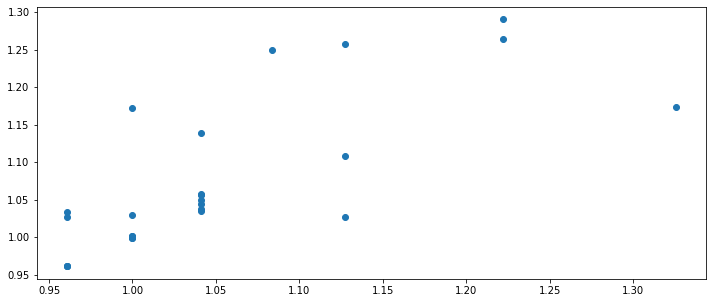

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(30, 4)
(30, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107., 141.,  67.,  38.]),

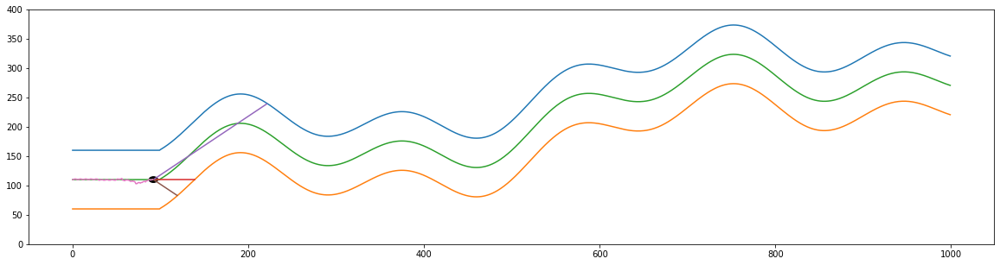

up
Sensor center =  49
Sensor from left wall =  130
Sensor from right wall =  29
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  92
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9607843137254902
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  93
			 len(self.sensor_left)   =  93
			 len(self.sensor_center) =  93
			 len(self.sensor_right)  =  93
			 self.x                  =  92
			 -------------- Teszt End --------------
self.y =  111.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(31, 4)
(31, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132., 

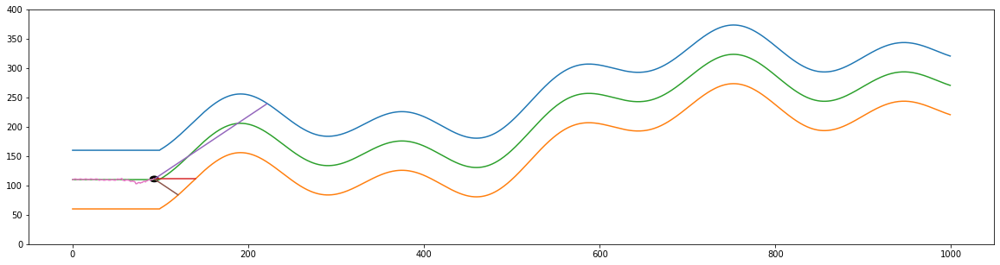

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (94, 3)
y.shape =  (94, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


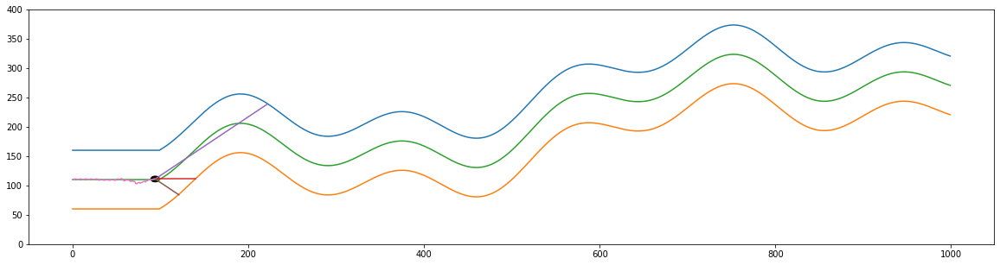

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[129  47  28]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.81443299 -0.01086957  0.        ]]
actual predicted =  [0.97737351]
actual self.y_distance[-1] =  0.9607843137254902
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1

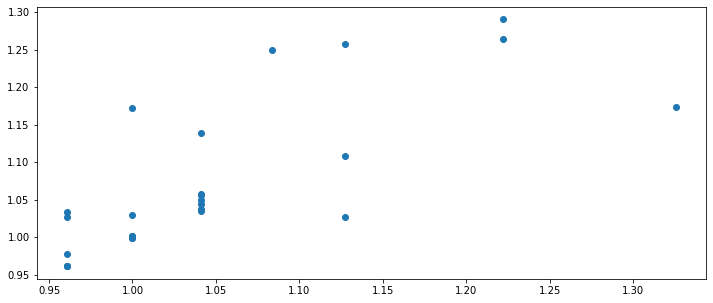

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(31, 4)
(31, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107., 141.,  67.,  38

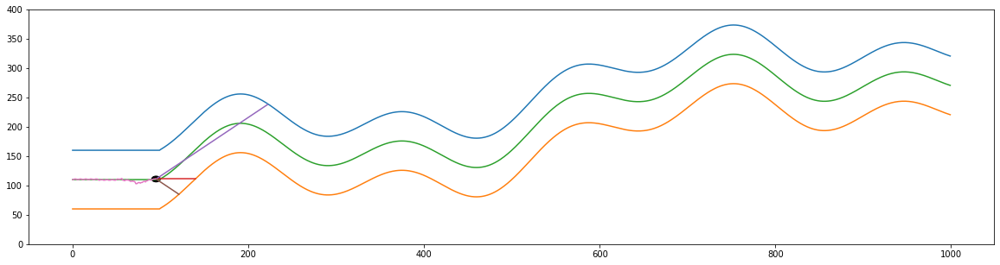

down
Sensor center =  45
Sensor from left wall =  129
Sensor from right wall =  27
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  95
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  96
			 len(self.sensor_left)   =  96
			 len(self.sensor_center) =  96
			 len(self.sensor_right)  =  96
			 self.x                  =  95
			 -------------- Teszt End --------------
self.y =  110.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(32, 4)
(32, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), a

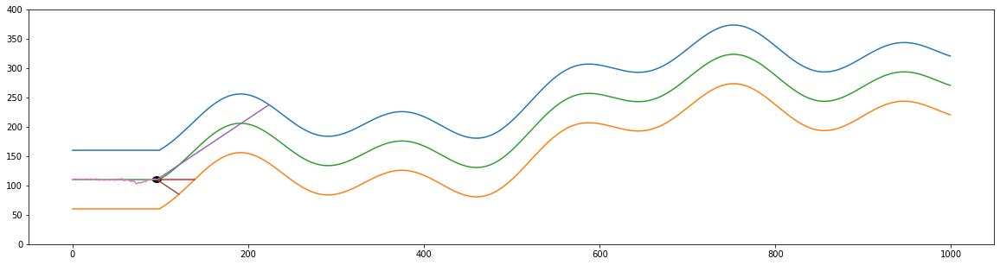

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (97, 3)
y.shape =  (97, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]
 

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


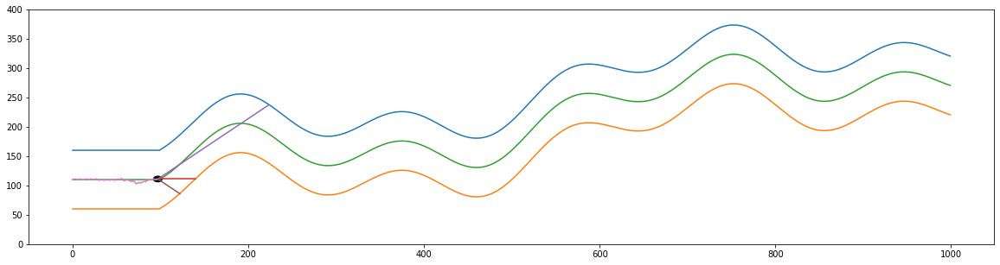

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[127  44  26]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.79381443 0.         0.        ]]
actual predicted =  [0.9894668]
actual self.y_distance[-1] =  0.9607843137254902
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 

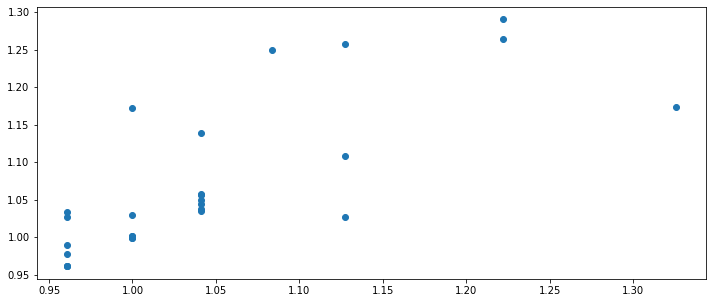

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(32, 4)
(32, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107., 141.,  67.,

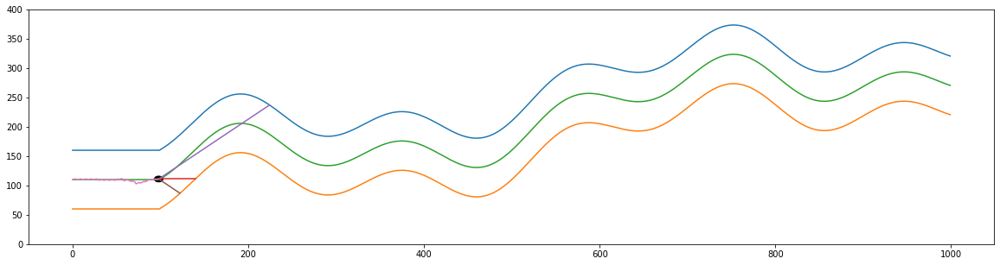

up
Sensor center =  43
Sensor from left wall =  126
Sensor from right wall =  26
most távolsagra van a felső faltól =  48.0
most távolsagra van az alsó faltól =  52.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  98
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.9230769230769231
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  99
			 len(self.sensor_left)   =  99
			 len(self.sensor_center) =  99
			 len(self.sensor_right)  =  99
			 self.x                  =  98
			 -------------- Teszt End --------------
self.y =  112.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(33, 4)
(33, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51.

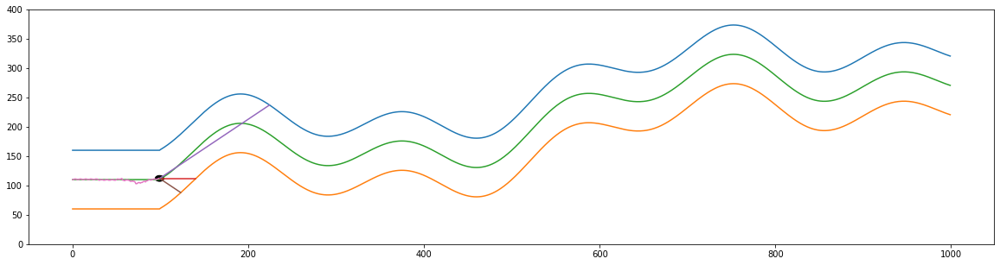

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (100, 3)
y.shape =  (100, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


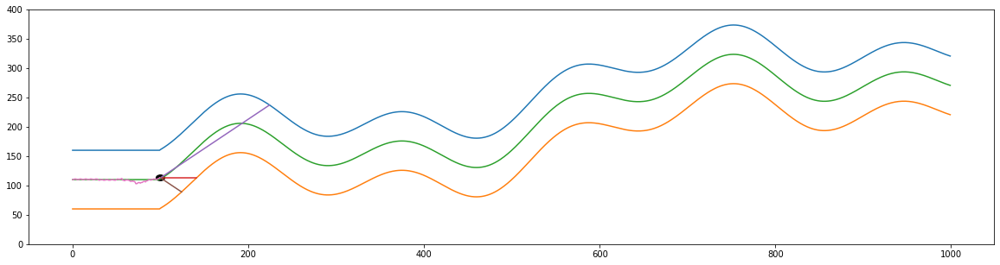

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[125  42  25]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.77319588 0.         0.        ]]
actual predicted =  [1.0876907]
actual self.y_distance[-1] =  0.9298258016264941
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 

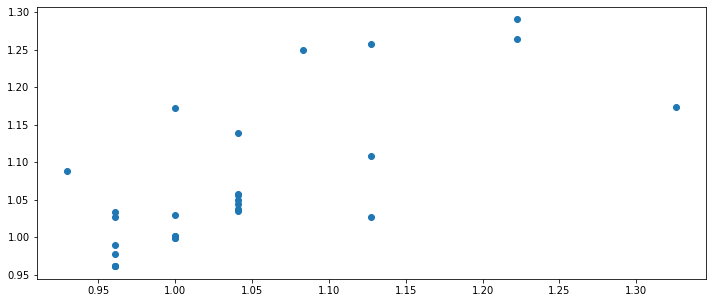

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(33, 4)
(33, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107., 141.,  

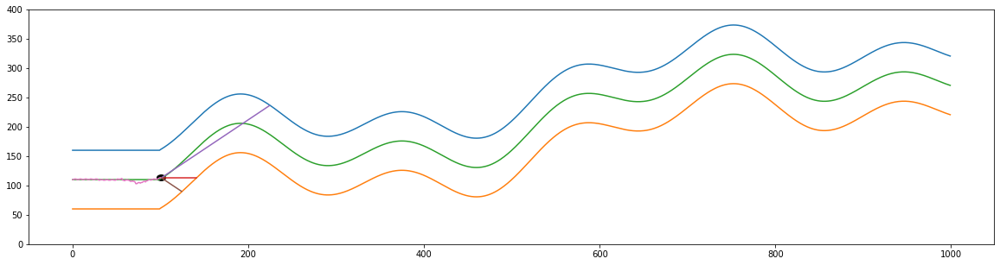

down
Sensor center =  40
Sensor from left wall =  125
Sensor from right wall =  24
most távolsagra van a felső faltól =  50.073810289961955
most távolsagra van az alsó faltól =  49.92618971003806
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  101
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.00295677640896
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  102
			 len(self.sensor_left)   =  102
			 len(self.sensor_center) =  102
			 len(self.sensor_right)  =  102
			 self.x                  =  101
			 -------------- Teszt End --------------
self.y =  112.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(34, 4)
(34, 4)
[array([110.,  51., 138.,  51.]), array([111., 

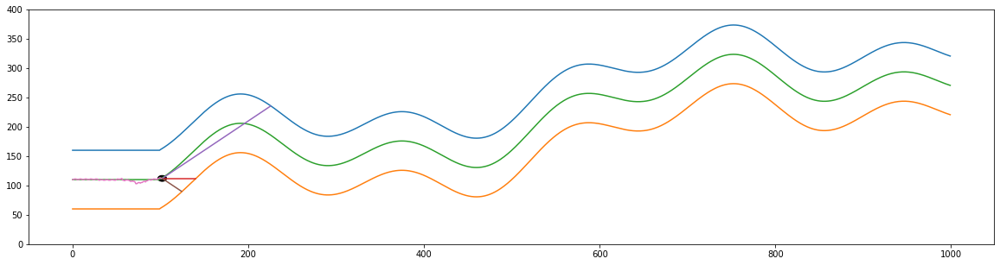

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (103, 3)
y.shape =  (103, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


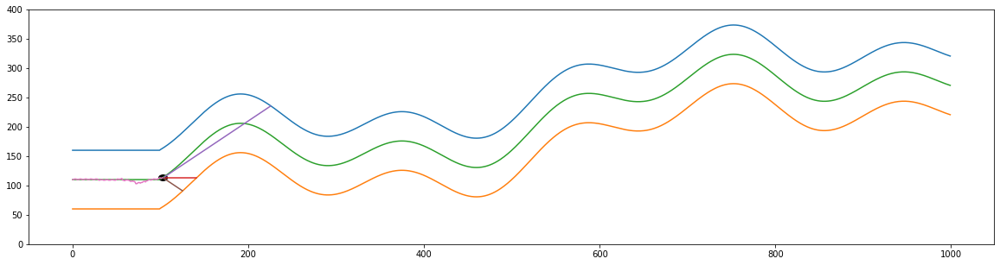

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[123  39  23]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.75257732 0.         0.        ]]
actual predicted =  [0.88790933]
actual self.y_distance[-1] =  1.0381846791549143
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0,

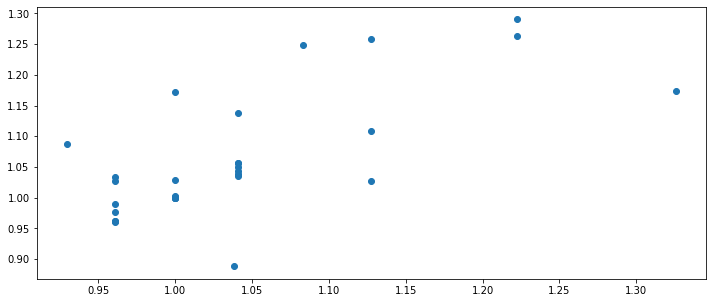

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(34, 4)
(34, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107., 141

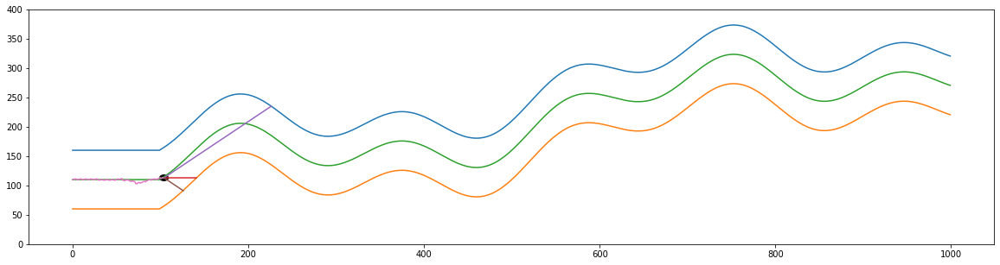

up
Sensor center =  39
Sensor from left wall =  122
Sensor from right wall =  23
most távolsagra van a felső faltól =  50.90706152640314
most távolsagra van az alsó faltól =  49.09293847359686
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  104
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0369528308797802
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  105
			 len(self.sensor_left)   =  105
			 len(self.sensor_center) =  105
			 len(self.sensor_right)  =  105
			 self.x                  =  104
			 -------------- Teszt End --------------
self.y =  114.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(35, 4)
(35, 4)
[array([110.,  51., 138.,  51.]), array([111

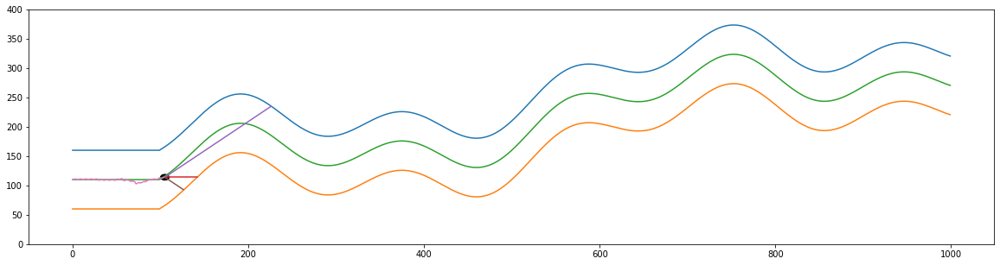

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (106, 3)
y.shape =  (106, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


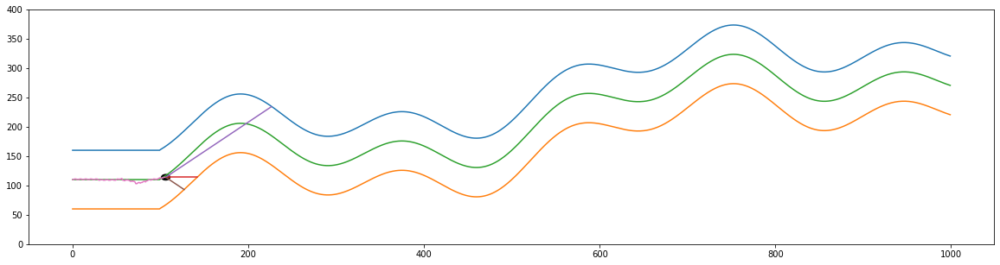

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[121  37  22]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.73195876 -0.00980392  0.        ]]
actual predicted =  [1.03604367]
actual self.y_distance[-1] =  1.1242069568369522
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1

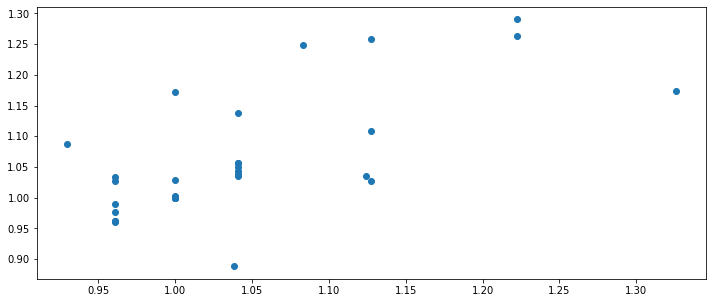

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(35, 4)
(35, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([107.,

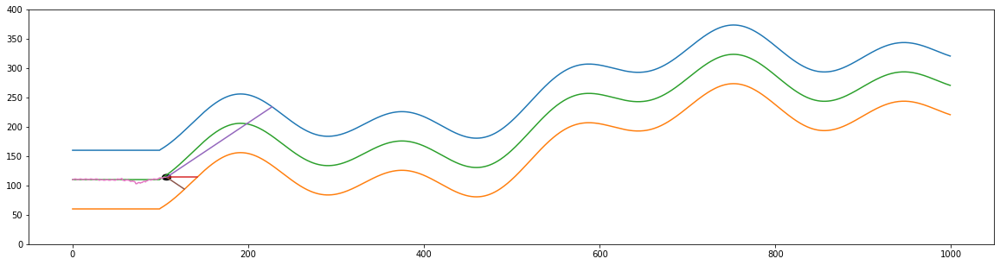

down
Sensor center =  35
Sensor from left wall =  121
Sensor from right wall =  21
most távolsagra van a felső faltól =  54.968983108538055
most távolsagra van az alsó faltól =  45.031016891461945
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  107
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.2206915788961539
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  108
			 len(self.sensor_left)   =  108
			 len(self.sensor_center) =  108
			 len(self.sensor_right)  =  108
			 self.x                  =  107
			 -------------- Teszt End --------------
self.y =  113.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(36, 4)
(36, 4)
[array([110.,  51., 138.,  51.]), ar

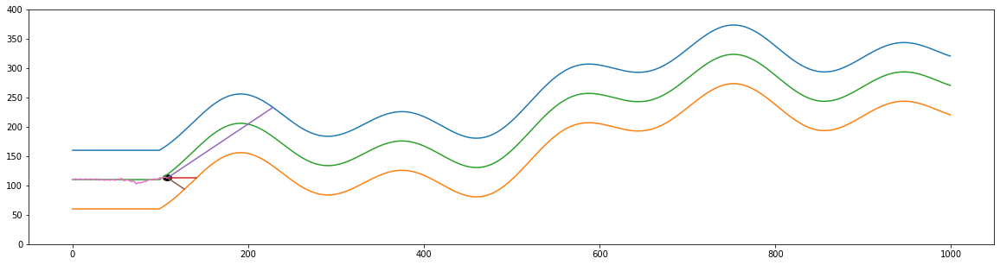

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (109, 3)
y.shape =  (109, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


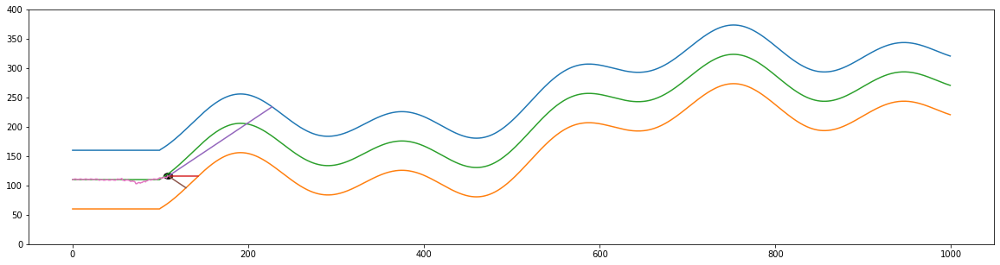

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[119  35  21]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.71134021 0.00943396 0.03125   ]]
actual predicted =  [1.0823684]
actual self.y_distance[-1] =  1.1801493135324017
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 

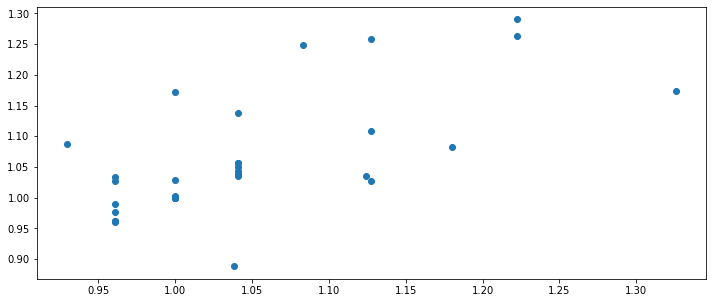

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(36, 4)
(36, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), array([1

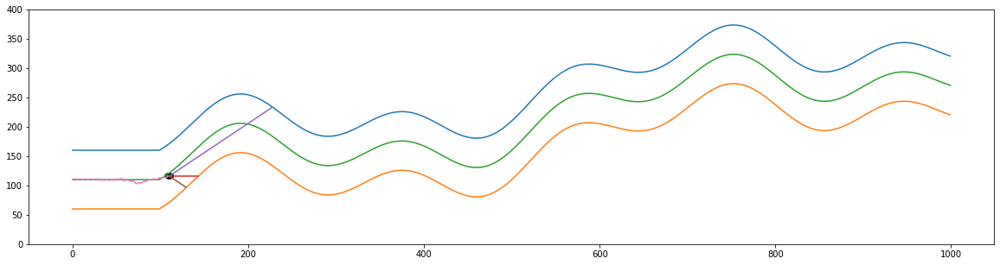

up
Sensor center =  35
Sensor from left wall =  118
Sensor from right wall =  21
most távolsagra van a felső faltól =  54.24776420832944
most távolsagra van az alsó faltól =  45.75223579167057
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  110
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.185685535792013
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  111
			 len(self.sensor_left)   =  111
			 len(self.sensor_center) =  111
			 len(self.sensor_right)  =  111
			 self.x                  =  110
			 -------------- Teszt End --------------
self.y =  117.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1.]
(37, 4)
(37, 4)
[array([110.,  51., 138.,  51.]), ar

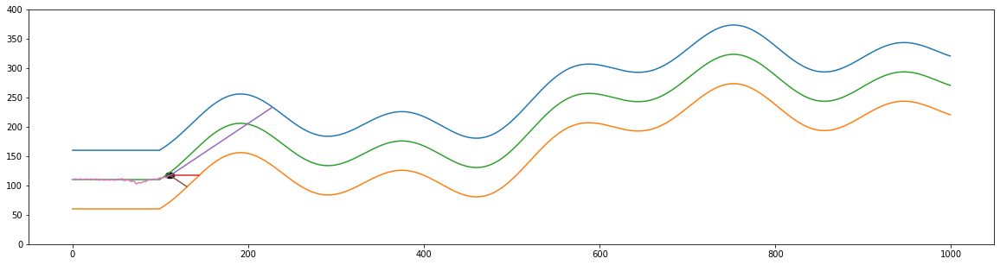

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (112, 3)
y.shape =  (112, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


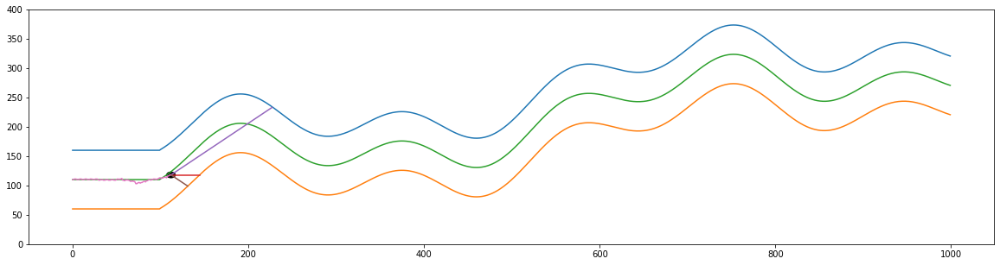

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[116  34  20]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.68041237 0.         0.        ]]
actual predicted =  [1.10629025]
actual self.y_distance[-1] =  1.2495695239889901
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0,

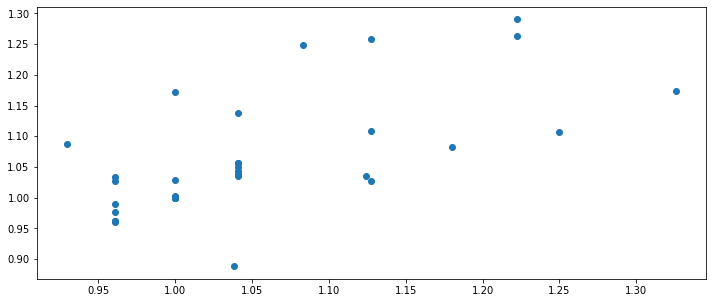

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1.]
(37, 4)
(37, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]), arr

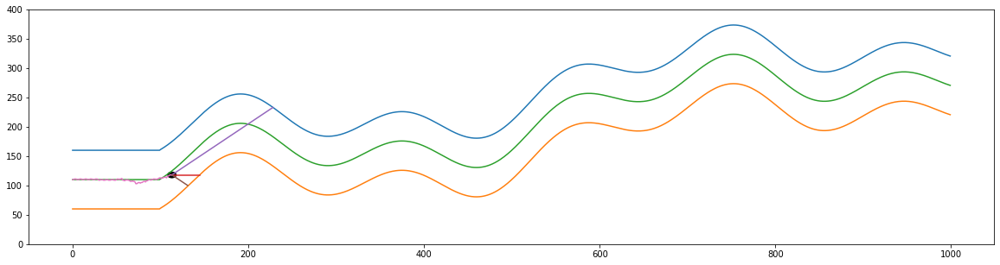

down
Sensor center =  32
Sensor from left wall =  116
Sensor from right wall =  19
most távolsagra van a felső faltól =  57.728924091668205
most távolsagra van az alsó faltól =  42.271075908331795
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  113
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.3656838121853816
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  114
			 len(self.sensor_left)   =  114
			 len(self.sensor_center) =  114
			 len(self.sensor_right)  =  114
			 self.x                  =  113
			 -------------- Teszt End --------------
self.y =  117.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.]
(38, 4)
(38, 4)
[array([110.,  51., 138.,  

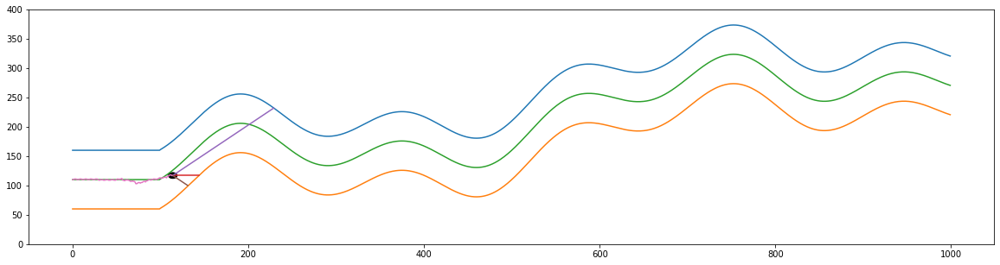

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (115, 3)
y.shape =  (115, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


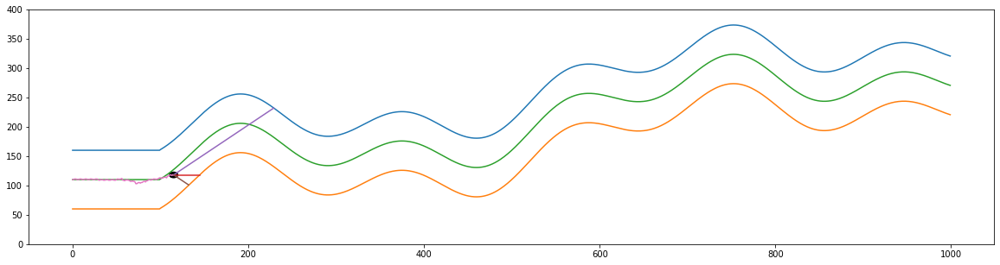

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[115  31  18]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.67010309 0.         0.        ]]
actual predicted =  [1.1890691]
actual self.y_distance[-1] =  1.4482098341539846
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 

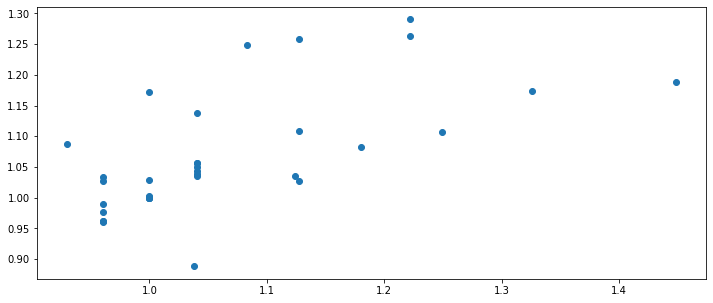

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.]
(38, 4)
(38, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40.]),

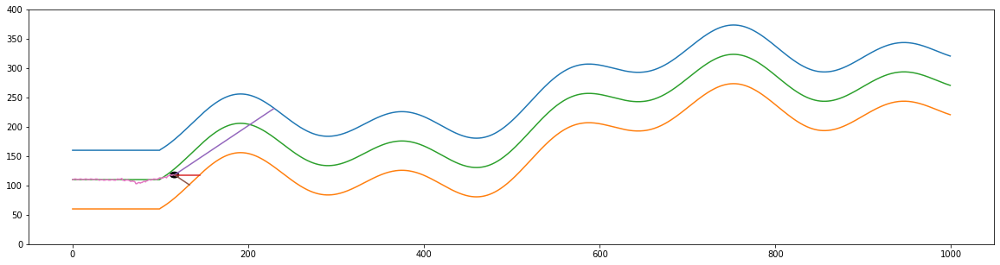

up
Sensor center =  30
Sensor from left wall =  114
Sensor from right wall =  18
most távolsagra van a felső faltól =  59.39544982058476
most távolsagra van az alsó faltól =  40.60455017941524
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  116
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.4627781753064635
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  117
			 len(self.sensor_left)   =  117
			 len(self.sensor_center) =  117
			 len(self.sensor_right)  =  117
			 self.x                  =  116
			 -------------- Teszt End --------------
self.y =  119.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1.]
(39, 4)
(39, 4)
[array([110.,  51., 138.,  

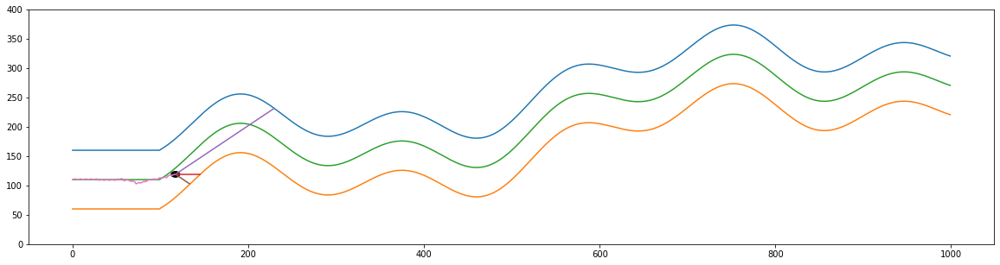

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (118, 3)
y.shape =  (118, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


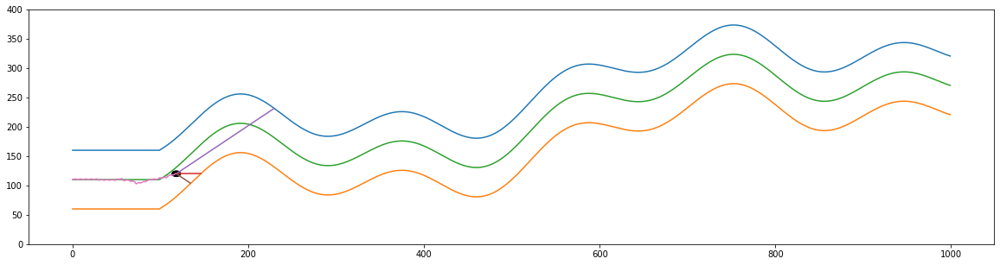

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[112  29  17]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.63917526 0.         0.        ]]
actual predicted =  [1.22676376]
actual self.y_distance[-1] =  1.5597249180275266
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0,

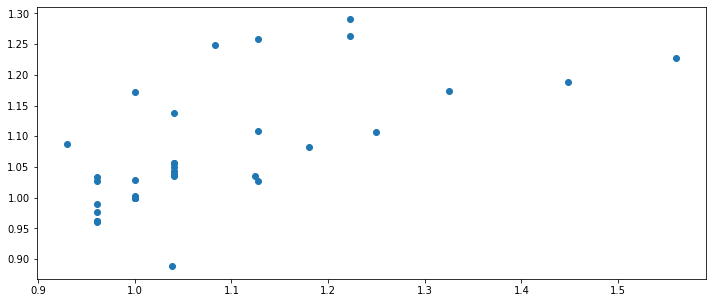

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1.]
(39, 4)
(39, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,  40

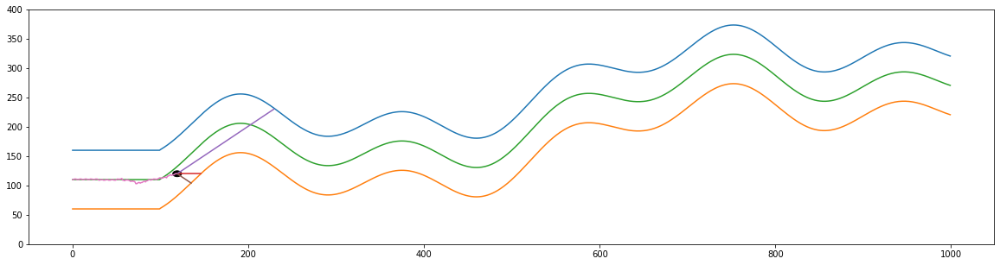

down
Sensor center =  27
Sensor from left wall =  112
Sensor from right wall =  16
most távolsagra van a felső faltól =  63.22795978443099
most távolsagra van az alsó faltól =  36.77204021556901
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  119
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.719457484919772
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  120
			 len(self.sensor_left)   =  120
			 len(self.sensor_center) =  120
			 len(self.sensor_right)  =  120
			 self.x                  =  119
			 -------------- Teszt End --------------
self.y =  119.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.]
(40, 4)
(40, 4)
[array([110.,  51., 13

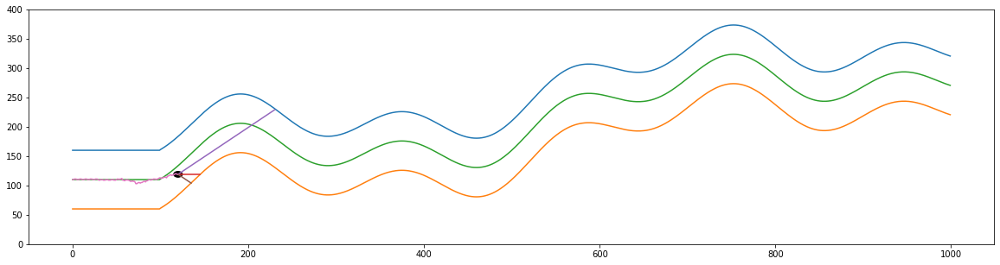

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (121, 3)
y.shape =  (121, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


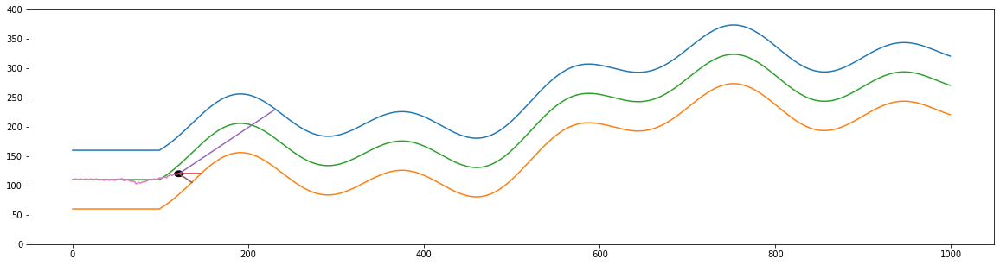

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[110  26  16]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.6185567 0.        0.       ]]
actual predicted =  [1.29696731]
actual self.y_distance[-1] =  1.8461336275967268
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.

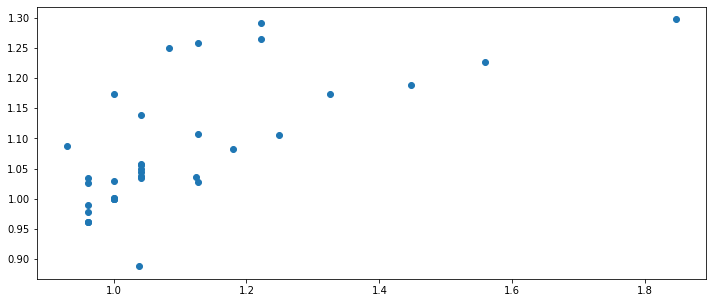

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.]
(40, 4)
(40, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  70.,

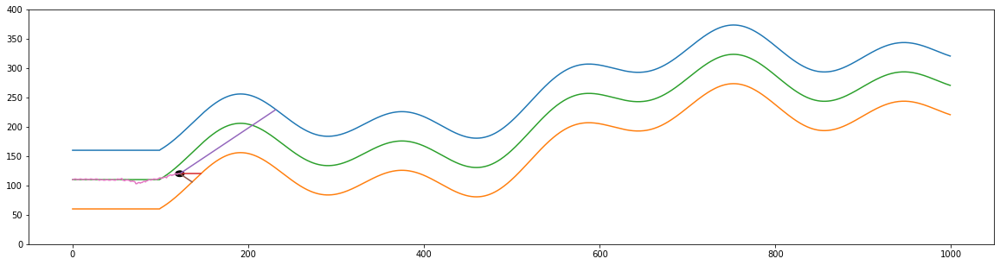

up
Sensor center =  26
Sensor from left wall =  109
Sensor from right wall =  15
most távolsagra van a felső faltól =  65.20489143234215
most távolsagra van az alsó faltól =  34.79510856765786
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  122
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.8739671786209127
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  123
			 len(self.sensor_left)   =  123
			 len(self.sensor_center) =  123
			 len(self.sensor_right)  =  123
			 self.x                  =  122
			 -------------- Teszt End --------------
self.y =  121.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1.]
(41, 4)
(41, 4)
[array([110.,  51.,

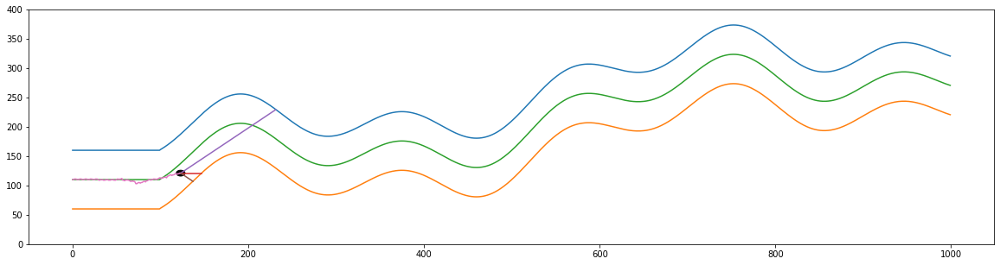

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (124, 3)
y.shape =  (124, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


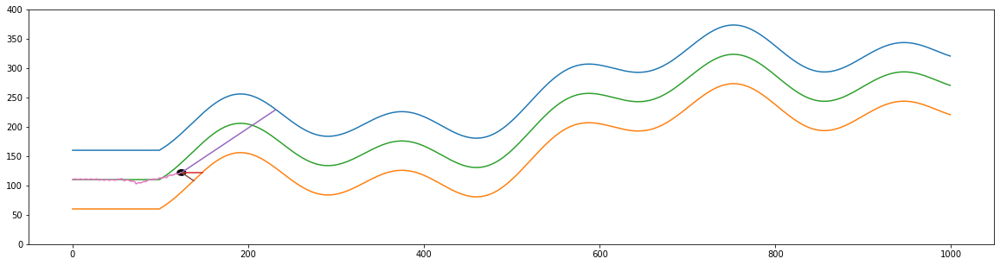

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[108  25  15]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.59793814 0.         0.        ]]
actual predicted =  [1.45915649]
actual self.y_distance[-1] =  2.0234193734381707
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0,

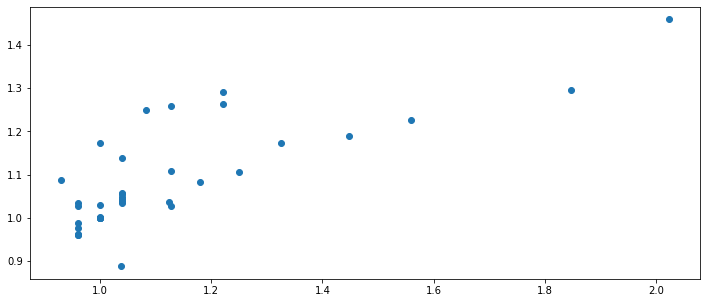

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1.]
(41, 4)
(41, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143.,  

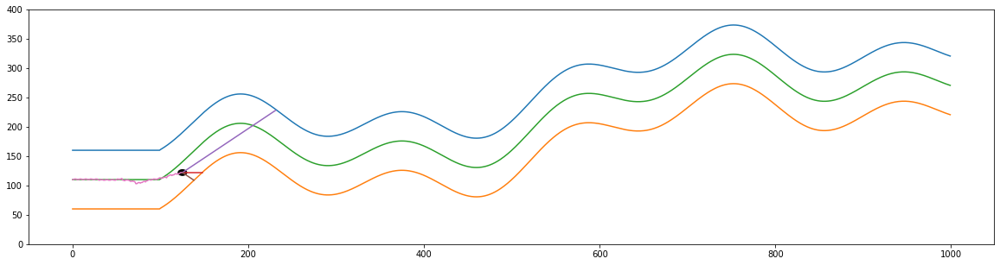

down
Sensor center =  23
Sensor from left wall =  108
Sensor from right wall =  14
most távolsagra van a felső faltól =  69.30271133689249
most távolsagra van az alsó faltól =  30.697288663107514
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  125
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  2.257616693691309
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  126
			 len(self.sensor_left)   =  126
			 len(self.sensor_center) =  126
			 len(self.sensor_right)  =  126
			 self.x                  =  125
			 -------------- Teszt End --------------
self.y =  121.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.]
(42, 4)
(42, 4)
[array([110.,

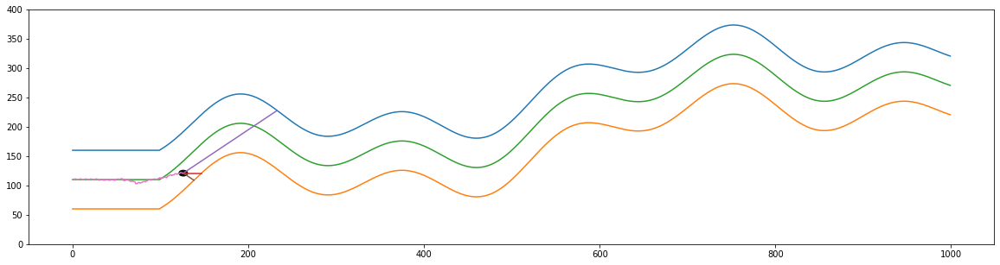

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (127, 3)
y.shape =  (127, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


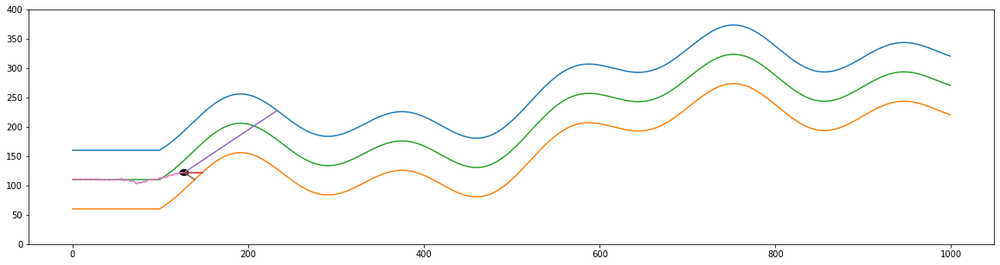

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[106  22  13]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.57731959 0.         0.        ]]
actual predicted =  [1.65689542]
actual self.y_distance[-1] =  2.458931120053159
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 

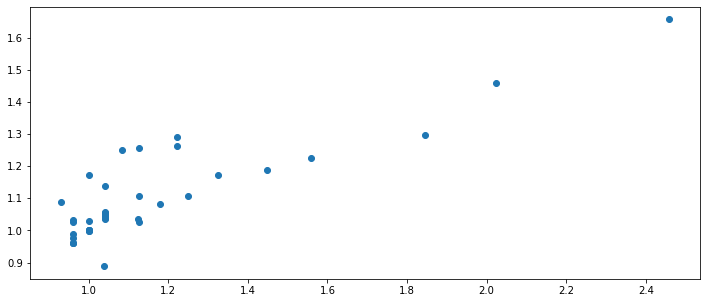

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.]
(42, 4)
(42, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107., 143

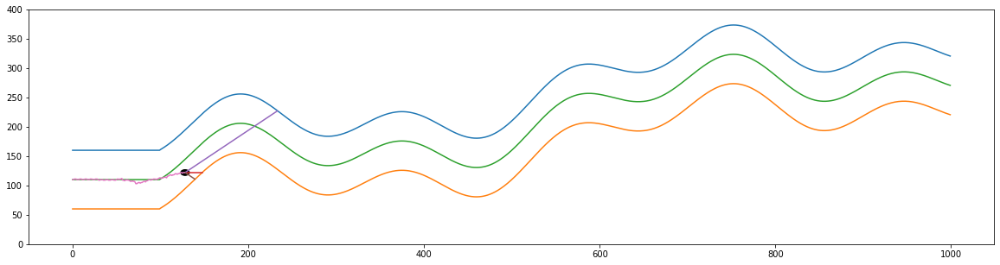

up
Sensor center =  21
Sensor from left wall =  105
Sensor from right wall =  13
most távolsagra van a felső faltól =  71.49614549514556
most távolsagra van az alsó faltól =  28.503854504854445
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  128
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  2.508297447384499
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  129
			 len(self.sensor_left)   =  129
			 len(self.sensor_center) =  129
			 len(self.sensor_right)  =  129
			 self.x                  =  128
			 -------------- Teszt End --------------
self.y =  123.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1.]
(43, 4)
(43, 4)
[array([110

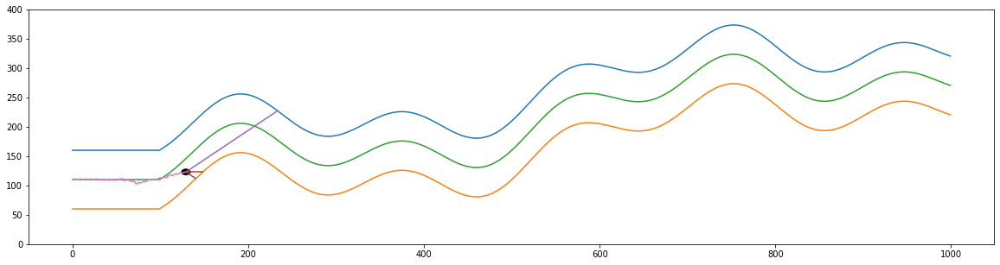

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (130, 3)
y.shape =  (130, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


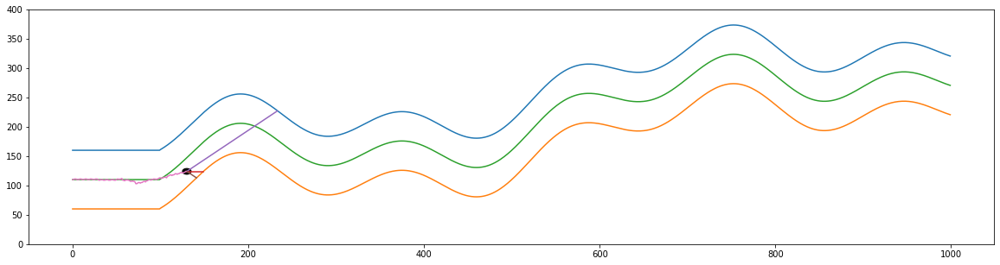

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[104  20  12]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.55670103 0.         0.        ]]
actual predicted =  [1.6905554]
actual self.y_distance[-1] =  2.7497735464839304
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 

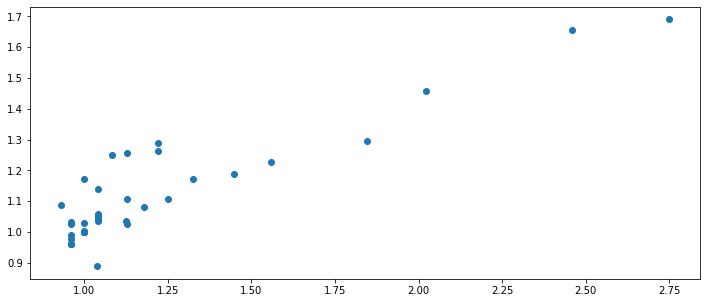

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1.]
(43, 4)
(43, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([107.,

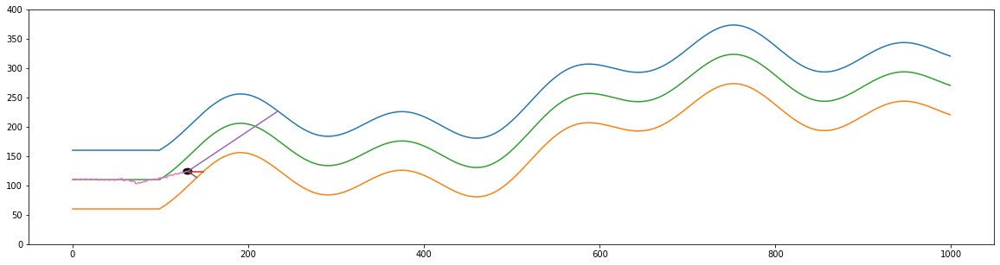

down
Sensor center =  18
Sensor from left wall =  104
Sensor from right wall =  11
most távolsagra van a felső faltól =  75.7584275704991
most távolsagra van az alsó faltól =  24.241572429500906
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  131
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  3.125144946385759
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  132
			 len(self.sensor_left)   =  132
			 len(self.sensor_center) =  132
			 len(self.sensor_right)  =  132
			 self.x                  =  131
			 -------------- Teszt End --------------
self.y =  123.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.]
(44, 4)
(44, 4)
[array

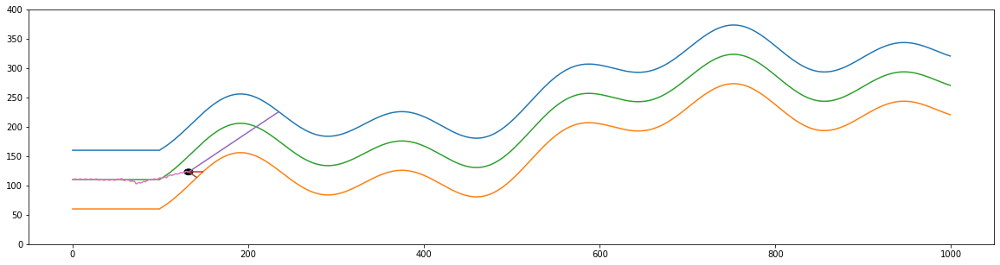

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (133, 3)
y.shape =  (133, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


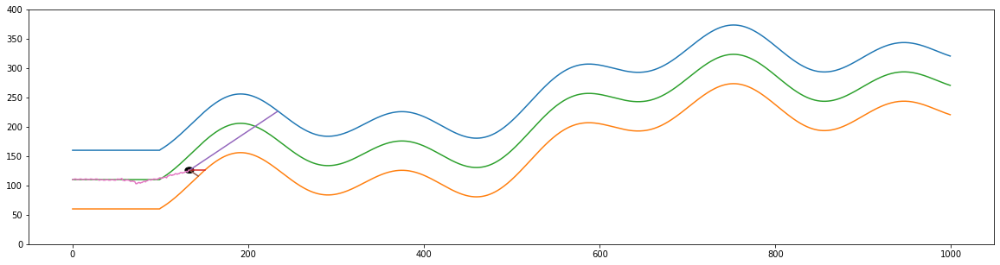

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[101  19  11]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.5257732  0.01626016 0.02380952]]
actual predicted =  [1.89992645]
actual self.y_distance[-1] =  3.102465712807158
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 

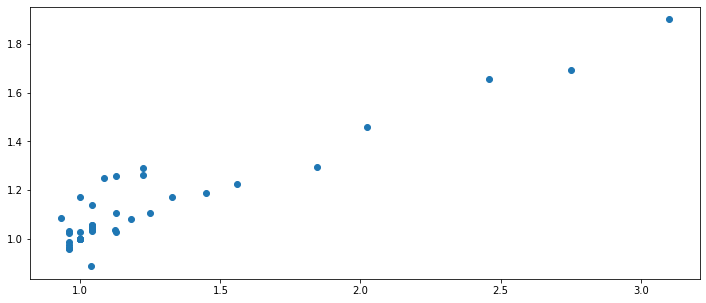

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.]
(44, 4)
(44, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), array([1

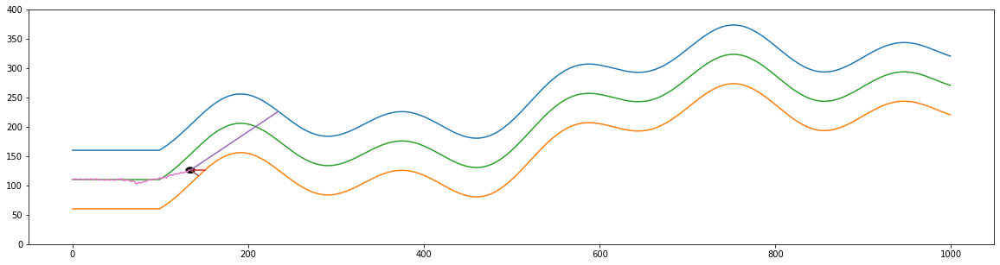

up
Sensor center =  18
Sensor from left wall =  100
Sensor from right wall =  11
most távolsagra van a felső faltól =  76.06156259886828
most távolsagra van az alsó faltól =  23.938437401131722
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  134
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  3.1773821041164685
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  135
			 len(self.sensor_left)   =  135
			 len(self.sensor_center) =  135
			 len(self.sensor_right)  =  135
			 self.x                  =  134
			 -------------- Teszt End --------------
self.y =  127.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(45, 4)
(45, 4)
[a

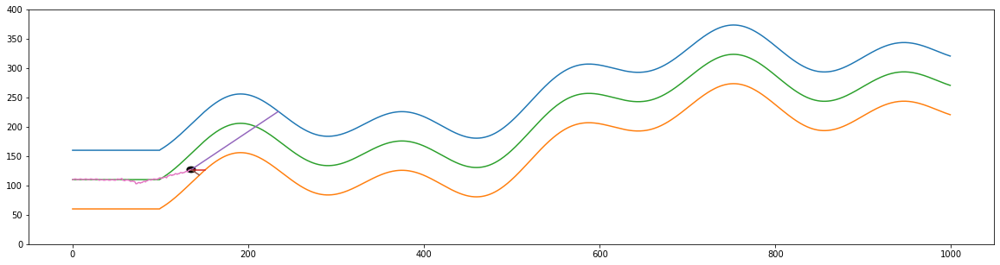

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (136, 3)
y.shape =  (136, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


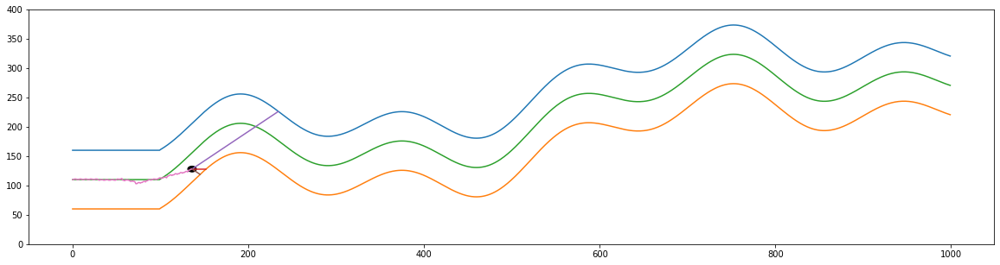

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[99 17 10]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.50515464 0.         0.        ]]
actual predicted =  [2.10357919]
actual self.y_distance[-1] =  3.532834950540231
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0

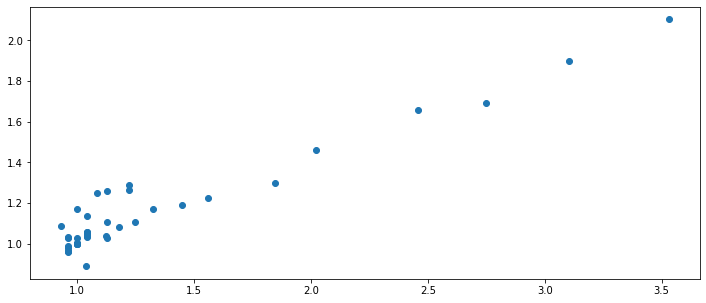

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(45, 4)
(45, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), arra

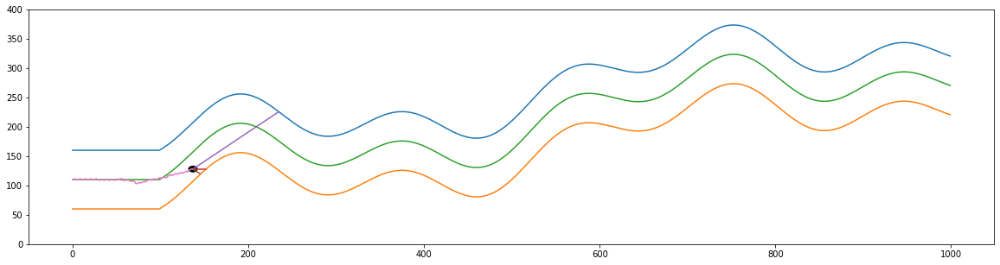

down
Sensor center =  15
Sensor from left wall =  99
Sensor from right wall =  9
most távolsagra van a felső faltól =  80.37660352763322
most távolsagra van az alsó faltól =  19.623396472366778
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  137
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  4.095957783904419
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  138
			 len(self.sensor_left)   =  138
			 len(self.sensor_center) =  138
			 len(self.sensor_right)  =  138
			 self.x                  =  137
			 -------------- Teszt End --------------
self.y =  127.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(46, 4)
(46, 4)

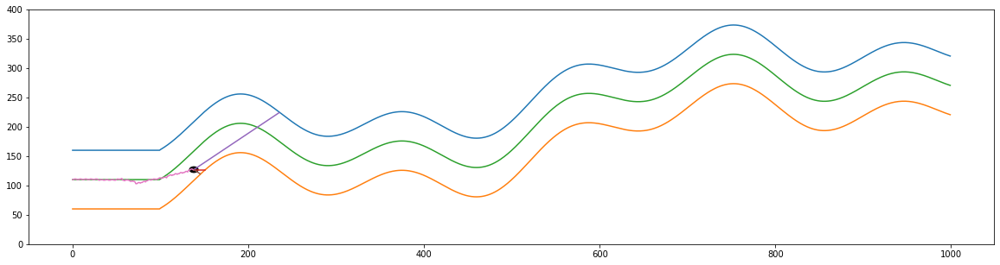

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (139, 3)
y.shape =  (139, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(46, 4)
(46, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), 

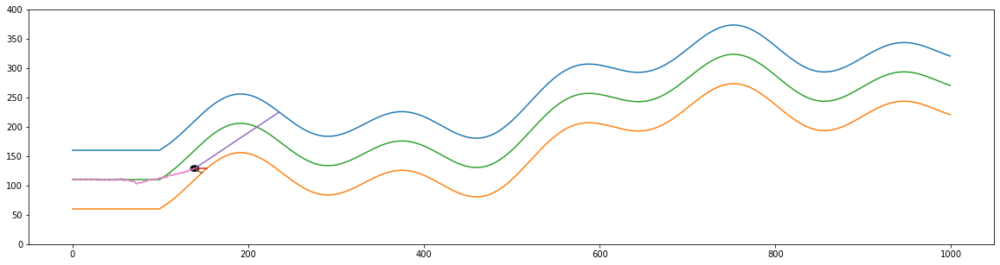

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[97 15  9]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.48453608 0.00793651 0.02272727]]
actual predicted =  [2.37259746]
actual self.y_distance[-1] =  4.331998755904533
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0

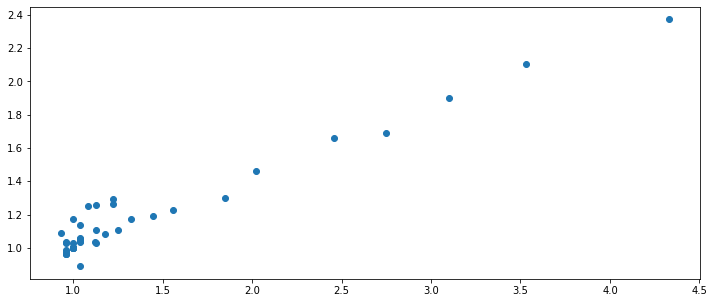

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(46, 4)
(46, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.]), 

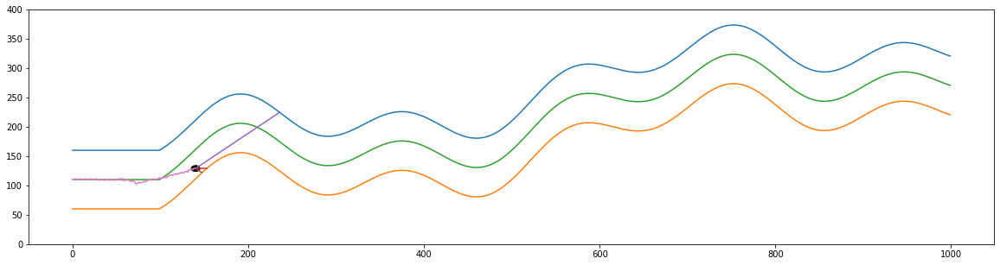

up
Sensor center =  15
Sensor from left wall =  96
Sensor from right wall =  9
most távolsagra van a felső faltól =  81.67393782694975
most távolsagra van az alsó faltól =  18.326062173050246
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  140
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  4.456709633292469
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  141
			 len(self.sensor_left)   =  141
			 len(self.sensor_center) =  141
			 len(self.sensor_right)  =  141
			 self.x                  =  140
			 -------------- Teszt End --------------
self.y =  130.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(47, 4)
(47, 

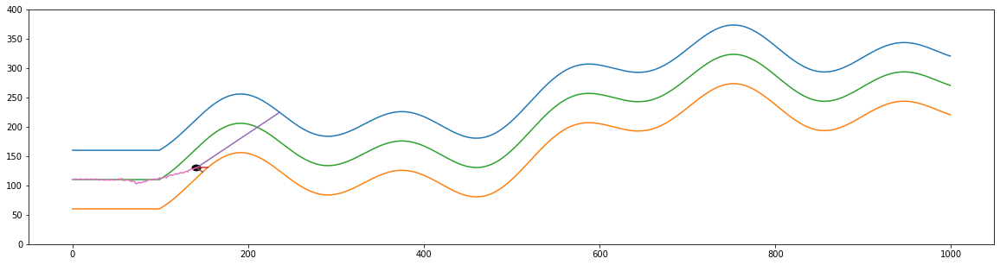

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (142, 3)
y.shape =  (142, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


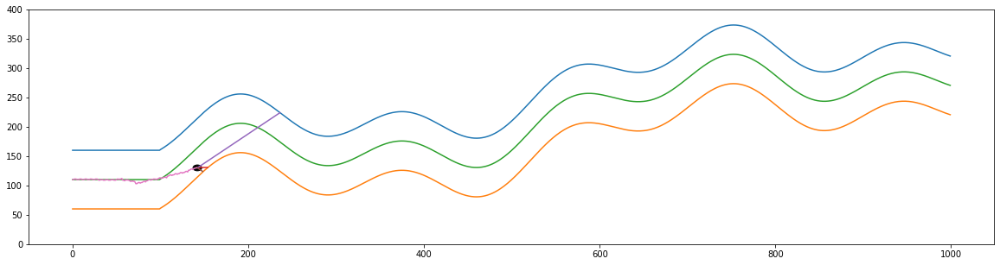

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[95 13  7]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.46391753 -0.00793651 -0.02272727]]
actual predicted =  [3.41654025]
actual self.y_distance[-1] =  5.457524517889061
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 

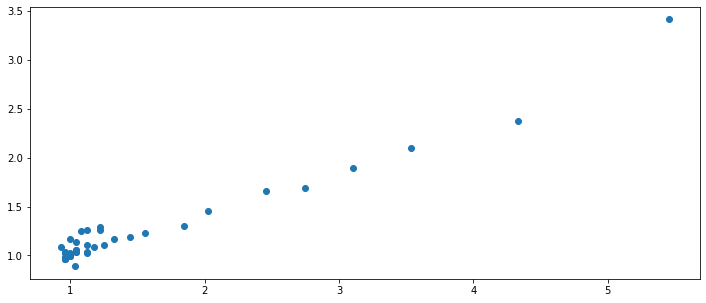

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(47, 4)
(47, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74.,  43.

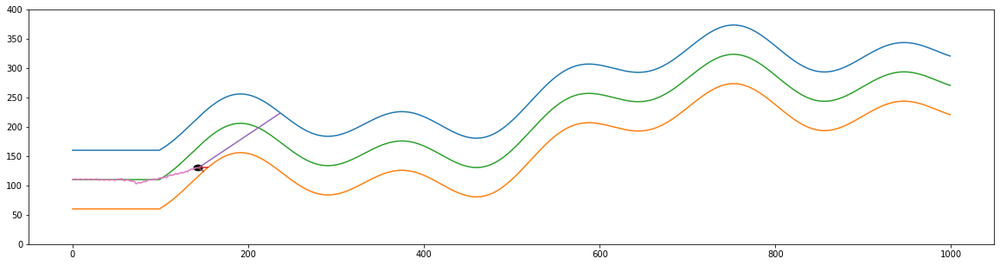

down
Sensor center =  11
Sensor from left wall =  95
Sensor from right wall =  6
most távolsagra van a felső faltól =  86.92358131177332
most távolsagra van az alsó faltól =  13.076418688226681
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  143
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  6.647353788850057
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  144
			 len(self.sensor_left)   =  144
			 len(self.sensor_center) =  144
			 len(self.sensor_right)  =  144
			 self.x                  =  143
			 -------------- Teszt End --------------
self.y =  129.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(48, 4)

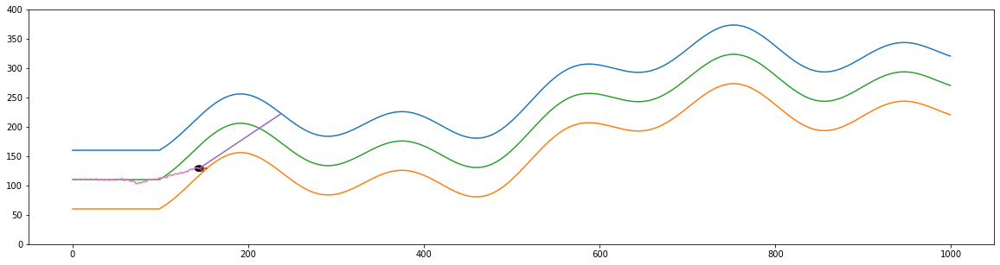

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (145, 3)
y.shape =  (145, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


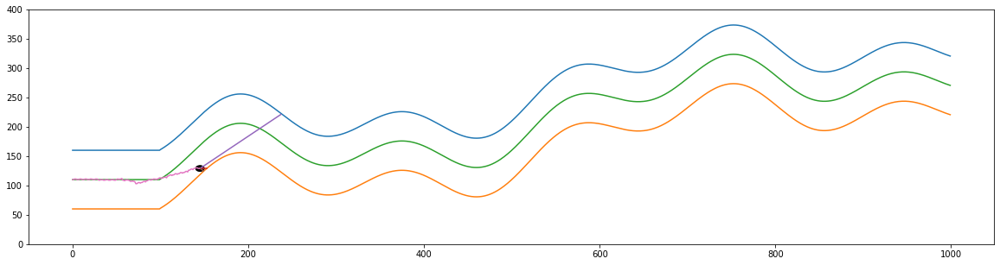

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[93  9  5]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[ 0.44329897 -0.00769231 -0.02173913]]
actual predicted =  [3.86672213]
actual self.y_distance[-1] =  8.723211978218082
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 

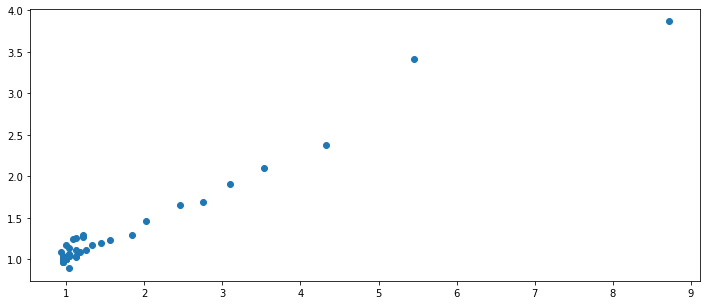

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(48, 4)
(48, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  74., 

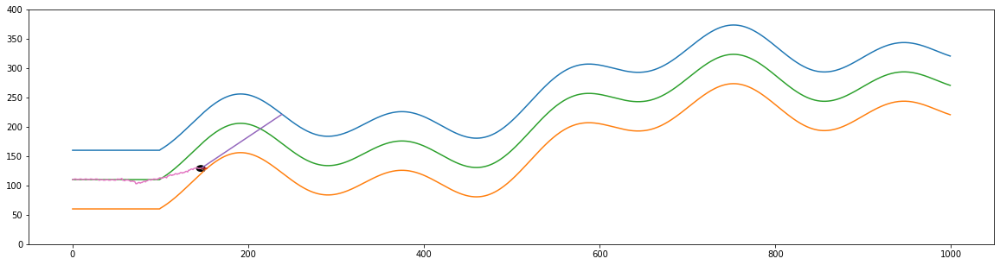

up
Sensor center =  9
Sensor from left wall =  92
Sensor from right wall =  5
most távolsagra van a felső faltól =  90.09547624028835
most távolsagra van az alsó faltól =  9.904523759711665
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  146
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  9.09639659877106
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  147
			 len(self.sensor_left)   =  147
			 len(self.sensor_center) =  147
			 len(self.sensor_right)  =  147
			 self.x                  =  146
			 -------------- Teszt End --------------
self.y =  130.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(49, 4)


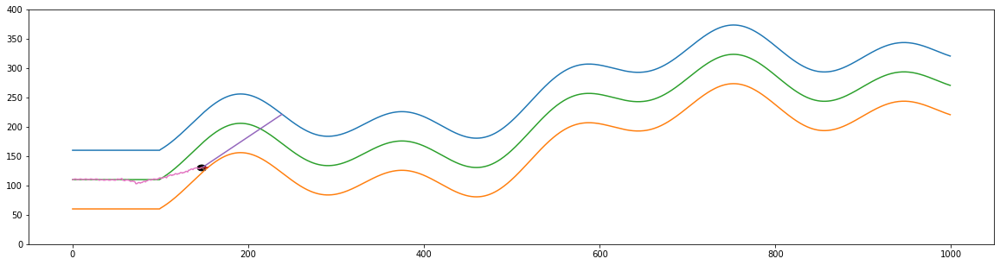

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (148, 3)
y.shape =  (148, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


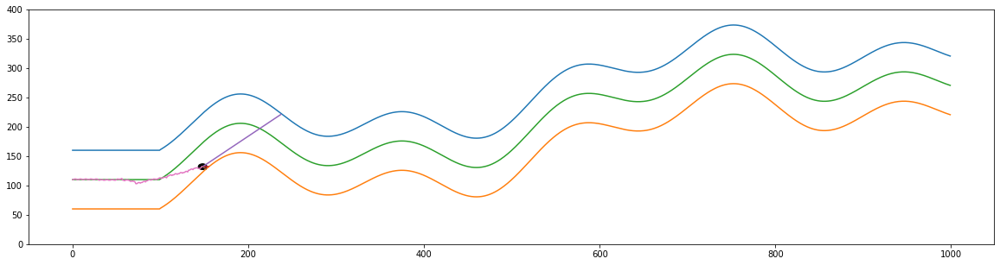

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[90  8  5]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.41237113 0.         0.        ]]
actual predicted =  [4.06603691]
actual self.y_distance[-1] =  9.891817410667942
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0

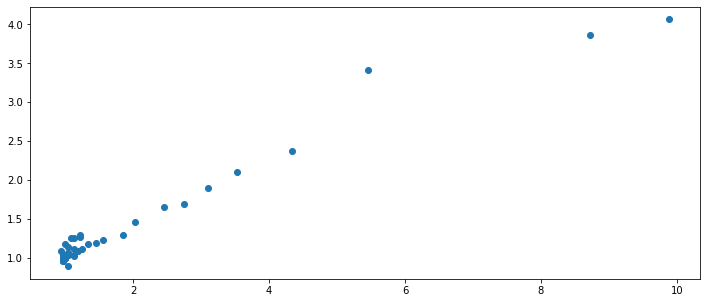

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(49, 4)
(49, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.,  7

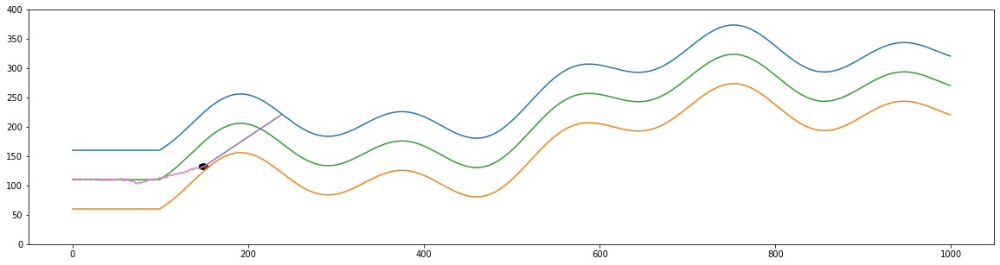

down
Sensor center =  7
Sensor from left wall =  90
Sensor from right wall =  4
most távolsagra van a felső faltól =  93.15979071109382
most távolsagra van az alsó faltól =  6.8402092889061805
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  149
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  13.619435718463379
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  150
			 len(self.sensor_left)   =  150
			 len(self.sensor_center) =  150
			 len(self.sensor_right)  =  150
			 self.x                  =  149
			 -------------- Teszt End --------------
self.y =  131.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]

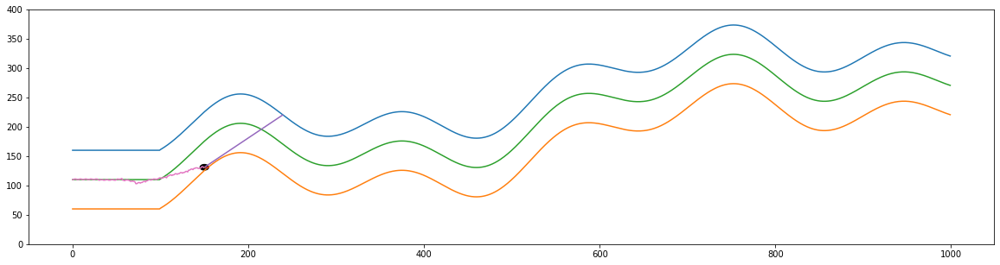

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (151, 3)
y.shape =  (151, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


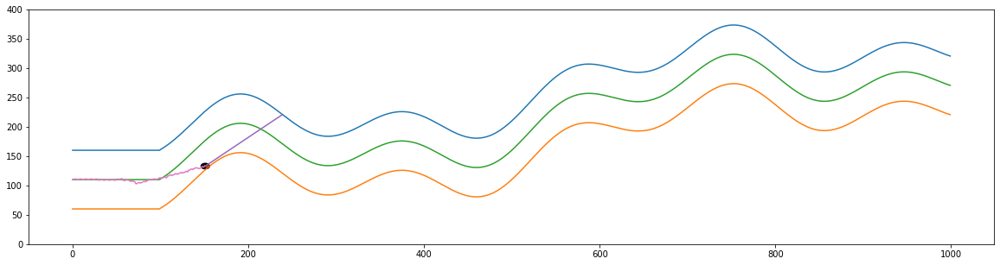

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[88  6  4]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.39175258 0.         0.02040816]]
actual predicted =  [13.00371072]
actual self.y_distance[-1] =  15.116199280527729
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1

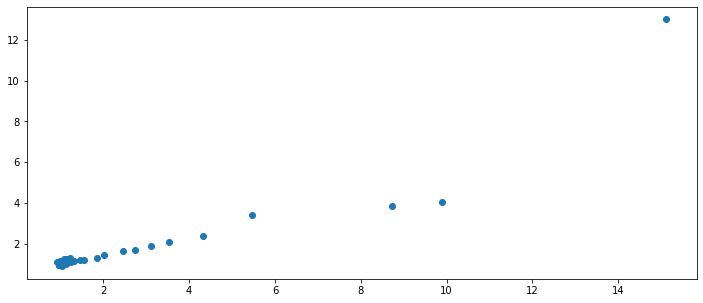

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(50, 4)
(50, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 143.

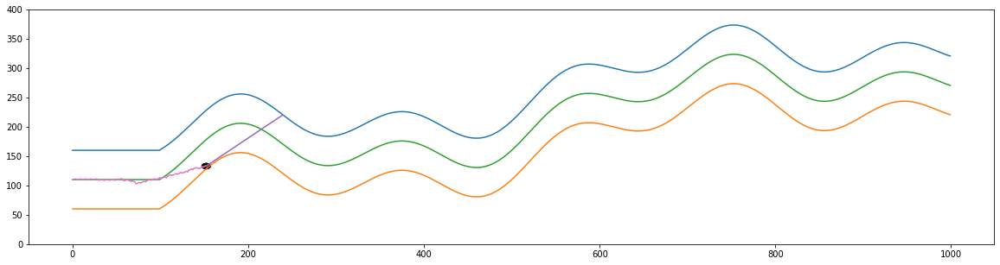

up
Sensor center =  6
Sensor from left wall =  87
Sensor from right wall =  4
most távolsagra van a felső faltól =  94.08721636790617
most távolsagra van az alsó faltól =  5.912783632093834
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  152
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  15.912507918810485
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  153
			 len(self.sensor_left)   =  153
			 len(self.sensor_center) =  153
			 len(self.sensor_right)  =  153
			 self.x                  =  152
			 -------------- Teszt End --------------
self.y =  134.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.

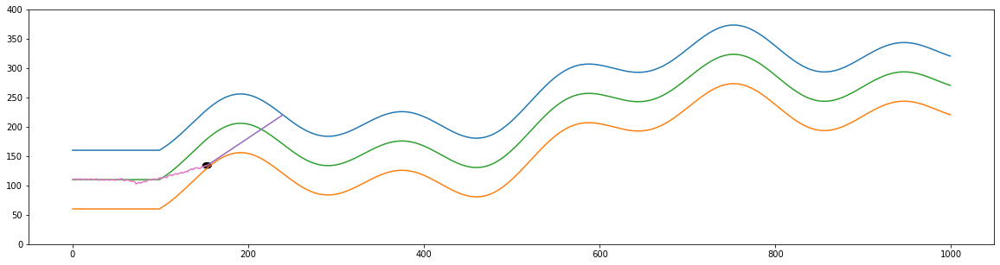

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (154, 3)
y.shape =  (154, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


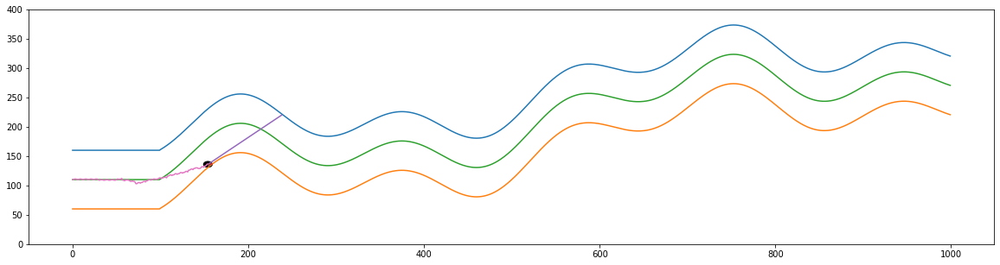

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[85  6  3]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.36082474 0.00740741 0.        ]]
actual predicted =  [17.74823072]
actual self.y_distance[-1] =  17.57126953571761
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.

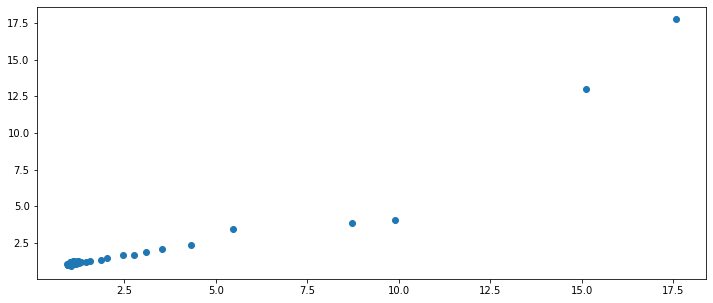

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(51, 4)
(51, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([109., 

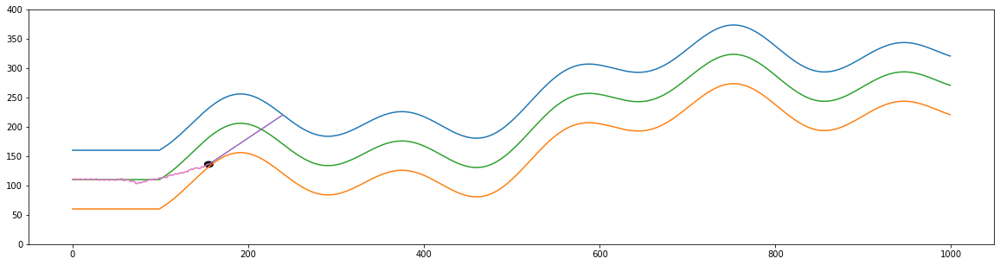

down
Sensor center =  4
Sensor from left wall =  85
Sensor from right wall =  2
most távolsagra van a felső faltól =  96.84926143683808
most távolsagra van az alsó faltól =  3.150738563161923
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  155
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  30.738590173487776
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  156
			 len(self.sensor_left)   =  156
			 len(self.sensor_center) =  156
			 len(self.sensor_right)  =  156
			 self.x                  =  155
			 -------------- Teszt End --------------
self.y =  135.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  

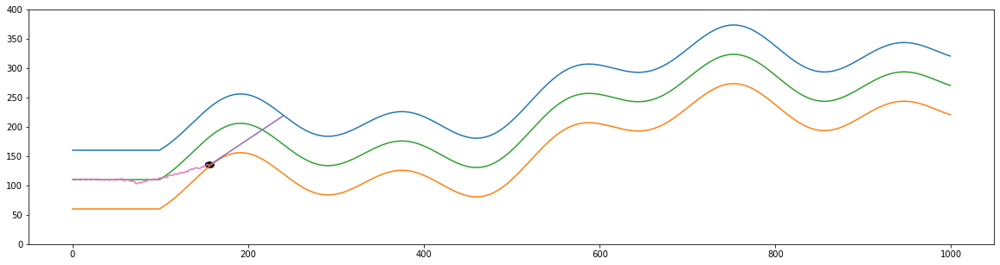

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (157, 3)
y.shape =  (157, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


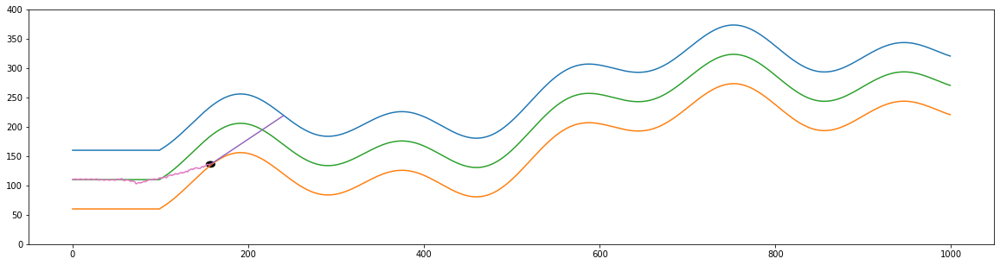

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[84  3  2]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.35051546 0.         0.        ]]
actual predicted =  [34.25826405]
actual self.y_distance[-1] =  56.20280056610522
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.

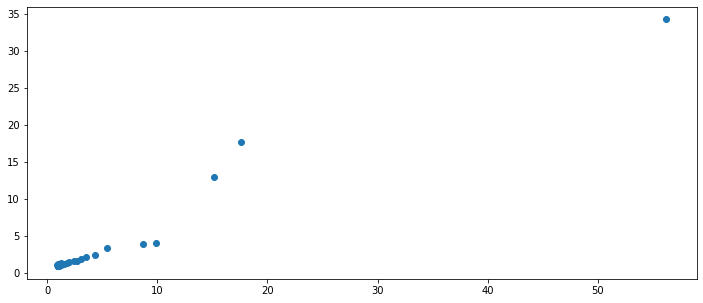

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(52, 4)
(52, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array([10

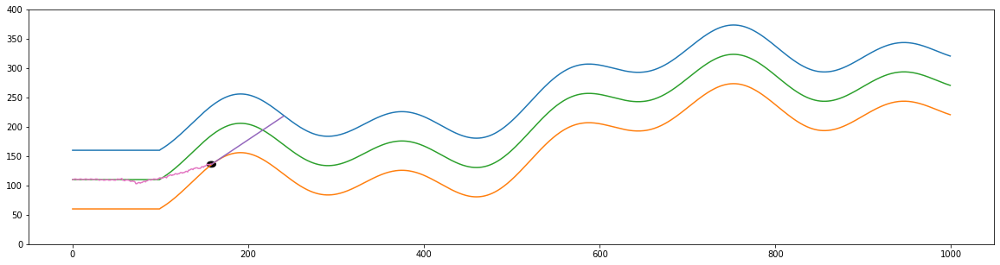

up
Sensor center =  3
Sensor from left wall =  83
Sensor from right wall =  2
most távolsagra van a felső faltól =  98.41853616733414
most távolsagra van az alsó faltól =  1.581463832665861
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  158
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  62.23255577171866
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  159
			 len(self.sensor_left)   =  159
			 len(self.sensor_center) =  159
			 len(self.sensor_right)  =  159
			 self.x                  =  158
			 -------------- Teszt End --------------
self.y =  137.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. 

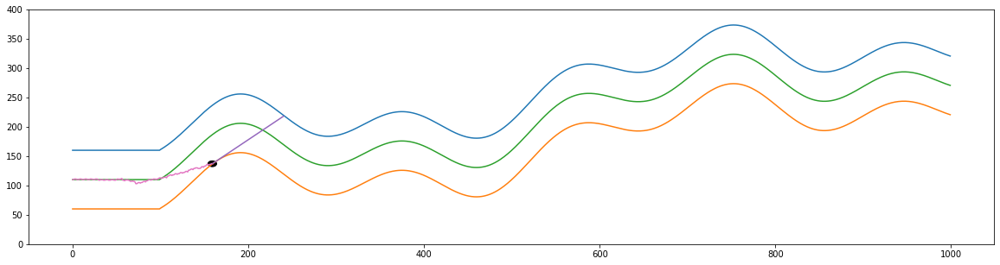

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (160, 3)
y.shape =  (160, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


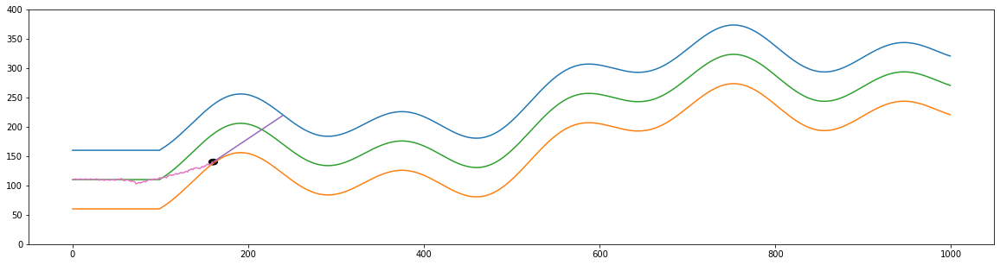

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[80  4  2]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.30927835 0.01449275 0.01960784]]
actual predicted =  [143.19557827]
actual self.y_distance[-1] =  42.06720421784467
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1

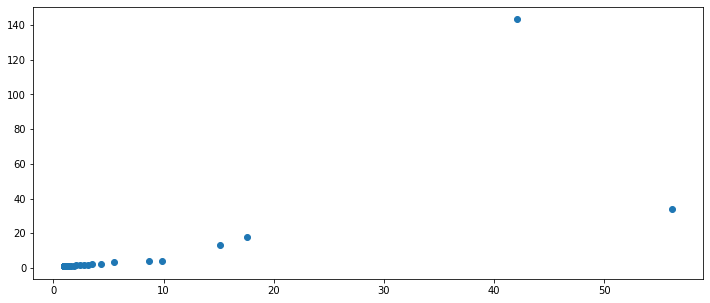

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.]
(53, 4)
(53, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), array

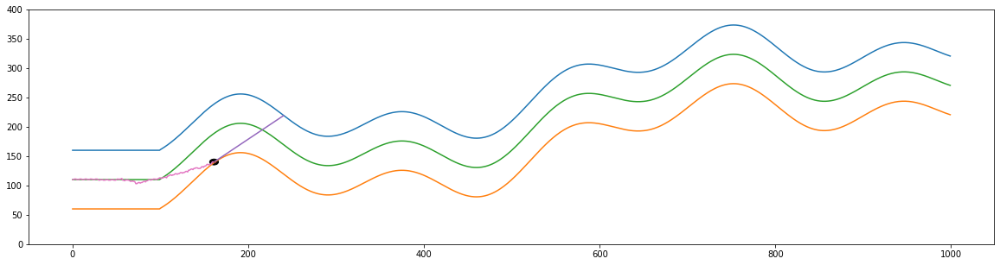

down
Sensor center =  2
Sensor from left wall =  80
Sensor from right wall =  1
most távolsagra van a felső faltól =  99.76902782313368
most távolsagra van az alsó faltól =  0.23097217686631666
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  161
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  431.9525805087707
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  162
			 len(self.sensor_left)   =  162
			 len(self.sensor_center) =  162
			 len(self.sensor_right)  =  162
			 self.x                  =  161
			 -------------- Teszt End --------------
self.y =  139.0
Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1. 

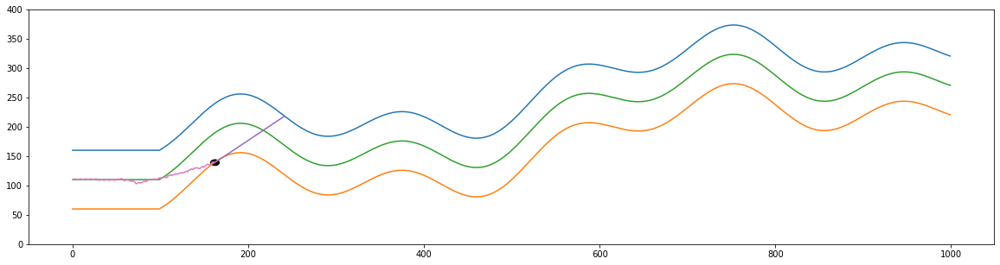

------------------------------ IF i % 3 == 0 ------------------------------
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (163, 3)
y.shape =  (163, 1)
X       =  [[ 51 140  51]
 [ 51 139  51]
 [ 51 138  51]
 [ 50 138  52]
 [ 50 137  52]
 [ 50 136  52]
 [ 51 134  51]
 [ 51 133  51]
 [ 51 132  51]
 [ 50 132  52]
 [ 50 131  52]
 [ 50 130  52]
 [ 51 128  51]
 [ 51 127  51]
 [ 51 126  51]
 [ 50 126  52]
 [ 50 125  52]
 [ 50 124  52]
 [ 51 122  51]
 [ 51 121  51]
 [ 51 120  51]
 [ 50 120  52]
 [ 50 119  52]
 [ 50 118  52]
 [ 51 116  51]
 [ 51 115  51]
 [ 51 114  51]
 [ 50 114  52]
 [ 50 113  52]
 [ 50 112  52]
 [ 51 110  51]
 [ 52 108  50]
 [ 52 107  50]
 [ 51 107  51]
 [ 51 106  51]
 [ 51 105  51]
 [ 52 103  50]
 [ 52 102  50]
 [ 52 101  50]
 [ 51 101  51]
 [ 51 100  51]
 [ 51  99  51]
 [ 52  97  50]
 [ 52  96  50]
 [ 52  95  50]
 [ 51  95  51]
 [ 51  94  51]
 [ 51  93  51]
 [ 54  91  50]
 [147  90  50]

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


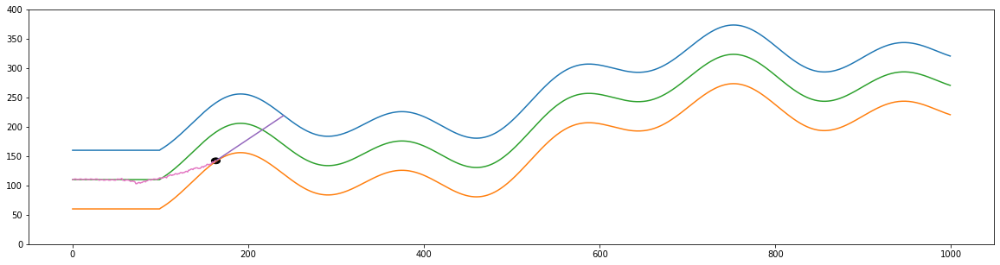

------------------------------ IF i % 3 == 1 ------------------------------
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X =  [[78  3  2]]
		 ---------- itt hiányzott a normalizáció X-re és y-re is, most megtettük -----------
actual _X =  [[0.28865979 0.01438849 0.01960784]]
actual predicted =  [43.56282542]
actual self.y_distance[-1] =  87.41977556415696
actual self.y_distance     =  [1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0, 1.0, 0.9607843137254902, 0.9607843137254902, 0.9607843137254902, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.0, 1.0408163265306123, 1.0408163265306123, 1.0408163265306123, 1.0, 1.0, 1.

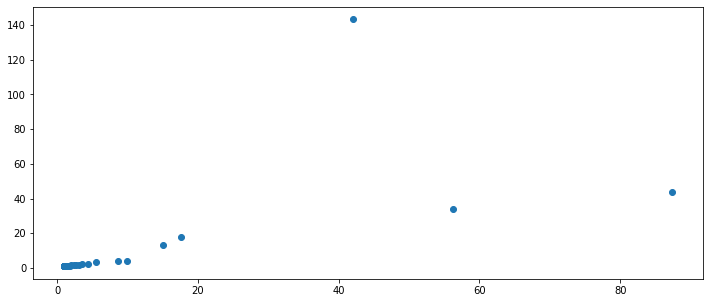

Van elég before after adatunk
--------------------------------------
[ 1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.
  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1. -1.]
(54, 4)
(54, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([111.,  50., 130.,  52.]), array([110.,  51., 126.,  51.]), array([111.,  50., 124.,  52.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  50., 112.,  52.]), array([109.,  52., 107.,  50.]), array([110.,  51., 105.,  51.]), array([109.,  52., 101.,  50.]), array([110.,  51.,  99.,  51.]), array([109.,  52.,  95.,  50.]), array([110.,  51.,  93.,  51.]), array([109., 147.,  89.,  50.]), array([111., 145.,  88.,  50.]), array([111., 144.,  85.,  48.]), array([109., 145.,  80.,  46.]), array([109., 144.,  77.,  44.]), a

KeyboardInterrupt: ignored

In [84]:
auto.run()

<a name="irodalom"></a>

# Felhasznált irodalom és internetes cimek

Itt gyűjtöttem össze a menet közben összegyűjt okosságokat

[vissza a tartalomhoz](#tartalom)<br>

Scikit-learn - MLPRegressor API
<br>
https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html


Fogalmak és probléma meghatározás
<br>
https://www.rubrik.com/blog/architecture/20/12/customized-autoscaling--minimize-your-cloud-cost


https://github.com/kubernetes/autoscaler/blob/master/cluster-autoscaler/FAQ.md#what-are-the-parameters-to-ca

https://arxiv.org/pdf/1608.04030.pdf

Metrikák amivel a szollgáltatás minőségét mérik különböző esetekben
<br>
https://blog.avinetworks.com/autoscaling-metrics

------------

NumPy API Reference Guide
<br>
https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html


Seaborn API Reference Guide
<br>
https://seaborn.pydata.org/examples/pair_grid_with_kde.html

